In [ ]:
!pip install rasterstats rasterio geopandas
import geopandas as gpd
import rasterio
import rasterstats
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 24.3 MB/s eta 0:00:00


In [ ]:
!pip install pandas pyjstat
from pyjstat import pyjstat
import pandas as pd
import json

!pip install requests
import requests
from google.colab import drive


!pip install rasterstats rasterio geopandas
import geopandas as gpd
import rasterio
import rasterstats
import numpy as np

from google.colab import drive
drive.mount('/content/drive')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 798.0/798.0 kB 8.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyjstat: filename=pyjstat-2.4.0-py3-none-any.whl size=22763 sha256=6fa6c04299ae667ab750f520a4fa437a8351cc9ef1b31150f4bb20baad231f51
  Stored in directory: /root/.cache/pip/wheels/d7/b0/ac/350c026feabb6a22b2a5b3fb1f694e724c0f57c2c43ccaf738
Successfully built pyjstat
Mounted at /content/drive


## Loading Data & processing

### Load EVs

In [ ]:
df_EV_CH = pd.read_excel('/content/drive/MyDrive/ML_project/Data/EV_cleaned_CH.xlsx')

In [ ]:
df_EV_CH.columns

Index(['Location', 'Vehicle', 'Month', '2005', '2006', '2007', '2008', '2009',
       '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018',
       '2019', '2020', '2021', '2022', '2023', '2024'],
      dtype='object')

In [ ]:
df_EV_CH.head()

,Location,Vehicle,Month,2005,2006,2007,2008,2009,2010,2011,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Schweiz,> Personenwagen,Januar,0,1,1,2,2,10,38,...,146,239,313,262,453,812,1097,2201,2884,2436
1,Schweiz,NaN,Februar,3,0,3,2,2,7,32,...,100,160,213,418,751,789,1429,2528,2645,3330
2,Schweiz,NaN,März,0,1,2,2,1,10,67,...,369,436,585,691,1920,1607,2364,4356,4897,4851
3,Schweiz,NaN,April,2,0,0,1,2,6,39,...,364,239,235,304,1047,519,2010,2177,3389,3151
4,Schweiz,NaN,Mai,0,1,1,3,1,5,39,...,380,193,281,288,699,707,1964,2668,4364,3651


In [ ]:
#the description of the data was lacking in many rows, this code fills it in. I checked by downloading the excel, code is correct

# Fill NaN values in 'location' and 'vehicle' columns with the previous row's value.
df_EV_CH['Location'].fillna(method='ffill', inplace=True)
df_EV_CH['Vehicle'].fillna(method='ffill', inplace=True)


<ipython-input-7-ce583a3d6ece>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_EV_CH['Location'].fillna(method='ffill', inplace=True)
<ipython-input-7-ce583a3d6ece>:4: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_EV_CH['Location'].fillna(method='ffill', inplace=True)
<ipython-input-7-ce583a3d6ece>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The

In [ ]:
df_EV_CH.head(50)

,Location,Vehicle,Month,2005,2006,2007,2008,2009,2010,2011,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Schweiz,> Personenwagen,Januar,0,1,1,2,2,10,38,...,146,239,313,262,453,812,1097,2201,2884,2436
1,Schweiz,> Personenwagen,Februar,3,0,3,2,2,7,32,...,100,160,213,418,751,789,1429,2528,2645,3330
2,Schweiz,> Personenwagen,März,0,1,2,2,1,10,67,...,369,436,585,691,1920,1607,2364,4356,4897,4851
3,Schweiz,> Personenwagen,April,2,0,0,1,2,6,39,...,364,239,235,304,1047,519,2010,2177,3389,3151
4,Schweiz,> Personenwagen,Mai,0,1,1,3,1,5,39,...,380,193,281,288,699,707,1964,2668,4364,3651
5,Schweiz,> Personenwagen,Juni,1,1,0,3,7,65,40,...,502,388,500,590,1158,1385,3706,4512,5213,4375
6,Schweiz,> Personenwagen,Juli,0,0,1,1,5,13,27,...,360,143,263,245,684,1010,1846,1980,3614,3448
7,Schweiz,> Personenwagen,August,1,1,1,1,3,19,23,...,264,294,337,334,622,1626,2255,2297,4334,3431
8,Schweiz,> Personenwagen,September,0,2,0,0,3,9,49,...,318,482,562,546,1577,2904,4025,4192,5161,4598
9,Schweiz,> Personenwagen,Oktober,0,0,1,1,18,15,16,...,267,211,366,453,664,1525,2176,2438,4511,3563


In [ ]:
unique_vehicles = df_EV_CH['Vehicle'].unique()
unique_vehicles

array(['> Personenwagen', '... Personenwagen',
       '... Schwerer Personenwagen', '> Personentransportfahrzeuge',
       '... Leichter Motorwagen', '... Schwerer Motorwagen',
       '... Gesellschaftswagen', '... Kleinbus', '... Gelenkbus',
       '> Sachentransportfahrzeuge', '... Lieferwagen', '... Lastwagen',
       '... Sattelmotorfahrzeug', '... Sattelschlepper',
       '> Landwirtschaftsfahrzeuge', '... Landwirtschaftlicher Traktor',
       '... Landwirtschaftlicher Arbeitskarren',
       '... Landwirtschaftlicher Motorkarren',
       '... Landwirtschaftlicher Motoreinachser',
       '... Landwirtschaftliches Kombinationsfahrzeug',
       '> Industriefahrzeuge', '... Traktor', '... Arbeitsmaschine',
       '... Arbeitskarren', '... Motorkarren', '... Motoreinachser',
       '> Motorräder', '... Motorrad', '... Kleinmotorrad',
       '... Motorrad-Dreirad', '... Motorrad-Seitenwagen',
       '... Kleinmotorrad-Dreirad', '... Leichtmotorfahrzeug',
       '... Kleinmotorfahrzeug',

In [ ]:
# Group by 'Location', 'Month', and sum the 'Vehicles' for each year.
# Use a list instead of a tuple to select multiple columns
df_EV_CH = df_EV_CH.groupby(['Location', 'Month'])[['2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018', '2019', '2020', '2021', '2022']].sum().reset_index()

df_EV_CH

,Location,Month,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aargau,April,2,2,6,10,18,10,22,50,30,40,78,52,80,70,198,108,348,472
1,Aargau,August,0,0,0,6,8,22,8,44,20,26,64,68,58,66,130,328,444,448
2,Aargau,Dezember,0,0,4,6,6,8,4,16,46,58,52,54,94,148,528,884,942,1202
3,Aargau,Februar,2,4,0,12,0,2,8,20,18,8,30,40,48,50,132,140,328,460
4,Aargau,Januar,6,0,2,0,4,0,10,12,8,18,34,54,54,50,42,144,212,394
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,Zürich,Mai,8,10,4,10,16,32,56,154,110,174,504,192,172,242,460,408,846,1286
332,Zürich,März,4,0,8,22,22,36,70,184,112,234,316,342,340,316,1004,804,1154,1884
333,Zürich,November,10,2,8,8,16,50,74,98,156,160,578,178,954,358,440,1164,1660,1962
334,Zürich,Oktober,4,0,6,18,24,42,38,126,90,136,238,230,238,234,426,798,1092,1072


In [ ]:
# Reshape the DataFrame from wide to long format
df_EV_CH = pd.melt(df_EV_CH,
                   id_vars=['Location', 'Month'],
                   var_name='Year')

# Convert 'Year' column to numeric
df_EV_CH['Year'] = pd.to_numeric(df_EV_CH['Year'])

df_EV_CH

,Location,Month,Year,value
0,Aargau,April,2005,2
1,Aargau,August,2005,0
2,Aargau,Dezember,2005,0
3,Aargau,Februar,2005,2
4,Aargau,Januar,2005,6
...,...,...,...,...
6043,Zürich,Mai,2022,1286
6044,Zürich,März,2022,1884
6045,Zürich,November,2022,1962
6046,Zürich,Oktober,2022,1072


In [ ]:
# Create a dictionary mapping month names to numbers
month_mapping = {
    'Januar': 1,
    'Februar': 2,
    'März': 3,
    'April': 4,
    'Mai': 5,
    'Juni': 6,
    'Juli': 7,
    'August': 8,
    'September': 9,
    'Oktober': 10,
    'November': 11,
    'Dezember': 12
}

# Replace month names with numbers in the 'Month' column
df_EV_CH['Month'] = df_EV_CH['Month'].map(month_mapping)

In [ ]:
df_EV_CH = df_EV_CH.rename(columns={'value': 'Number_EV'})
# Rename the 'Canton' column in df_NOX_subset to 'Location'
df_EV_CH = df_EV_CH.rename(columns={'Location': 'Canton'})

In [ ]:
df_EV_CH

,Canton,Month,Year,Number_EV
0,Aargau,4,2005,2
1,Aargau,8,2005,0
2,Aargau,12,2005,0
3,Aargau,2,2005,2
4,Aargau,1,2005,6
...,...,...,...,...
6043,Zürich,5,2022,1286
6044,Zürich,3,2022,1884
6045,Zürich,11,2022,1962
6046,Zürich,10,2022,1072


In [ ]:
unique = df_EV_CH['Canton'].unique()
unique

array(['Aargau', 'Appenzell Ausserrhoden', 'Appenzell Innerrhoden',
       'Basel-Landschaft', 'Basel-Stadt', 'Bern', 'Bund',
       'Fribourg / Freiburg', 'Genève', 'Glarus',
       'Graubünden / Grigioni / Grischun', 'Jura', 'Luzern', 'Neuchâtel',
       'Nidwalden', 'Obwalden', 'Schaffhausen', 'Schweiz', 'Schwyz',
       'Solothurn', 'St. Gallen', 'Thurgau', 'Ticino', 'Uri',
       'Valais / Wallis', 'Vaud', 'Zug', 'Zürich'], dtype=object)

In [ ]:
# Create the mapping dictionary
mapping = {
    'Aargau': 'Aargau',
    'Appenzell Ausserrhoden': 'Appenzell Ausserrhoden',
    'Appenzell Innerrhoden': 'Appenzell Innerrhoden',
    'Basel-Landschaft': 'Basel-Landschaft',
    'Basel-Stadt': 'Basel-Stadt',
    'Bern': 'Bern',
    'Bund': 'Bund',
    'Fribourg / Freiburg': 'Freiburg',
    'Genève': 'Genf',
    'Glarus': 'Glarus',
    'Graubünden / Grigioni / Grischun': 'Graubünden',
    'Jura': 'Jura',
    'Luzern': 'Luzern',
    'Neuchâtel': 'Neuenburg',
    'Nidwalden': 'Nidwalden',
    'Obwalden': 'Obwalden',
    'Schaffhausen': 'Schaffhausen',
    'Schweiz': 'Schweiz',
    'Schwyz': 'Schwyz',
    'Solothurn': 'Solothurn',
    'St. Gallen': 'St. Gallen',
    'Thurgau': 'Thurgau',
    'Ticino': 'Tessin',
    'Uri': 'Uri',
    'Valais / Wallis': 'Wallis',
    'Vaud': 'Waad',
    'Zug': 'Zug',
    'Zürich': 'Zürich'
}

# Use the map function to rename the values in the 'Canton' column
df_EV_CH['Canton'] = df_EV_CH['Canton'].map(mapping)

### Total cars

In [ ]:
df_cars = pd.read_excel('/content/drive/MyDrive/ML_project/Data/Cars_total.xlsx')

In [ ]:
df_cars.head(10)

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20
0,Canton,Vehicle,Fuel,Month,2006,2007,2008,2009,2010,2011,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
1,Schweiz,> Personenwagen,Benzin,1,12641,11917,13441,11730,12561,13435,...,12274,12031,10595,11130,10712,13366,12709,10727,7308,6636
2,NaN,NaN,NaN,2,11987,12446,14001,11911,12645,15101,...,13114,13115,13121,12885,13036,14071,13921,11008,7691,6717
3,NaN,NaN,NaN,3,19181,17691,15593,16329,20136,20779,...,17800,16266,18802,17102,18231,18146,18367,9288,12010,8197
4,NaN,NaN,NaN,4,17734,17002,19484,17468,18581,19068,...,17461,16991,17289,16500,15215,17312,17990,5016,10046,6253
5,NaN,NaN,NaN,5,19640,18172,17898,16305,17554,19668,...,16740,15847,16415,14832,16749,17720,17751,8078,8948,6948
6,NaN,NaN,NaN,6,21245,20484,19831,18530,22357,18922,...,17854,16993,19347,17430,18211,20044,17628,13801,11181,7770
7,NaN,NaN,NaN,7,14628,15520,17159,16412,17350,17088,...,15555,16398,17240,14462,14349,16240,15877,11892,8727,6848
8,NaN,NaN,NaN,8,12026,13383,12708,12478,13650,14664,...,12860,12034,13546,12156,13817,13796,12262,7821,6339,6813
9,NaN,NaN,NaN,9,13295,13474,14482,14377,15016,17958,...,13526,13179,13774,14518,14409,12680,14926,9788,7030,7870


In [ ]:
# Set the first row as the column names
df_cars.columns = df_cars.iloc[0]

# Remove the first row (now the column names)
df_cars = df_cars[1:]

# Display the modified DataFrame
df_cars.head()

,Canton,Vehicle,Fuel,Month,2006,2007,2008,2009,2010,2011,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
1,Schweiz,> Personenwagen,Benzin,1,12641,11917,13441,11730,12561,13435,...,12274,12031,10595,11130,10712,13366,12709,10727,7308,6636
2,NaN,NaN,NaN,2,11987,12446,14001,11911,12645,15101,...,13114,13115,13121,12885,13036,14071,13921,11008,7691,6717
3,NaN,NaN,NaN,3,19181,17691,15593,16329,20136,20779,...,17800,16266,18802,17102,18231,18146,18367,9288,12010,8197
4,NaN,NaN,NaN,4,17734,17002,19484,17468,18581,19068,...,17461,16991,17289,16500,15215,17312,17990,5016,10046,6253
5,NaN,NaN,NaN,5,19640,18172,17898,16305,17554,19668,...,16740,15847,16415,14832,16749,17720,17751,8078,8948,6948


In [ ]:
df_cars['Canton'].unique()

array(['Schweiz', nan, 'Zürich', 'Bern / Berne', 'Luzern', 'Uri',
       'Schwyz', 'Obwalden', 'Nidwalden', 'Glarus', 'Zug',
       'Fribourg / Freiburg', 'Solothurn', 'Basel-Stadt',
       'Basel-Landschaft', 'Schaffhausen', 'Appenzell Ausserrhoden',
       'Appenzell Innerrhoden', 'St. Gallen',
       'Graubünden / Grigioni / Grischun', 'Aargau', 'Thurgau', 'Ticino',
       'Vaud', 'Valais / Wallis', 'Neuchâtel', 'Genève', 'Jura', 'Bund'],
      dtype=object)

In [ ]:
# Fill NaN values in 'location' and 'vehicle' columns with the previous row's value.
df_cars['Canton'].fillna(method='ffill', inplace=True)
df_cars['Vehicle'].fillna(method='ffill', inplace=True)
df_cars['Fuel'].fillna(method='ffill', inplace=True)
df_cars

<ipython-input-21-2aae27c263bc>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_cars['Canton'].fillna(method='ffill', inplace=True)
<ipython-input-21-2aae27c263bc>:2: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_cars['Canton'].fillna(method='ffill', inplace=True)
<ipython-input-21-2aae27c263bc>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The be

,Canton,Vehicle,Fuel,Month,2006,2007,2008,2009,2010,2011,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
1,Schweiz,> Personenwagen,Benzin,1,12641,11917,13441,11730,12561,13435,...,12274,12031,10595,11130,10712,13366,12709,10727,7308,6636
2,Schweiz,> Personenwagen,Benzin,2,11987,12446,14001,11911,12645,15101,...,13114,13115,13121,12885,13036,14071,13921,11008,7691,6717
3,Schweiz,> Personenwagen,Benzin,3,19181,17691,15593,16329,20136,20779,...,17800,16266,18802,17102,18231,18146,18367,9288,12010,8197
4,Schweiz,> Personenwagen,Benzin,4,17734,17002,19484,17468,18581,19068,...,17461,16991,17289,16500,15215,17312,17990,5016,10046,6253
5,Schweiz,> Personenwagen,Benzin,5,19640,18172,17898,16305,17554,19668,...,16740,15847,16415,14832,16749,17720,17751,8078,8948,6948
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139100,Bund,... Übrige Anhänger,Gas (mono- und bivalent),8,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
139101,Bund,... Übrige Anhänger,Gas (mono- und bivalent),9,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
139102,Bund,... Übrige Anhänger,Gas (mono- und bivalent),10,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
139103,Bund,... Übrige Anhänger,Gas (mono- und bivalent),11,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_cars.columns

Index([ 'Canton', 'Vehicle',    'Fuel',   'Month',      2006,      2007,
            2008,      2009,      2010,      2011,      2012,      2013,
            2014,      2015,      2016,      2017,      2018,      2019,
            2020,      2021,      2022],
      dtype='object', name=0)

In [ ]:
# Group by 'Location', 'Month', and sum the 'Vehicles' for each year.
# Use a list instead of a tuple to select multiple columns
df_cars = df_cars.groupby(['Canton', 'Month'])[[2006,2007,2008,2009,2010,2011,2012,2013,
            2014,      2015,      2016,      2017,      2018,      2019,
            2020,      2021,      2022]].sum().reset_index()

df_cars

,Canton,Month,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Aargau,1,3780,3400,4122,3328,3468,4050,4778,3956,3992,3344,4194,3802,4360,3726,3782,3198,3446
1,Aargau,10,3940,4524,4606,4366,4526,5374,4822,4850,5024,4834,4416,5076,4610,4884,4084,3252,3398
2,Aargau,11,3928,4590,3728,3960,4780,5714,4952,4550,4404,4884,4918,4864,4480,4146,4180,3614,3958
3,Aargau,12,4022,3630,4074,4130,4878,5306,5142,5248,5790,5132,6350,5288,4616,6392,5528,4376,4192
4,Aargau,2,3250,3648,4196,3554,3614,4446,4826,4130,4348,4606,4458,4514,4266,4534,4176,3836,3638
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,Zürich,5,13728,13568,14010,11228,11660,14084,14920,13840,13124,14534,15216,16486,16186,17728,9282,12550,11670
332,Zürich,6,15454,16568,15778,13740,15866,14506,19814,15762,16400,19742,19016,20400,19212,17176,15832,17210,12000
333,Zürich,7,11218,12846,14578,12520,13194,13938,12102,13826,14764,18158,16324,14546,14118,14328,15230,12954,9456
334,Zürich,8,8912,9734,9314,8558,9034,10354,11264,10486,9548,11914,11236,12350,11198,10574,9386,8600,9230


In [ ]:
# Reshape the DataFrame from wide to long format
df_cars = pd.melt(df_cars,
                   id_vars=['Canton', 'Month'],
                   var_name='Year')

# Convert 'Year' column to numeric
df_cars['Year'] = pd.to_numeric(df_cars['Year'])
df_cars = df_cars.rename(columns={'value': 'Total_cars'})

df_cars

,Canton,Month,Year,Total_cars
0,Aargau,1,2006,3780
1,Aargau,10,2006,3940
2,Aargau,11,2006,3928
3,Aargau,12,2006,4022
4,Aargau,2,2006,3250
...,...,...,...,...
5707,Zürich,5,2022,11670
5708,Zürich,6,2022,12000
5709,Zürich,7,2022,9456
5710,Zürich,8,2022,9230


In [ ]:
# Convert 'Month' column to integer
df_cars['Month'] = df_cars['Month'].astype('int64')

# Create the mapping dictionary
mapping = {
    'Aargau': 'Aargau',
    'Appenzell Ausserrhoden': 'Appenzell Ausserrhoden',
    'Appenzell Innerrhoden': 'Appenzell Innerrhoden',
    'Basel-Landschaft': 'Basel-Landschaft',
    'Basel-Stadt': 'Basel-Stadt',
    'Bern / Berne': 'Bern',
    'Bund': 'Bund',
    'Fribourg / Freiburg': 'Freiburg',
    'Genève': 'Genf',
    'Glarus': 'Glarus',
    'Graubünden / Grigioni / Grischun': 'Graubünden',
    'Jura': 'Jura',
    'Luzern': 'Luzern',
    'Neuchâtel': 'Neuenburg',
    'Nidwalden': 'Nidwalden',
    'Obwalden': 'Obwalden',
    'Schaffhausen': 'Schaffhausen',
    'Schweiz': 'Schweiz',
    'Schwyz': 'Schwyz',
    'Solothurn': 'Solothurn',
    'St. Gallen': 'St. Gallen',
    'Thurgau': 'Thurgau',
    'Ticino': 'Tessin',
    'Uri': 'Uri',
    'Valais / Wallis': 'Wallis',
    'Vaud': 'Waad',
    'Zug': 'Zug',
    'Zürich': 'Zürich'
}

# Use the map function to rename the values in the 'Canton' column
df_cars['Canton'] = df_cars['Canton'].map(mapping)

In [ ]:
df_cars.dtypes

,0
Canton,object
Month,int64
Year,int64
Total_cars,int64


### Merge EV and total cars into one df

In [ ]:
# prompt: merge df_EV_CH and df_cars in one df based on Canton, Month and year. the new df has the columns canton,year,month,Total_cars, Number_EV

# Merge the two dataframes
df_EV_proportion= pd.merge(df_EV_CH, df_cars, on=['Canton', 'Month', 'Year'], how='inner')

# Select the desired columns
df_EV_proportion = df_EV_proportion[['Canton', 'Year', 'Month', 'Total_cars', 'Number_EV']]

df_EV_proportion

,Canton,Year,Month,Total_cars,Number_EV
0,Aargau,2006,4,5514,2
1,Aargau,2006,8,3934,0
2,Aargau,2006,12,4022,0
3,Aargau,2006,2,3250,4
4,Aargau,2006,1,3780,0
...,...,...,...,...,...
5707,Zürich,2022,5,11670,1286
5708,Zürich,2022,3,11788,1884
5709,Zürich,2022,11,10290,1962
5710,Zürich,2022,10,8058,1072


In [ ]:
# Calculate the new column 'EV_proportion'
df_EV_proportion['EV_proportion'] = df_EV_proportion['Number_EV'] / df_EV_proportion['Total_cars']

df_EV_proportion

,Canton,Year,Month,Total_cars,Number_EV,EV_proportion
0,Aargau,2006,4,5514,2,0.000363
1,Aargau,2006,8,3934,0,0.000000
2,Aargau,2006,12,4022,0,0.000000
3,Aargau,2006,2,3250,4,0.001231
4,Aargau,2006,1,3780,0,0.000000
...,...,...,...,...,...,...
5707,Zürich,2022,5,11670,1286,0.110197
5708,Zürich,2022,3,11788,1884,0.159824
5709,Zürich,2022,11,10290,1962,0.190671
5710,Zürich,2022,10,8058,1072,0.133035


### CO

In [ ]:
df_CO = pd.read_csv('/content/drive/MyDrive/ML_project/Data/CO.csv', encoding='latin-1')

In [ ]:
df_CO.head()

,Date/time;Bern-Bollwerk;Lausanne-César-Roux;Lugano-Università;Zürich-Kaserne;Dübendorf-Empa;Härkingen-A1;Payerne;Rigi-Seebodenalp;Jungfraujoch
0,01.01.2005;1.00;0.72;0.64;0.33;;0.64;0.39;0.14...
1,02.01.2005;0.62;0.42;0.54;0.25;;0.28;0.20;0.16...
2,03.01.2005;0.73;0.67;0.38;0.31;;0.47;0.26;0.17...
3,04.01.2005;1.26;0.97;0.72;0.53;;0.69;0.42;0.17;
4,05.01.2005;1.28;0.97;0.98;0.57;;0.80;0.39;0.19...


In [ ]:
# 1. Extract the single column name (string) and split it by ';' to get the new column names
new_columns = df_CO.columns[0].split(';')

# 2. Split the single column's values into multiple columns
df_CO = df_CO[df_CO.columns[0]].str.split(';', expand=True)

# 3. Assign the new column names
df_CO.columns = new_columns

# 4. Now df_split is your DataFrame with separate columns
df_CO

,Date/time,Bern-Bollwerk,Lausanne-César-Roux,Lugano-Università,Zürich-Kaserne,Dübendorf-Empa,Härkingen-A1,Payerne,Rigi-Seebodenalp,Jungfraujoch
0,01.01.2005,1.00,0.72,0.64,0.33,,0.64,0.39,0.14,0.11
1,02.01.2005,0.62,0.42,0.54,0.25,,0.28,0.20,0.16,0.10
2,03.01.2005,0.73,0.67,0.38,0.31,,0.47,0.26,0.17,0.12
3,04.01.2005,1.26,0.97,0.72,0.53,,0.69,0.42,0.17,
4,05.01.2005,1.28,0.97,0.98,0.57,,0.80,0.39,0.19,0.10
...,...,...,...,...,...,...,...,...,...,...
7422,28.04.2025,0.29,0.26,0.26,0.21,0.24,0.22,0.18,0.17,0.09
7423,29.04.2025,0.28,0.28,0.27,0.20,0.21,0.22,0.17,0.15,0.09
7424,30.04.2025,0.27,0.27,0.26,0.20,0.21,0.22,0.16,0.14,
7425,01.05.2025,0.29,0.29,0.24,0.53,0.23,0.24,0.17,0.15,0.09


In [ ]:
cols_to_convert = df_CO.columns.drop('Date/time')
df_CO[cols_to_convert] = df_CO[cols_to_convert].apply(pd.to_numeric, errors='coerce')

# 2. Convert 'Date/time' to datetime
df_CO['Date/time'] = pd.to_datetime(df_CO['Date/time'], format='%d.%m.%Y')

# 3. Extract Month and Year
df_CO['Month'] = df_CO['Date/time'].dt.month
df_CO['Year'] = df_CO['Date/time'].dt.year

# 4. Drop the original 'Date/time' column
df_CO = df_CO.drop('Date/time', axis=1)

# 5. Group by Month and Year and calculate the mean
df_CO_monthly = df_CO.groupby(['Year', 'Month'])[cols_to_convert].mean().reset_index()
#cols_to_convert is all the columns to be converted to numeric, defined earlier
df_CO_monthly.head()

,Year,Month,Bern-Bollwerk,Lausanne-César-Roux,Lugano-Università,Zürich-Kaserne,Dübendorf-Empa,Härkingen-A1,Payerne,Rigi-Seebodenalp,Jungfraujoch
0,2005,1,1.015161,0.755806,0.712258,0.507742,NaN,0.532581,0.355161,0.200645,0.111724
1,2005,2,0.956429,0.709286,0.616429,0.506071,NaN,0.570000,0.380357,0.275714,0.138571
2,2005,3,0.790645,0.723548,0.536129,0.434516,NaN,0.500323,0.322581,0.243871,0.120000
3,2005,4,0.734333,0.698667,0.440667,0.398333,NaN,0.415000,0.285667,0.226333,0.126364
4,2005,5,0.625161,0.564516,0.349032,0.344194,NaN,0.335484,0.220323,0.186452,0.106452


In [ ]:
# Reshape the DataFrame from wide to long format
df_CO_monthly = pd.melt(df_CO_monthly,
                         id_vars=['Year', 'Month'],
                         var_name='Location',
                         value_name='CO_Level')

df_CO_monthly

,Year,Month,Location,CO_Level
0,2005,1,Bern-Bollwerk,1.015161
1,2005,2,Bern-Bollwerk,0.956429
2,2005,3,Bern-Bollwerk,0.790645
3,2005,4,Bern-Bollwerk,0.734333
4,2005,5,Bern-Bollwerk,0.625161
...,...,...,...,...
2200,2025,1,Jungfraujoch,0.100000
2201,2025,2,Jungfraujoch,0.100000
2202,2025,3,Jungfraujoch,0.100000
2203,2025,4,Jungfraujoch,0.091538


In [ ]:
locations_to_keep = ['Bern-Bollwerk', 'Lugano-Università', 'Basel-Binningen', 'Tänikon', 'Lausanne-César-Roux', 'Zürich-Kaserne', 'Beromünster']
df_CO_subset = df_CO_monthly[df_CO_monthly['Location'].isin(locations_to_keep)]
df_CO_subset

,Year,Month,Location,CO_Level
0,2005,1,Bern-Bollwerk,1.015161
1,2005,2,Bern-Bollwerk,0.956429
2,2005,3,Bern-Bollwerk,0.790645
3,2005,4,Bern-Bollwerk,0.734333
4,2005,5,Bern-Bollwerk,0.625161
...,...,...,...,...
975,2025,1,Zürich-Kaserne,0.283871
976,2025,2,Zürich-Kaserne,0.307143
977,2025,3,Zürich-Kaserne,0.241935
978,2025,4,Zürich-Kaserne,0.198333


In [ ]:
# Create a dictionary to map locations to cantons
canton_mapping = {
    'Bern-Bollwerk': 'Bern',
    'Lugano-Università': 'Tessin',
    'Basel-Binningen': 'Basel-Stadt',
    'Tänikon': 'Thurgau',
    'Lausanne-César-Roux': 'Waad',
    'Zürich-Kaserne': 'Zürich',
    'Beromünster': 'Aargau'
}

# Create the 'Canton' column using the mapping
df_CO_subset['Canton'] = df_CO_subset['Location'].map(canton_mapping)

df_CO_subset

<ipython-input-35-ab74dd516b5f>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO_subset['Canton'] = df_CO_subset['Location'].map(canton_mapping)


,Year,Month,Location,CO_Level,Canton
0,2005,1,Bern-Bollwerk,1.015161,Bern
1,2005,2,Bern-Bollwerk,0.956429,Bern
2,2005,3,Bern-Bollwerk,0.790645,Bern
3,2005,4,Bern-Bollwerk,0.734333,Bern
4,2005,5,Bern-Bollwerk,0.625161,Bern
...,...,...,...,...,...
975,2025,1,Zürich-Kaserne,0.283871,Zürich
976,2025,2,Zürich-Kaserne,0.307143,Zürich
977,2025,3,Zürich-Kaserne,0.241935,Zürich
978,2025,4,Zürich-Kaserne,0.198333,Zürich


In [ ]:
df_CO_subset['Location'].unique()

array(['Bern-Bollwerk', 'Lausanne-César-Roux', 'Lugano-Università',
       'Zürich-Kaserne'], dtype=object)

### Merge EV and CO

In [ ]:
# Merge the DataFrames
CO_EV_merged = pd.merge(df_EV_proportion, df_CO_subset, on=['Year', 'Month', 'Canton'], how='inner')

# Display the merged DataFrame
CO_EV_merged

,Canton,Year,Month,Total_cars,Number_EV,EV_proportion,Location,CO_Level
0,Bern,2006,4,7756,4,0.000516,Bern-Bollwerk,0.662333
1,Bern,2006,8,5598,10,0.001786,Bern-Bollwerk,0.491613
2,Bern,2006,12,5606,4,0.000714,Bern-Bollwerk,0.898065
3,Bern,2006,2,4582,8,0.001746,Bern-Bollwerk,0.876071
4,Bern,2006,1,4812,2,0.000416,Bern-Bollwerk,1.069677
...,...,...,...,...,...,...,...,...
811,Zürich,2022,5,11670,1286,0.110197,Zürich-Kaserne,0.203226
812,Zürich,2022,3,11788,1884,0.159824,Zürich-Kaserne,0.309677
813,Zürich,2022,11,10290,1962,0.190671,Zürich-Kaserne,0.268966
814,Zürich,2022,10,8058,1072,0.133035,Zürich-Kaserne,0.270968


### NOx

In [ ]:
df_NOX = pd.read_csv('/content/drive/MyDrive/ML_project/Data/NOX_CH.csv', encoding='latin-1')

In [ ]:
df_NOX.head()

,Date/time;Bern-Bollwerk;Lausanne-César-Roux;Lugano-Università;Zürich-Kaserne;Basel-Binningen;Dübendorf-Empa;Härkingen-A1;Sion-Aéroport-A9;Magadino-Cadenazzo;Payerne;Tänikon;Beromünster;Chaumont;Rigi-Seebodenalp;Davos-Seehornwald;Jungfraujoch
0,01.01.2005;133.3;93.2;76.0;30.3;63.2;26.8;87.6...
1,02.01.2005;72.4;45.8;66.5;17.4;13.5;11.5;35.2;...
2,03.01.2005;122.8;101.4;36.8;28.9;15.4;25.6;163...
3,04.01.2005;210.4;144.9;96.9;75.6;85.9;111.0;22...
4,05.01.2005;213.1;145.1;137.5;89.5;108.5;122.2;...


In [ ]:
# 1. Extract the single column name (string) and split it by ';' to get the new column names
new_columns = df_NOX.columns[0].split(';')

# 2. Split the single column's values into multiple columns
df_NOX = df_NOX[df_NOX.columns[0]].str.split(';', expand=True)

# 3. Assign the new column names
df_NOX.columns = new_columns

# 4. Now df_split is your DataFrame with separate columns
df_NOX

,Date/time,Bern-Bollwerk,Lausanne-César-Roux,Lugano-Università,Zürich-Kaserne,Basel-Binningen,Dübendorf-Empa,Härkingen-A1,Sion-Aéroport-A9,Magadino-Cadenazzo,Payerne,Tänikon,Beromünster,Chaumont,Rigi-Seebodenalp,Davos-Seehornwald,Jungfraujoch
0,01.01.2005,133.3,93.2,76.0,30.3,63.2,26.8,87.6,118.5,80.6,27.1,8.1,,1.8,0.9,4.7,0.0
1,02.01.2005,72.4,45.8,66.5,17.4,13.5,11.5,35.2,80.2,80.6,7.1,6.6,,1.8,1.8,1.5,0.2
2,03.01.2005,122.8,101.4,36.8,28.9,15.4,25.6,163.5,169.5,7.7,13.4,11.9,,2.2,2.6,2.2,0.2
3,04.01.2005,210.4,144.9,96.9,75.6,85.9,111.0,229.8,160.5,129.7,31.7,18.2,,2.0,1.3,2.7,0.0
4,05.01.2005,213.1,145.1,137.5,89.5,108.5,122.2,264.0,192.0,201.7,36.9,13.1,,4.3,4.0,2.7,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7422,28.04.2025,35.6,31.2,15.1,20.1,15.2,25.0,31.3,23.4,6.9,8.9,9.6,8.3,5.1,4.9,2.0,
7423,29.04.2025,36.2,37.8,18.0,21.0,14.8,18.3,24.8,23.8,8.8,9.0,8.9,7.4,5.2,3.3,1.6,
7424,30.04.2025,33.1,39.4,16.7,20.7,13.9,22.0,37.6,26.4,7.9,9.6,9.6,5.8,3.6,3.0,1.5,
7425,01.05.2025,35.5,39.0,9.5,23.2,10.2,18.7,37.4,28.8,7.2,9.4,7.3,5.2,5.0,4.0,1.8,


In [ ]:
df_NOX.dtypes

,0
Date/time,object
Bern-Bollwerk,object
Lausanne-César-Roux,object
Lugano-Università,object
Zürich-Kaserne,object
Basel-Binningen,object
Dübendorf-Empa,object
Härkingen-A1,object
Sion-Aéroport-A9,object
Magadino-Cadenazzo,object


In [ ]:
# 1. Convert all columns except 'Date/time' to numeric
cols_to_convert = df_NOX.columns.drop('Date/time')
df_NOX[cols_to_convert] = df_NOX[cols_to_convert].apply(pd.to_numeric, errors='coerce')

# 2. Convert 'Date/time' to datetime
df_NOX['Date/time'] = pd.to_datetime(df_NOX['Date/time'], format='%d.%m.%Y')

# 3. Set 'Date/time' as index
df_NOX.set_index('Date/time', inplace=True)

# 4. Calculate monthly average for each location
df_NOX_monthly = df_NOX.resample('M').mean()

<ipython-input-43-1e717041c83d>:12: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_NOX_monthly = df_NOX.resample('M').mean()


In [ ]:
df_NOX_monthly

,Bern-Bollwerk,Lausanne-César-Roux,Lugano-Università,Zürich-Kaserne,Basel-Binningen,Dübendorf-Empa,Härkingen-A1,Sion-Aéroport-A9,Magadino-Cadenazzo,Payerne,Tänikon,Beromünster,Chaumont,Rigi-Seebodenalp,Davos-Seehornwald,Jungfraujoch
Date/time,,,,,,,,,,,,,,,,
2005-01-31,156.403226,103.577419,89.880645,67.929032,53.032258,78.506452,132.932258,156.083871,106.167742,25.861290,26.516129,NaN,5.890323,6.058065,3.948387,0.376667
2005-02-28,143.889286,89.489286,71.175000,58.046429,44.607143,59.992857,141.500000,108.292857,57.453571,25.117857,28.517857,NaN,9.642857,10.617857,5.957143,0.404167
2005-03-31,126.164516,96.680645,61.670968,54.735484,39.916667,56.041935,146.493548,66.206452,43.909677,22.409677,23.925806,NaN,9.738710,11.283871,5.048387,0.296296
2005-04-30,114.663333,94.793333,49.820000,46.880000,29.796667,41.086667,116.240000,47.503333,28.873333,15.736667,15.356667,NaN,7.706667,8.613333,4.612000,0.579310
2005-05-31,97.332258,78.606452,33.996774,37.083871,20.929032,29.336667,86.787097,34.203226,16.803226,11.645161,10.690323,NaN,5.390000,6.338710,3.270968,0.232143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-31,51.335484,37.987097,40.580000,38.225806,28.390323,38.377419,47.625806,76.803448,35.540000,12.774194,17.064516,8.919355,3.028571,4.896774,2.641935,NaN
2025-02-28,50.342857,42.910714,34.210714,39.437037,27.628571,37.692857,49.307143,60.125000,25.796429,17.800000,16.817857,12.432143,5.921739,7.478571,2.824000,NaN
2025-03-31,42.083871,32.219355,23.845161,32.841935,18.496774,33.832258,39.048387,29.854839,13.841935,12.370968,11.277419,8.477419,5.893548,5.690323,2.970968,NaN


In [ ]:
# 1. Reset the index to make 'Date/time' a column again
df_NOX = df_NOX.reset_index()

# 2. Convert 'Date/time' to datetime
df_NOX['Date/time'] = pd.to_datetime(df_NOX['Date/time'], format='%d.%m.%Y')

# 3. Extract Month and Year
df_NOX['Month'] = df_NOX['Date/time'].dt.month
df_NOX['Year'] = df_NOX['Date/time'].dt.year

# 4. Drop the original 'Date/time' column
df_NOX = df_NOX.drop('Date/time', axis=1)

# 5. Group by Month and Year and calculate the mean
df_NOX_monthly = df_NOX.groupby(['Year', 'Month'])[cols_to_convert].mean().reset_index()
#cols_to_convert is all the columns to be converted to numeric, defined earlier

In [ ]:
df_NOX_monthly

,Year,Month,Bern-Bollwerk,Lausanne-César-Roux,Lugano-Università,Zürich-Kaserne,Basel-Binningen,Dübendorf-Empa,Härkingen-A1,Sion-Aéroport-A9,Magadino-Cadenazzo,Payerne,Tänikon,Beromünster,Chaumont,Rigi-Seebodenalp,Davos-Seehornwald,Jungfraujoch
0,2005,1,156.403226,103.577419,89.880645,67.929032,53.032258,78.506452,132.932258,156.083871,106.167742,25.861290,26.516129,NaN,5.890323,6.058065,3.948387,0.376667
1,2005,2,143.889286,89.489286,71.175000,58.046429,44.607143,59.992857,141.500000,108.292857,57.453571,25.117857,28.517857,NaN,9.642857,10.617857,5.957143,0.404167
2,2005,3,126.164516,96.680645,61.670968,54.735484,39.916667,56.041935,146.493548,66.206452,43.909677,22.409677,23.925806,NaN,9.738710,11.283871,5.048387,0.296296
3,2005,4,114.663333,94.793333,49.820000,46.880000,29.796667,41.086667,116.240000,47.503333,28.873333,15.736667,15.356667,NaN,7.706667,8.613333,4.612000,0.579310
4,2005,5,97.332258,78.606452,33.996774,37.083871,20.929032,29.336667,86.787097,34.203226,16.803226,11.645161,10.690323,NaN,5.390000,6.338710,3.270968,0.232143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
240,2025,1,51.335484,37.987097,40.580000,38.225806,28.390323,38.377419,47.625806,76.803448,35.540000,12.774194,17.064516,8.919355,3.028571,4.896774,2.641935,NaN
241,2025,2,50.342857,42.910714,34.210714,39.437037,27.628571,37.692857,49.307143,60.125000,25.796429,17.800000,16.817857,12.432143,5.921739,7.478571,2.824000,NaN
242,2025,3,42.083871,32.219355,23.845161,32.841935,18.496774,33.832258,39.048387,29.854839,13.841935,12.370968,11.277419,8.477419,5.893548,5.690323,2.970968,NaN
243,2025,4,29.420000,28.913333,17.476667,19.320000,12.563333,20.603333,30.073333,26.613793,9.966667,8.586667,8.226667,6.096667,3.976667,4.403333,2.150000,NaN


In [ ]:
# Reshape the DataFrame from wide to long format
df_NOX_monthly = pd.melt(df_NOX_monthly,
                         id_vars=['Year', 'Month'],
                         var_name='Location',
                         value_name='NOx_Level')

df_NOX_monthly

,Year,Month,Location,NOx_Level
0,2005,1,Bern-Bollwerk,156.403226
1,2005,2,Bern-Bollwerk,143.889286
2,2005,3,Bern-Bollwerk,126.164516
3,2005,4,Bern-Bollwerk,114.663333
4,2005,5,Bern-Bollwerk,97.332258
...,...,...,...,...
3915,2025,1,Jungfraujoch,NaN
3916,2025,2,Jungfraujoch,NaN
3917,2025,3,Jungfraujoch,NaN
3918,2025,4,Jungfraujoch,NaN


In [ ]:
locations_to_keep = ['Bern-Bollwerk', 'Lugano-Università', 'Basel-Binningen', 'Tänikon', 'Lausanne-César-Roux', 'Zürich-Kaserne', 'Beromünster']
df_NOX_subset = df_NOX_monthly[df_NOX_monthly['Location'].isin(locations_to_keep)]
df_NOX_subset

,Year,Month,Location,NOx_Level
0,2005,1,Bern-Bollwerk,156.403226
1,2005,2,Bern-Bollwerk,143.889286
2,2005,3,Bern-Bollwerk,126.164516
3,2005,4,Bern-Bollwerk,114.663333
4,2005,5,Bern-Bollwerk,97.332258
...,...,...,...,...
2935,2025,1,Beromünster,8.919355
2936,2025,2,Beromünster,12.432143
2937,2025,3,Beromünster,8.477419
2938,2025,4,Beromünster,6.096667


In [ ]:
unique_locations = df_NOX_subset['Location'].unique()
unique_locations

array(['Bern-Bollwerk', 'Lausanne-César-Roux', 'Lugano-Università',
       'Zürich-Kaserne', 'Basel-Binningen', 'Tänikon', 'Beromünster'],
      dtype=object)

In [ ]:
# Create a dictionary to map locations to cantons
canton_mapping = {
    'Bern-Bollwerk': 'Bern',
    'Lugano-Università': 'Tessin',
    'Basel-Binningen': 'Basel-Stadt',
    'Tänikon': 'Thurgau',
    'Lausanne-César-Roux': 'Waad',
    'Zürich-Kaserne': 'Zürich',
    'Beromünster': 'Aargau'
}

# Create the 'Canton' column using the mapping
df_NOX_subset['Canton'] = df_NOX_subset['Location'].map(canton_mapping)

df_NOX_subset

<ipython-input-50-6dd59ba556cc>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_NOX_subset['Canton'] = df_NOX_subset['Location'].map(canton_mapping)


,Year,Month,Location,NOx_Level,Canton
0,2005,1,Bern-Bollwerk,156.403226,Bern
1,2005,2,Bern-Bollwerk,143.889286,Bern
2,2005,3,Bern-Bollwerk,126.164516,Bern
3,2005,4,Bern-Bollwerk,114.663333,Bern
4,2005,5,Bern-Bollwerk,97.332258,Bern
...,...,...,...,...,...
2935,2025,1,Beromünster,8.919355,Aargau
2936,2025,2,Beromünster,12.432143,Aargau
2937,2025,3,Beromünster,8.477419,Aargau
2938,2025,4,Beromünster,6.096667,Aargau


### Joint DF EV and NOX (subset of stations)

In [ ]:
# Merge the DataFrames
NOX_EV_merged = pd.merge(df_EV_proportion, df_NOX_subset, on=['Year', 'Month', 'Canton'], how='inner')
NOX_EV_merged

,Canton,Year,Month,Total_cars,Number_EV,EV_proportion,Location,NOx_Level
0,Aargau,2006,4,5514,2,0.000363,Beromünster,NaN
1,Aargau,2006,8,3934,0,0.000000,Beromünster,NaN
2,Aargau,2006,12,4022,0,0.000000,Beromünster,NaN
3,Aargau,2006,2,3250,4,0.001231,Beromünster,NaN
4,Aargau,2006,1,3780,0,0.000000,Beromünster,NaN
...,...,...,...,...,...,...,...,...
1423,Zürich,2022,5,11670,1286,0.110197,Zürich-Kaserne,16.164516
1424,Zürich,2022,3,11788,1884,0.159824,Zürich-Kaserne,43.912903
1425,Zürich,2022,11,10290,1962,0.190671,Zürich-Kaserne,37.866667
1426,Zürich,2022,10,8058,1072,0.133035,Zürich-Kaserne,36.319355


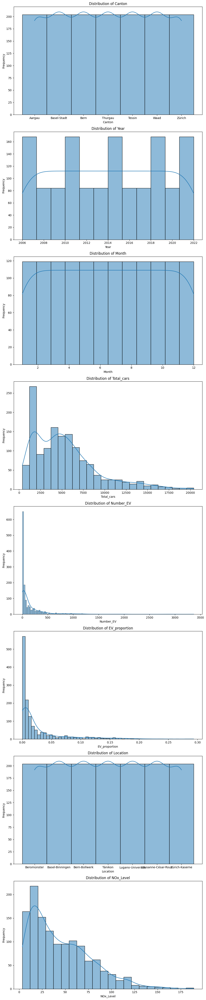

,0
Canton,0
Year,0
Month,0
Total_cars,0
Number_EV,0
EV_proportion,0
Location,0
NOx_Level,125


In [ ]:
# Create a figure and axes
fig, axes = plt.subplots(len(NOX_EV_merged.columns), 1, figsize=(10, 6 * len(NOX_EV_merged.columns)))  # Adjust figsize as needed

# Iterate through each column
for i, col in enumerate(NOX_EV_merged.columns):
  sns.histplot(NOX_EV_merged[col], kde=True, ax=axes[i])  # Use histplot for distribution
  axes[i].set_title(f'Distribution of {col}')
  axes[i].set_xlabel(col)
  axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

# Check for NaN values in each column
nan_counts = NOX_EV_merged.isnull().sum()
nan_counts


In [ ]:
NOX_EV_merged['EV_proportion'].describe()

,EV_proportion
count,1428.000000
mean,0.028028
std,0.045291
min,0.000000
25%,0.002178
50%,0.008258
75%,0.031527
max,0.293532


In [ ]:
# Drop rows with NaN values in the merged DataFrame
NOX_EV_merged.dropna(inplace=True)
NOX_EV_merged

,Canton,Year,Month,Total_cars,Number_EV,EV_proportion,Location,NOx_Level
12,Basel-Stadt,2006,4,1458,2,0.001372,Basel-Binningen,26.336667
13,Basel-Stadt,2006,8,1218,2,0.001642,Basel-Binningen,13.283871
14,Basel-Stadt,2006,12,1684,0,0.000000,Basel-Binningen,65.654839
15,Basel-Stadt,2006,2,884,0,0.000000,Basel-Binningen,71.489286
16,Basel-Stadt,2006,1,816,4,0.004902,Basel-Binningen,81.058065
...,...,...,...,...,...,...,...,...
1423,Zürich,2022,5,11670,1286,0.110197,Zürich-Kaserne,16.164516
1424,Zürich,2022,3,11788,1884,0.159824,Zürich-Kaserne,43.912903
1425,Zürich,2022,11,10290,1962,0.190671,Zürich-Kaserne,37.866667
1426,Zürich,2022,10,8058,1072,0.133035,Zürich-Kaserne,36.319355


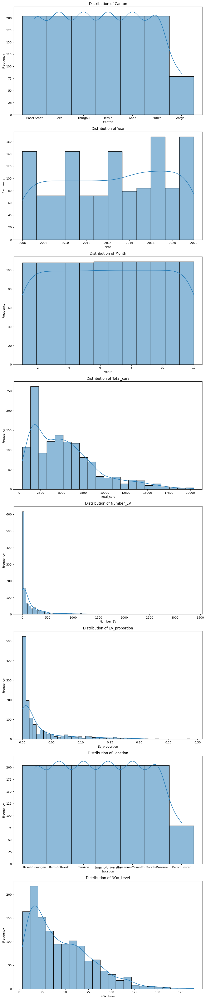

,0
Canton,0
Year,0
Month,0
Total_cars,0
Number_EV,0
EV_proportion,0
Location,0
NOx_Level,0


In [ ]:
# Create a figure and axes
fig, axes = plt.subplots(len(NOX_EV_merged.columns), 1, figsize=(10, 6 * len(NOX_EV_merged.columns)))  # Adjust figsize as needed

# Iterate through each column
for i, col in enumerate(NOX_EV_merged.columns):
  sns.histplot(NOX_EV_merged[col], kde=True, ax=axes[i])  # Use histplot for distribution
  axes[i].set_title(f'Distribution of {col}')
  axes[i].set_xlabel(col)
  axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

# Check for NaN values in each column
nan_counts = NOX_EV_merged.isnull().sum()
nan_counts

## EDA & correlation analysis

### CO and EV-share

In [ ]:
CO_EV_merged.isna().sum()

,0
Canton,0
Year,0
Month,0
Total_cars,0
Number_EV,0
EV_proportion,0
Location,0
CO_Level,0


In [ ]:
CO_EV_merged.describe()

,Year,Month,Total_cars,Number_EV,EV_proportion,CO_Level
count,816.000000,816.00000,816.000000,816.000000,816.000000,816.000000
mean,2014.000000,6.50000,7326.473039,208.845588,0.028952,0.379147
std,4.901984,3.45417,3584.779872,352.490770,0.043824,0.138306
min,2006.000000,1.00000,1292.000000,0.000000,0.000000,0.182667
25%,2010.000000,3.75000,4595.500000,16.000000,0.002511,0.277073
50%,2014.000000,6.50000,6455.000000,61.000000,0.009246,0.345000
75%,2018.000000,9.25000,8797.000000,258.000000,0.036214,0.451083
max,2022.000000,12.00000,20400.000000,3368.000000,0.282420,1.069677


In [ ]:
CO_EV_merged.head(5)

,Canton,Year,Month,Total_cars,Number_EV,EV_proportion,Location,CO_Level
0,Bern,2006,4,7756,4,0.000516,Bern-Bollwerk,0.662333
1,Bern,2006,8,5598,10,0.001786,Bern-Bollwerk,0.491613
2,Bern,2006,12,5606,4,0.000714,Bern-Bollwerk,0.898065
3,Bern,2006,2,4582,8,0.001746,Bern-Bollwerk,0.876071
4,Bern,2006,1,4812,2,0.000416,Bern-Bollwerk,1.069677


In [ ]:
# Sort data to ensure proper order
CO_EV_merged = CO_EV_merged.sort_values(by=['Canton', 'Year', 'Month'])

# Calculate year-over-year change rates per location
CO_EV_merged['EV_proportion_change'] = CO_EV_merged.groupby('Location')['EV_proportion'].pct_change()
CO_EV_merged['CO_Level_change'] = CO_EV_merged.groupby('Location')['CO_Level'].pct_change()

# Display to check
CO_EV_merged[['Location', 'Year', 'Month', 'EV_proportion', 'EV_proportion_change', 'CO_Level', 'CO_Level_change']].head(10)

,Location,Year,Month,EV_proportion,EV_proportion_change,CO_Level,CO_Level_change
4,Bern-Bollwerk,2006,1,0.000416,NaN,1.069677,NaN
3,Bern-Bollwerk,2006,2,0.001746,3.200786,0.876071,-0.180995
8,Bern-Bollwerk,2006,3,0.002137,0.223825,0.680323,-0.223439
0,Bern-Bollwerk,2006,4,0.000516,-0.758638,0.662333,-0.026442
7,Bern-Bollwerk,2006,5,0.001347,1.612621,0.538065,-0.187623
6,Bern-Bollwerk,2006,6,0.002328,0.727576,0.546000,0.014748
5,Bern-Bollwerk,2006,7,0.000310,-0.866625,0.504516,-0.075978
1,Bern-Bollwerk,2006,8,0.001786,4.753841,0.491613,-0.025575
11,Bern-Bollwerk,2006,9,0.000733,-0.589439,0.626667,0.274716
10,Bern-Bollwerk,2006,10,0.002786,2.798050,0.727097,0.160261


In [ ]:
# Count the occurrences of each canton in the 'Canton' column of CO_EV_merged
canton_counts = CO_EV_merged['Canton'].value_counts()

# Print the results
canton_counts

,count
Canton,
Bern,204
Tessin,204
Waad,204
Zürich,204


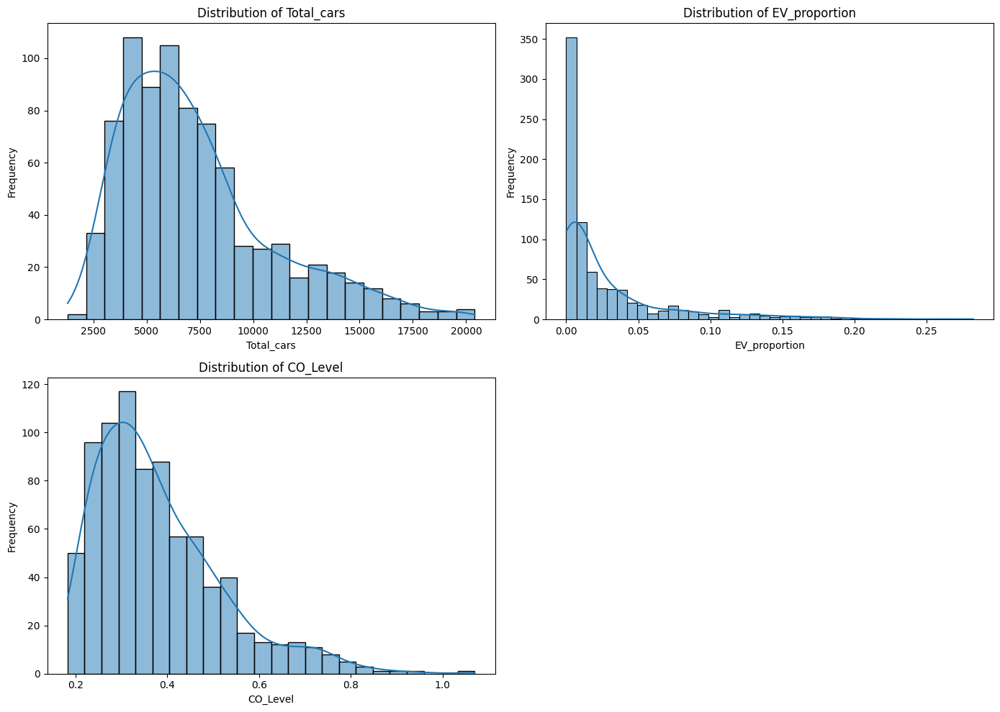

In [ ]:
# Select the columns to plot
cols_to_plot = ['Total_cars', 'EV_proportion', 'CO_Level']

# Create 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()  # Flatten to simplify indexing

# Plot each column
for i, col in enumerate(cols_to_plot):
    sns.histplot(CO_EV_merged[col], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# Remove the unused subplot
fig.delaxes(axes[len(cols_to_plot)])

plt.tight_layout()
plt.show()

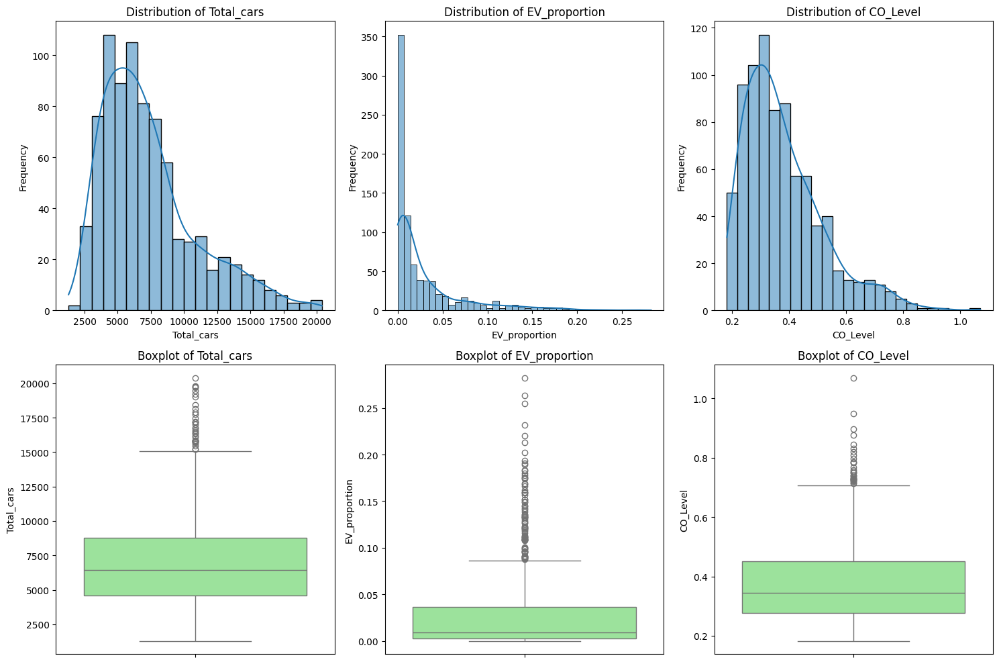

In [ ]:
# Select the columns to plot
cols_to_plot = ['Total_cars', 'EV_proportion', 'CO_Level']

# Create 2x3 subplots (1st row: histograms, 2nd row: boxplots)
fig, axes = plt.subplots(2, len(cols_to_plot), figsize=(5 * len(cols_to_plot), 10))

# Plot histograms with KDE on top row
for i, col in enumerate(cols_to_plot):
    sns.histplot(CO_EV_merged[col], kde=True, ax=axes[0][i])
    axes[0][i].set_title(f'Distribution of {col}')
    axes[0][i].set_xlabel(col)
    axes[0][i].set_ylabel('Frequency')

# Plot boxplots on bottom row
for i, col in enumerate(cols_to_plot):
    sns.boxplot(y=CO_EV_merged[col], ax=axes[1][i], color='lightgreen')
    axes[1][i].set_title(f'Boxplot of {col}')
    axes[1][i].set_xlabel('')
    axes[1][i].set_ylabel(col)

plt.tight_layout()
plt.show()

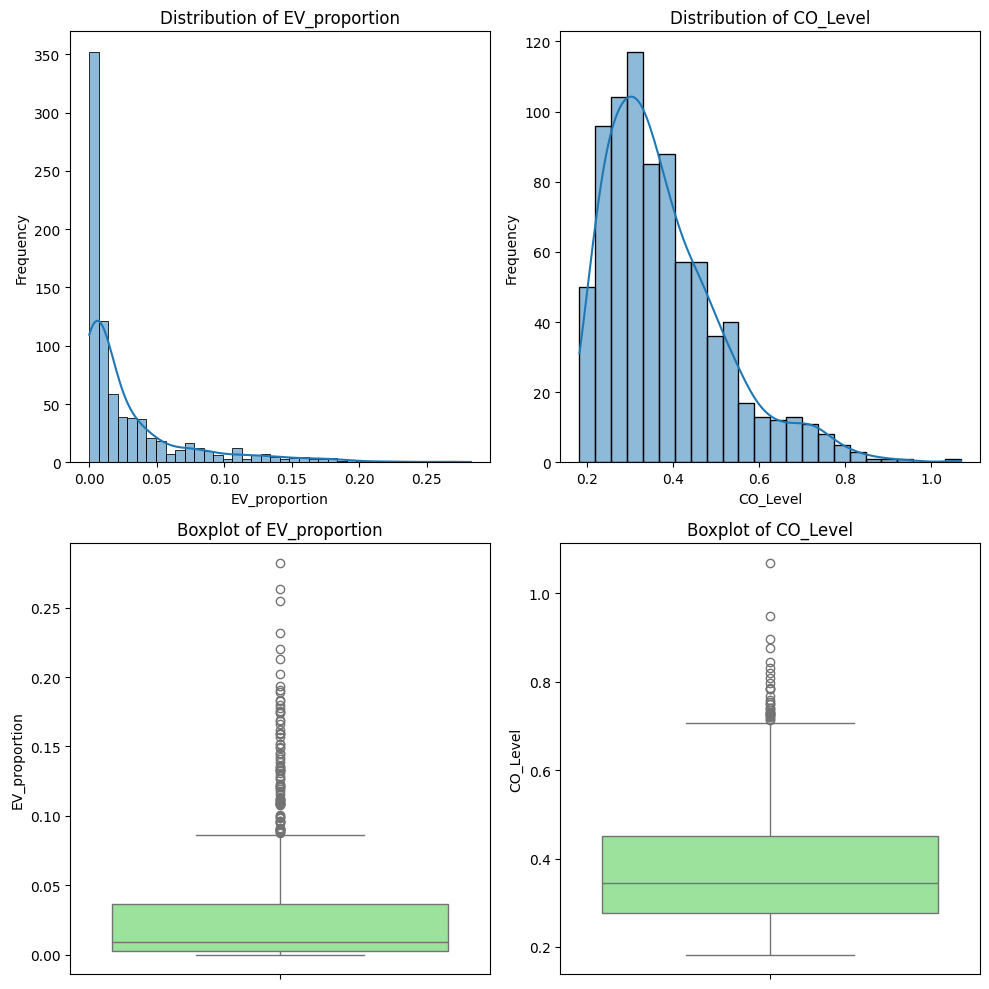

In [ ]:
# Select the columns to plot
cols_to_plot = ['EV_proportion', 'CO_Level']

# Create 2x3 subplots (1st row: histograms, 2nd row: boxplots)
fig, axes = plt.subplots(2, len(cols_to_plot), figsize=(5 * len(cols_to_plot), 10))

# Plot histograms with KDE on top row
for i, col in enumerate(cols_to_plot):
    sns.histplot(CO_EV_merged[col], kde=True, ax=axes[0][i])
    axes[0][i].set_title(f'Distribution of {col}')
    axes[0][i].set_xlabel(col)
    axes[0][i].set_ylabel('Frequency')

# Plot boxplots on bottom row
for i, col in enumerate(cols_to_plot):
    sns.boxplot(y=CO_EV_merged[col], ax=axes[1][i], color='lightgreen')
    axes[1][i].set_title(f'Boxplot of {col}')
    axes[1][i].set_xlabel('')
    axes[1][i].set_ylabel(col)

plt.tight_layout()
plt.show()

In [ ]:
# Select the relevant columns
cols_to_analyze = ['Total_cars', 'Number_EV', 'EV_proportion', 'CO_Level']

# Calculate skewness
skew_values = CO_EV_merged[cols_to_analyze].skew()

# Print the results
print("Skewness of selected features:")
print(skew_values)

Skewness of selected features:
Total_cars       1.150466
Number_EV        3.692114
EV_proportion    2.393441
CO_Level         1.233221
dtype: float64


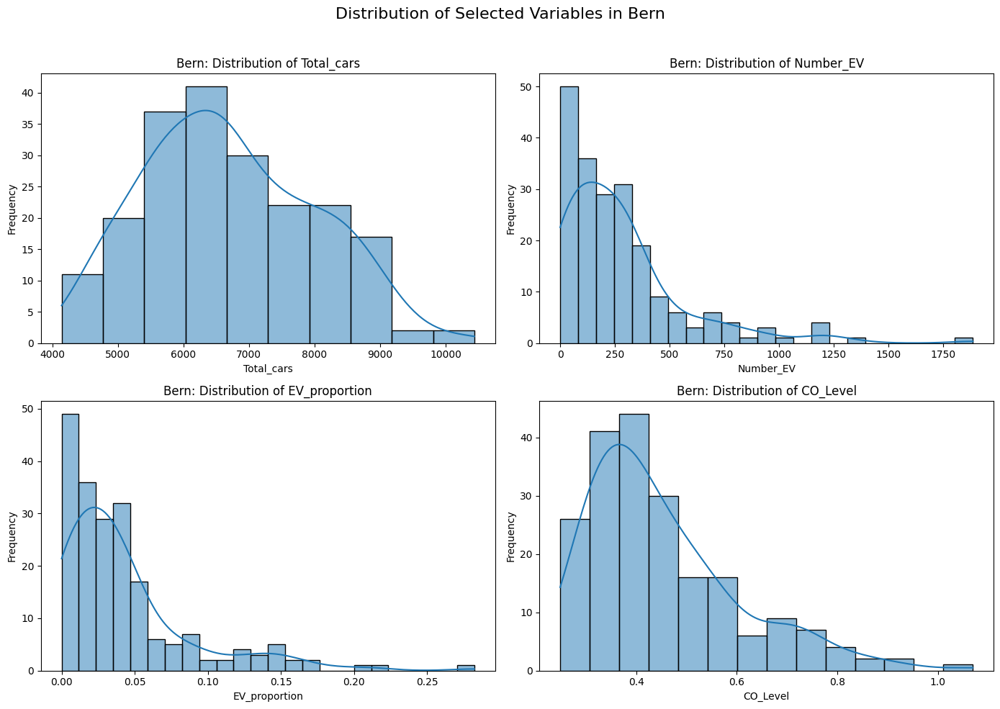

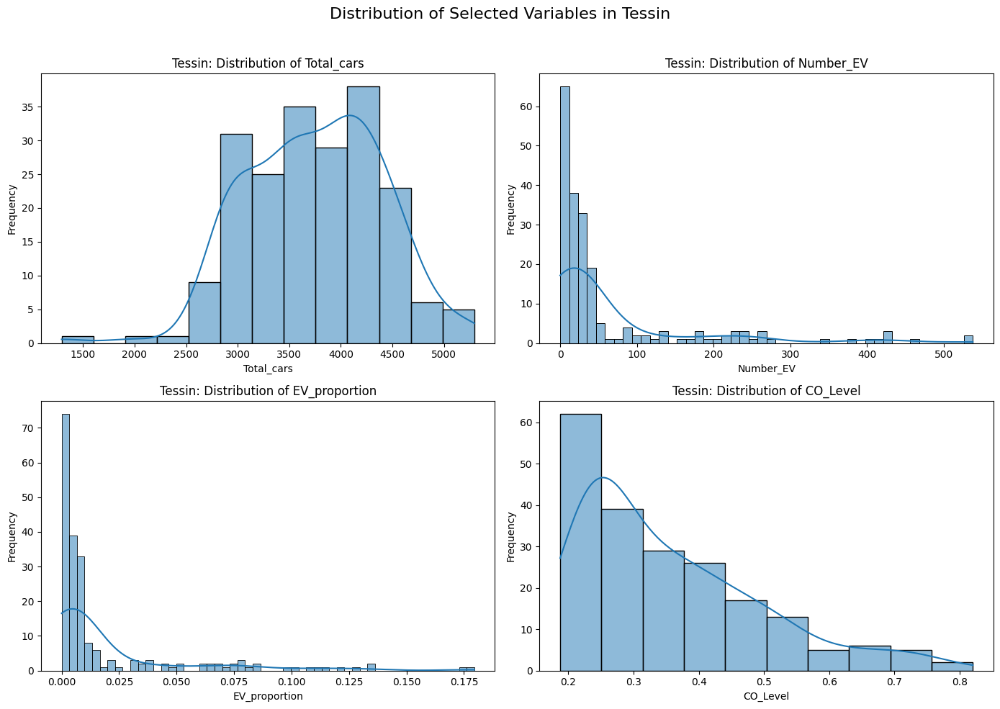

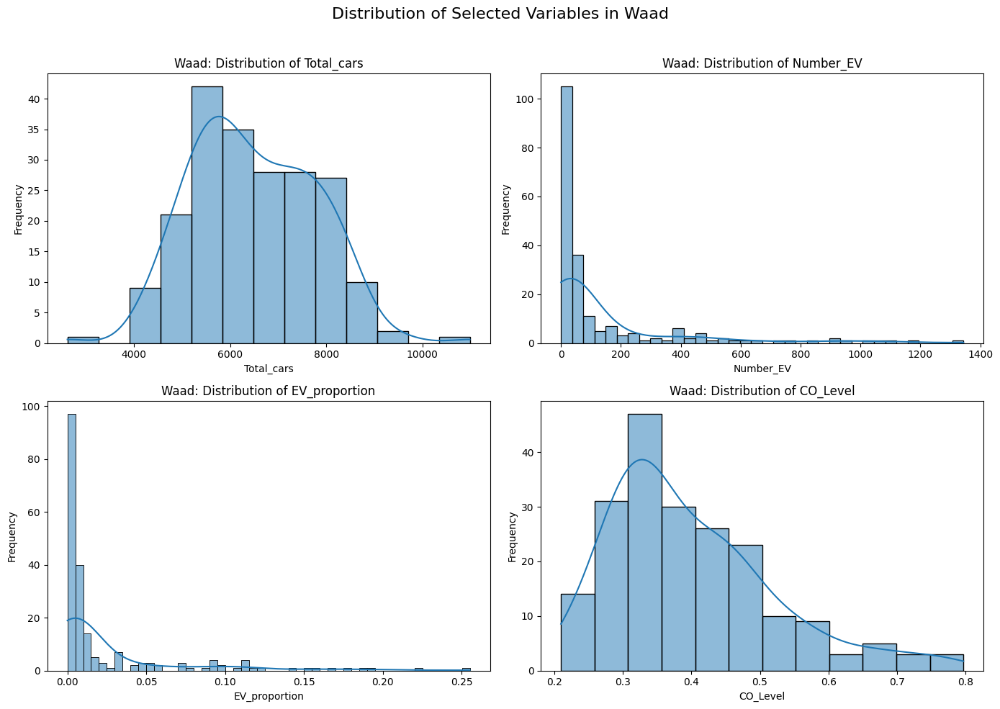

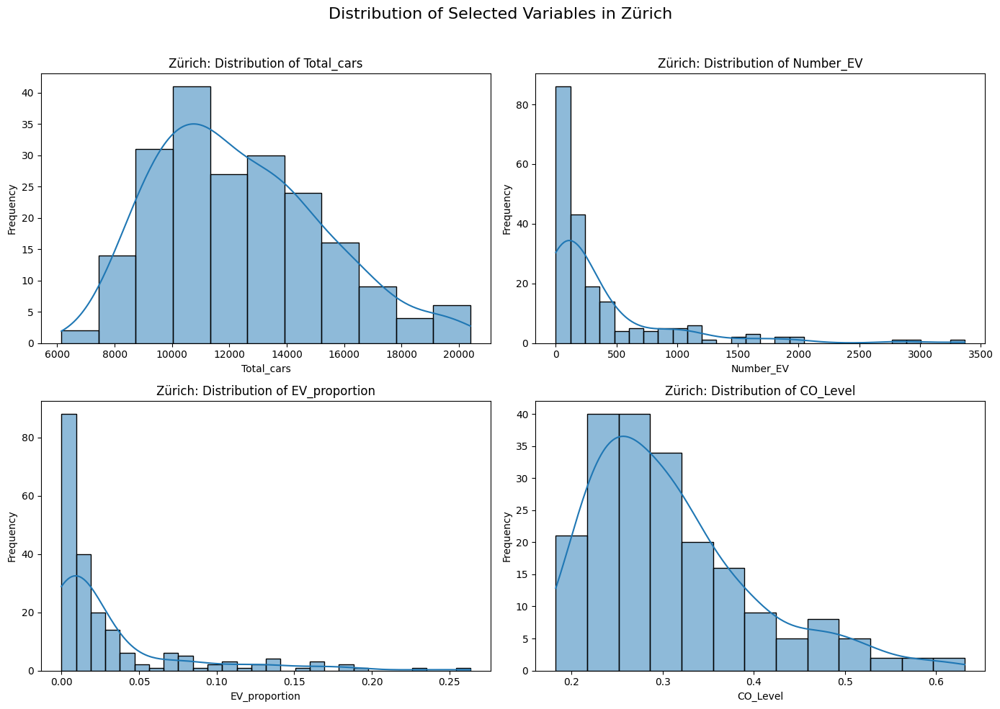

In [ ]:
# Select the columns to plot
cols_to_plot = ['Total_cars', 'Number_EV', 'EV_proportion', 'CO_Level']

# Loop through each canton
for canton in CO_EV_merged['Canton'].unique():
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]

    # Create 2x2 subplots
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    # Plot each column
    for i, col in enumerate(cols_to_plot):
        sns.histplot(df[col], kde=True, ax=axes[i])
        axes[i].set_title(f'{canton}: Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    plt.suptitle(f'Distribution of Selected Variables in {canton}', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

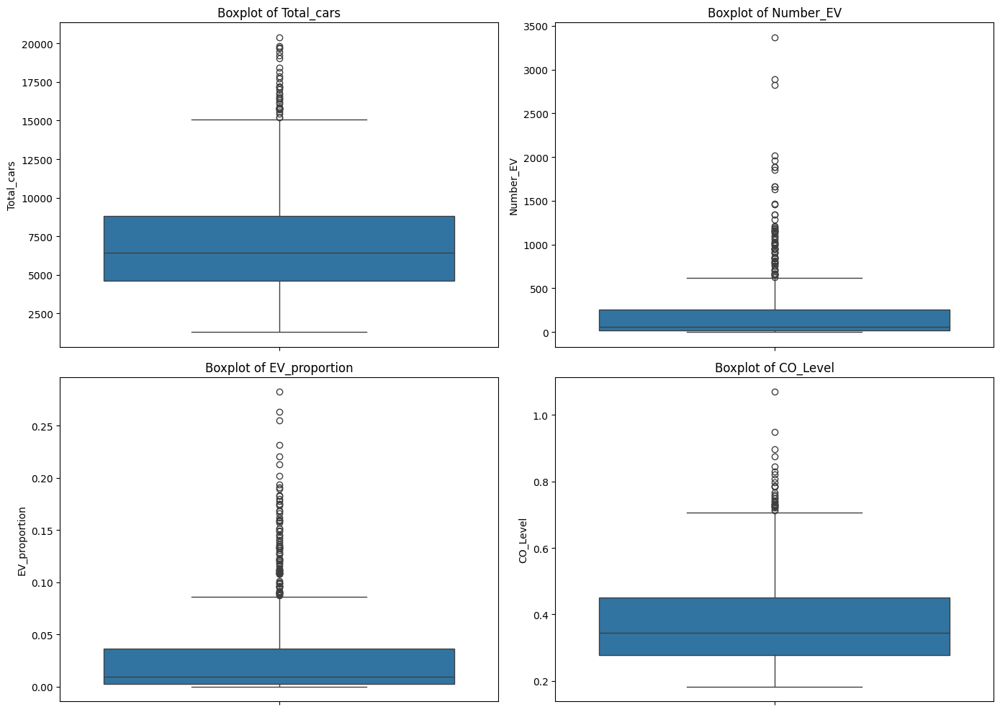

In [ ]:
# Columns to plot
cols_to_plot = ['Total_cars', 'Number_EV', 'EV_proportion', 'CO_Level']

# Create 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

# Create boxplots
for i, col in enumerate(cols_to_plot):
    sns.boxplot(y=CO_EV_merged[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_ylabel(col)

plt.tight_layout()
plt.show()

<ipython-input-67-667db7d45ed7>:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=CO_EV_merged[time_col], y=CO_EV_merged[col], ax=axes[i], ci=None)
<ipython-input-67-667db7d45ed7>:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=CO_EV_merged[time_col], y=CO_EV_merged[col], ax=axes[i], ci=None)
<ipython-input-67-667db7d45ed7>:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=CO_EV_merged[time_col], y=CO_EV_merged[col], ax=axes[i], ci=None)
<ipython-input-67-667db7d45ed7>:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=CO_EV_merged[time_col], y=CO_EV_merged[col], ax=axes[i], ci=None)


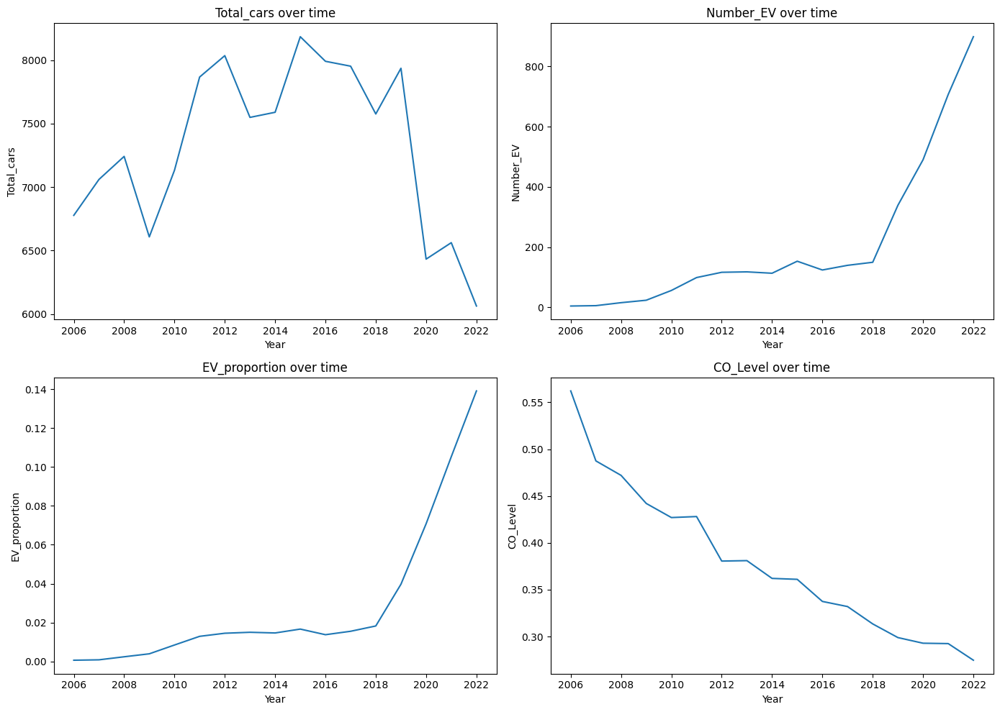

In [ ]:
# Ensure the time variable is available and sorted
CO_EV_merged = CO_EV_merged.sort_values('Year')

# Set the time column name
time_col = 'Year'

# Columns to plot
cols_to_plot = ['Total_cars', 'Number_EV', 'EV_proportion', 'CO_Level']

# Create 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

# Line plot over time for each variable without confidence interval
for i, col in enumerate(cols_to_plot):
    sns.lineplot(x=CO_EV_merged[time_col], y=CO_EV_merged[col], ax=axes[i], ci=None)
    axes[i].set_title(f'{col} over time')
    axes[i].set_xlabel(time_col)
    axes[i].set_ylabel(col)

plt.tight_layout()
plt.show()

Welch's t-test for CO_Level before and after EV uptake (2018)
T-statistic: 16.353
P-value: 0.00000
Statistically significant difference in CO levels after 2018.


<ipython-input-220-73ff7619d2e1>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Period', y='CO_Level', data=CO_EV_merged, palette='coolwarm')


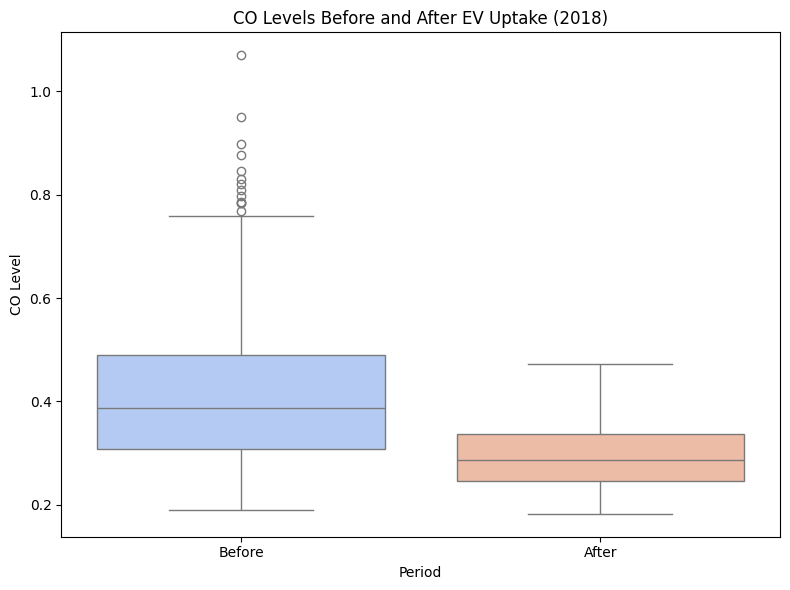

T-statistic: 16.353
P-value: 0.00000
Statistically significant difference in CO levels before vs. after EV uptake.


In [ ]:
from scipy.stats import ttest_ind

# Define cutoff year for EV uptake
cutoff_year = 2018

# Create 'Period' column: Before vs. After EV rise
CO_EV_merged['Period'] = CO_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# Split data
before = CO_EV_merged[CO_EV_merged['Period'] == 'Before']['CO_Level']
after = CO_EV_merged[CO_EV_merged['Period'] == 'After']['CO_Level']

# Welch's t-test (for unequal variances)
t_stat, p_val = ttest_ind(before, after, equal_var=False)

# Print results
print("Welch's t-test for CO_Level before and after EV uptake (2018)")
print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_val:.5f}")
if p_val < 0.05:
    print("Statistically significant difference in CO levels after 2018.")
else:
    print("No statistically significant difference detected.")

# Boxplot for visualization
plt.figure(figsize=(8, 6))
sns.boxplot(x='Period', y='CO_Level', data=CO_EV_merged, palette='coolwarm')
plt.title('CO Levels Before and After EV Uptake (2018)')
plt.ylabel('CO Level')
plt.xlabel('Period')
plt.tight_layout()
plt.show()

#Welch's t-test

print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_val:.5f}")

if p_val < 0.05:
    print("Statistically significant difference in CO levels before vs. after EV uptake.")
else:
    print("No statistically significant difference in CO levels before vs. after EV uptake.")

Welch's t-test for EV_proportion before and after EV uptake (2018)
T-statistic: -17.589
P-value: 0.00000
Statistically significant difference in EV share after 2018.


<ipython-input-221-a42577dd87b8>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Period', y='EV_proportion', data=CO_EV_merged, palette='Greens')


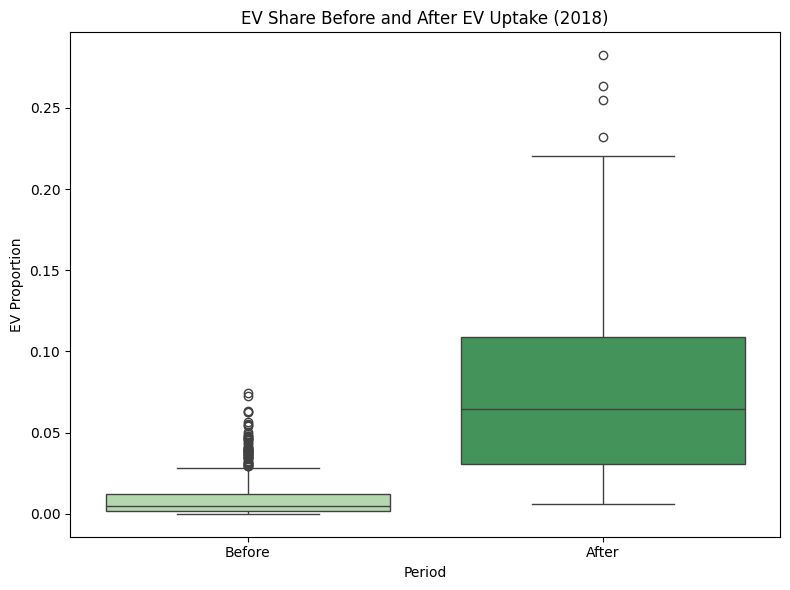

T-statistic: -17.589
P-value: 0.00000
Statistically significant difference in EV share before vs. after 2018.


In [ ]:
from scipy.stats import ttest_ind

# Define cutoff year for EV uptake
cutoff_year = 2018

# Create 'Period' column: Before vs. After EV rise
CO_EV_merged['Period'] = CO_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# Split data for EV share
before_ev = CO_EV_merged[CO_EV_merged['Period'] == 'Before']['EV_proportion']
after_ev = CO_EV_merged[CO_EV_merged['Period'] == 'After']['EV_proportion']

# Welch's t-test
t_stat, p_val = ttest_ind(before_ev, after_ev, equal_var=False)

# Print results
print("Welch's t-test for EV_proportion before and after EV uptake (2018)")
print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_val:.5f}")
if p_val < 0.05:
    print("Statistically significant difference in EV share after 2018.")
else:
    print("No statistically significant difference detected.")

# Boxplot for visualization
plt.figure(figsize=(8, 6))
sns.boxplot(x='Period', y='EV_proportion', data=CO_EV_merged, palette='Greens')
plt.title('EV Share Before and After EV Uptake (2018)')
plt.ylabel('EV Proportion')
plt.xlabel('Period')
plt.tight_layout()
plt.show()


print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_val:.5f}")

if p_val < 0.05:
    print("Statistically significant difference in EV share before vs. after 2018.")
else:
    print("No statistically significant difference detected in EV share.")

Welch's t-test results for each Canton:
Canton  N Before  N After  T-Statistic  P-Value  Significant (p<0.05)
Zürich       144       60        7.297      0.0                  True
  Waad       144       60       13.424      0.0                  True
Tessin       144       60        5.867      0.0                  True
  Bern       144       60       11.170      0.0                  True


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

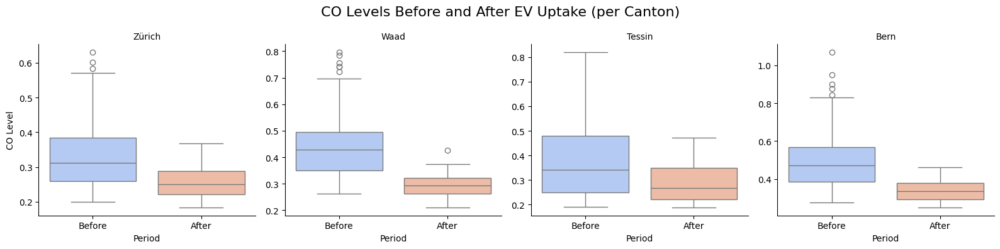

In [ ]:
# Define cutoff year
cutoff_year = 2018

# Create 'Period' column
CO_EV_merged['Period'] = CO_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# Prepare results list and filter for valid cantons
results = []
valid_cantons = []

for canton in CO_EV_merged['Canton'].unique():
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]
    before = df[df['Period'] == 'Before']['CO_Level']
    after = df[df['Period'] == 'After']['CO_Level']

    if len(before) >= 3 and len(after) >= 3:
        # Add to valid list for plotting
        valid_cantons.append(canton)

        # Welch's t-test
        t_stat, p_val = ttest_ind(before, after, equal_var=False)
        results.append({
            'Canton': canton,
            'N Before': len(before),
            'N After': len(after),
            'T-Statistic': round(t_stat, 3),
            'P-Value': round(p_val, 5),
            'Significant (p<0.05)': p_val < 0.05
        })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Print results
print("Welch's t-test results for each Canton:")
print(results_df.to_string(index=False))

# Plot: Faceted boxplots per canton
filtered_df = CO_EV_merged[CO_EV_merged['Canton'].isin(valid_cantons)]

g = sns.FacetGrid(filtered_df, col="Canton", col_wrap=4, sharey=False, height=4)
g.map_dataframe(sns.boxplot, x='Period', y='CO_Level', palette='coolwarm')
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Period", "CO Level")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("CO Levels Before and After EV Uptake (per Canton)", fontsize=16)
plt.tight_layout()
plt.show()

Welch's t-test results for EV share per Canton:
Canton  N Before  N After  T-Statistic  P-Value  Significant (p<0.05)
Zürich       144       60       -9.391      0.0                  True
  Waad       144       60       -8.861      0.0                  True
Tessin       144       60       -9.075      0.0                  True
  Bern       144       60       -8.974      0.0                  True


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

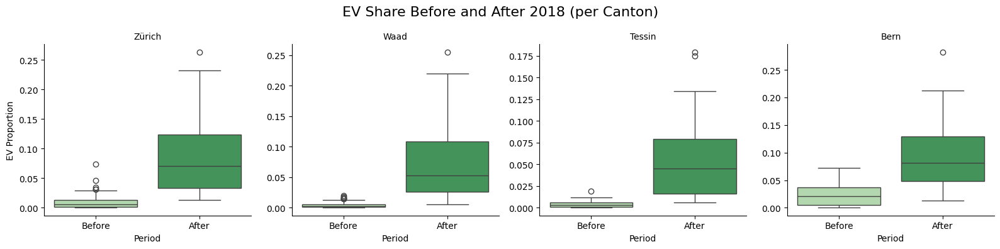

In [ ]:
# Define cutoff year
cutoff_year = 2018

# Create 'Period' column
CO_EV_merged['Period'] = CO_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# Prepare results list and filter for valid cantons
results = []
valid_cantons = []

for canton in CO_EV_merged['Canton'].unique():
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]
    before = df[df['Period'] == 'Before']['EV_proportion']
    after = df[df['Period'] == 'After']['EV_proportion']

    if len(before) >= 3 and len(after) >= 3:
        valid_cantons.append(canton)

        # Welch's t-test
        t_stat, p_val = ttest_ind(before, after, equal_var=False)
        results.append({
            'Canton': canton,
            'N Before': len(before),
            'N After': len(after),
            'T-Statistic': round(t_stat, 3),
            'P-Value': round(p_val, 5),
            'Significant (p<0.05)': p_val < 0.05
        })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Print results
print("Welch's t-test results for EV share per Canton:")
print(results_df.to_string(index=False))

# Plot: Faceted boxplots of EV share per canton
filtered_df = CO_EV_merged[CO_EV_merged['Canton'].isin(valid_cantons)]

g = sns.FacetGrid(filtered_df, col="Canton", col_wrap=4, sharey=False, height=4)
g.map_dataframe(sns.boxplot, x='Period', y='EV_proportion', palette='Greens')
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Period", "EV Proportion")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("EV Share Before and After 2018 (per Canton)", fontsize=16)
plt.tight_layout()
plt.show()

<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


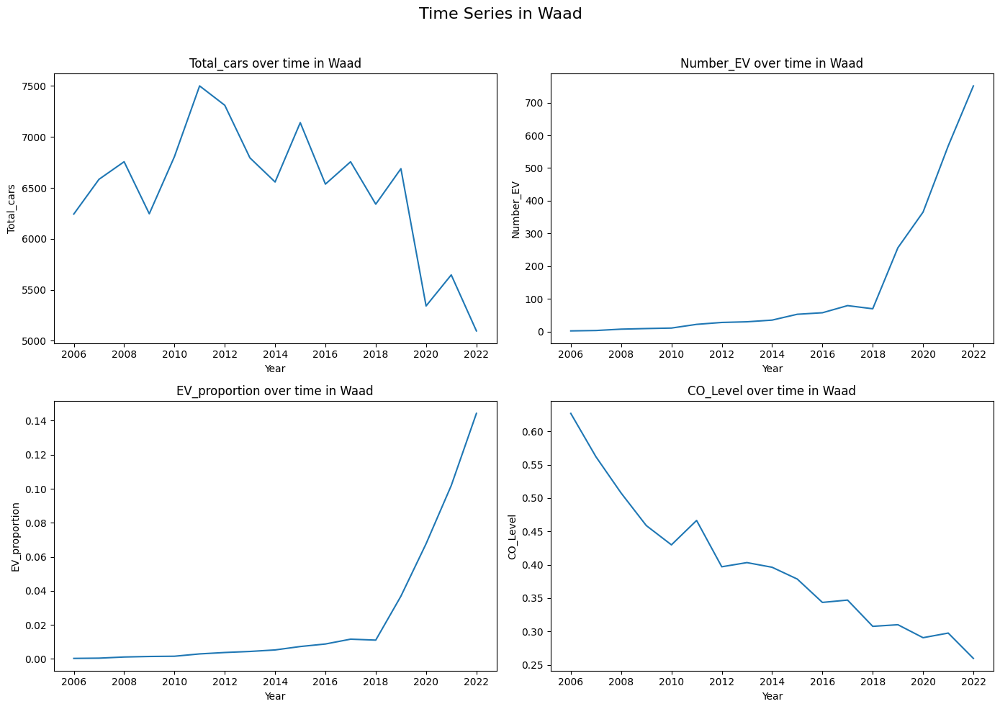

<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


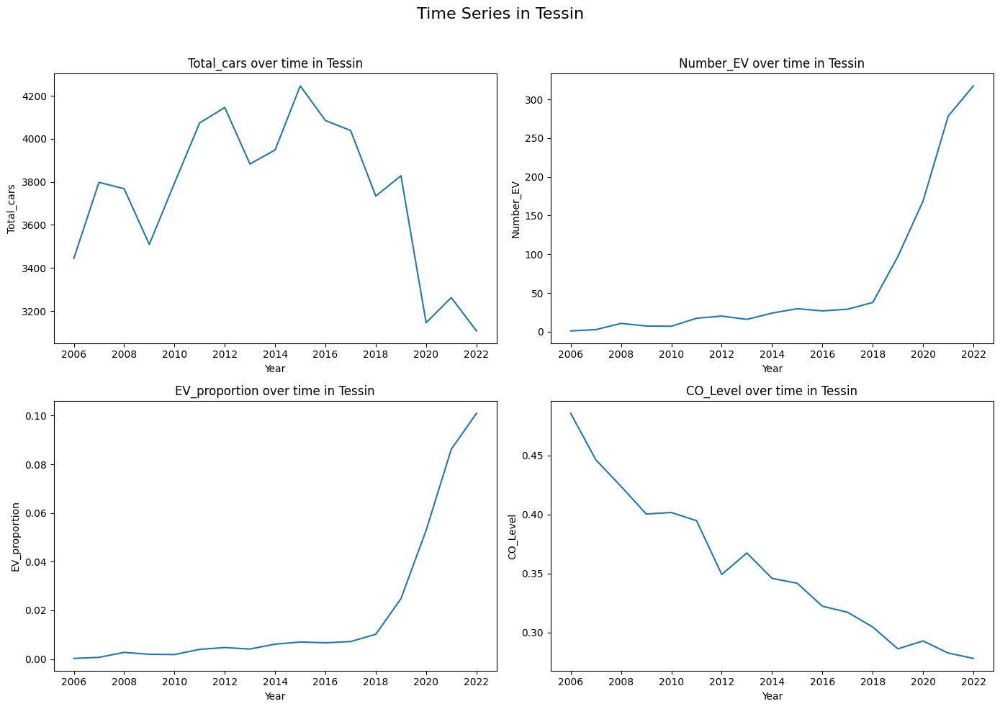

<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


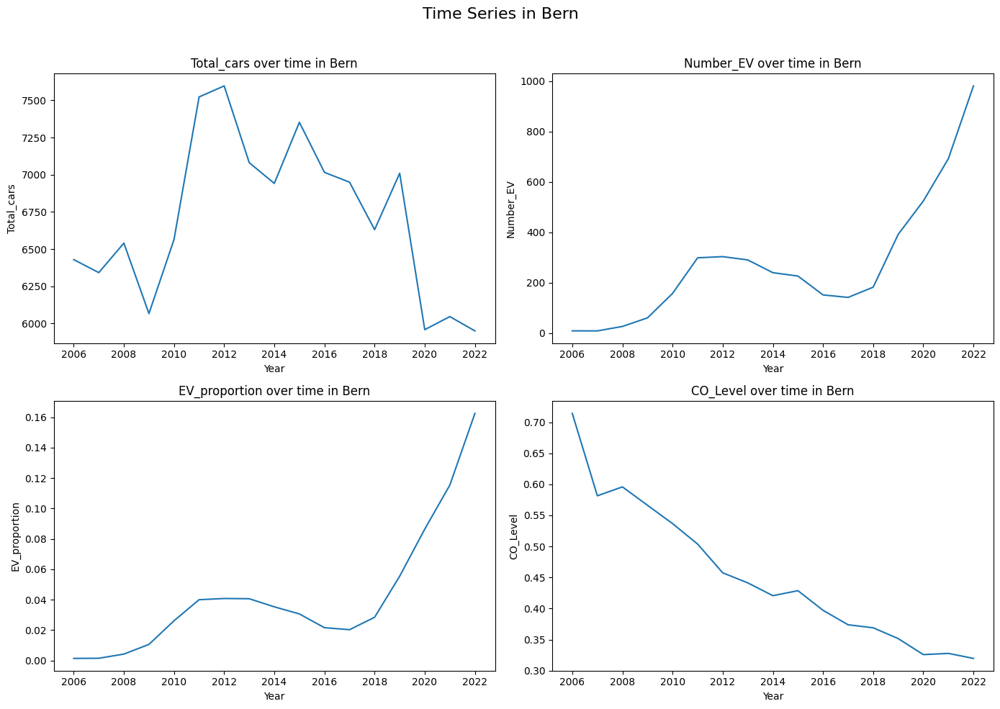

<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-72-e583c7a93854>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


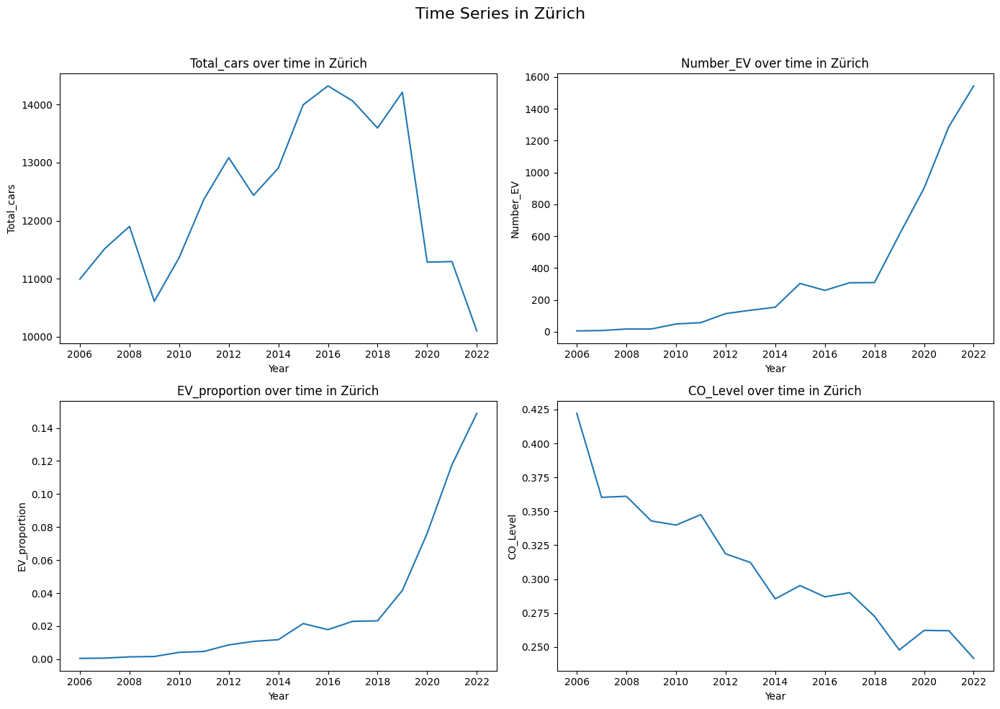

In [ ]:
# Ensure data is sorted by Year
CO_EV_merged = CO_EV_merged.sort_values('Year')

# Set the time column name
time_col = 'Year'
cols_to_plot = ['Total_cars', 'Number_EV', 'EV_proportion', 'CO_Level']

# Loop over each canton
for canton in CO_EV_merged['Canton'].unique():
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]

    # Create 2x2 subplots
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    # Plot each variable
    for i, col in enumerate(cols_to_plot):
        sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
        axes[i].set_title(f'{col} over time in {canton}')
        axes[i].set_xlabel(time_col)
        axes[i].set_ylabel(col)

    plt.suptitle(f'Time Series in {canton}', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

<ipython-input-73-6a1641bb5cb2>:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)
<ipython-input-73-6a1641bb5cb2>:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)
<ipython-input-73-6a1641bb5cb2>:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)


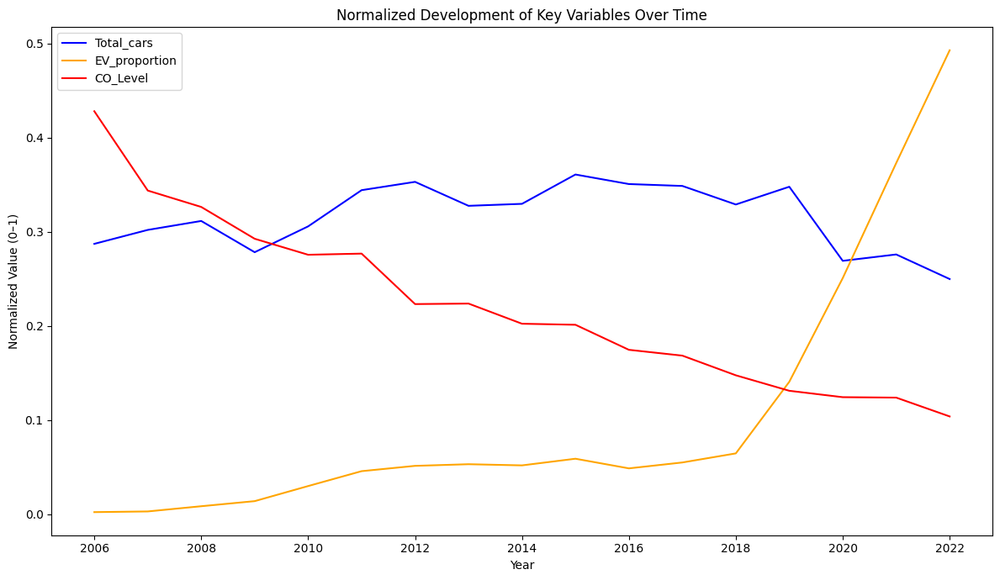

In [ ]:
# Make sure data is sorted by Year
CO_EV_merged = CO_EV_merged.sort_values('Year')

# Select variables
cols_to_plot = ['Total_cars', 'EV_proportion', 'CO_Level']
colors = ['blue', 'orange', 'red']

# Normalize the values (min-max) so they can be plotted on the same axis
normalized_df = CO_EV_merged.copy()
for col in cols_to_plot:
    col_min = CO_EV_merged[col].min()
    col_max = CO_EV_merged[col].max()
    normalized_df[col] = (CO_EV_merged[col] - col_min) / (col_max - col_min)

# Plot all on a single figure
plt.figure(figsize=(12, 7))

for col, color in zip(cols_to_plot, colors):
    sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)

plt.title("Normalized Development of Key Variables Over Time")
plt.xlabel("Year")
plt.ylabel("Normalized Value (0–1)")
plt.legend()
plt.tight_layout()
plt.show()

<ipython-input-74-3a9d9105a779>:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)
<ipython-input-74-3a9d9105a779>:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)
<ipython-input-74-3a9d9105a779>:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)
<ipython-input-74-3a9d9105a779>:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)


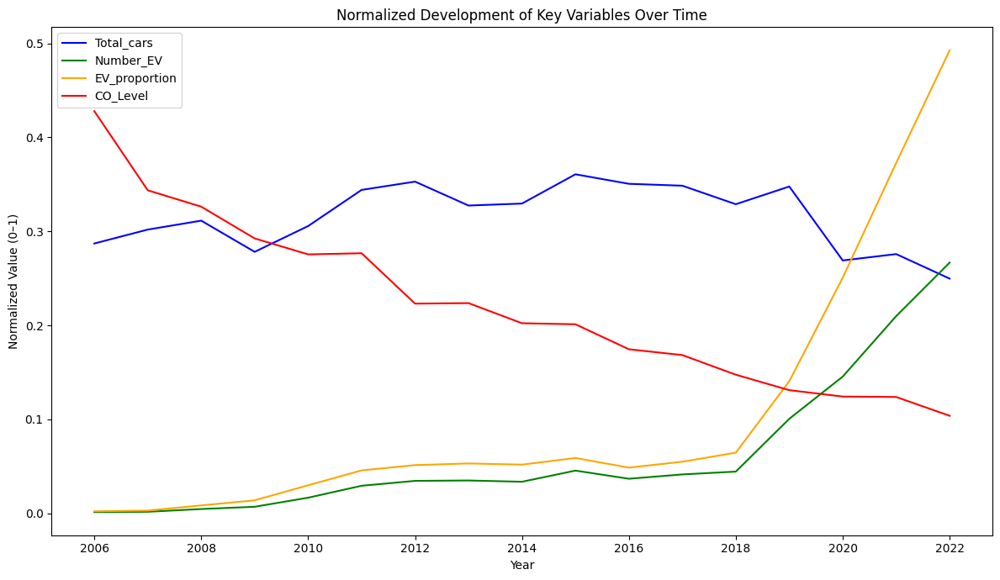

In [ ]:
# Make sure data is sorted by Year
CO_EV_merged = CO_EV_merged.sort_values('Year')

# Select variables
cols_to_plot = ['Total_cars', 'Number_EV', 'EV_proportion', 'CO_Level']
colors = ['blue', 'green', 'orange', 'red']

# Normalize the values (min-max) so they can be plotted on the same axis
normalized_df = CO_EV_merged.copy()
for col in cols_to_plot:
    col_min = CO_EV_merged[col].min()
    col_max = CO_EV_merged[col].max()
    normalized_df[col] = (CO_EV_merged[col] - col_min) / (col_max - col_min)

# Plot all on a single figure
plt.figure(figsize=(12, 7))

for col, color in zip(cols_to_plot, colors):
    sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)

plt.title("Normalized Development of Key Variables Over Time")
plt.xlabel("Year")
plt.ylabel("Normalized Value (0–1)")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
CO_EV_merged.head(5)

,Canton,Year,Month,Total_cars,Number_EV,EV_proportion,Location,CO_Level,EV_proportion_change,CO_Level_change,Period
26,Waad,2006,12,5960,2,0.000336,Lausanne-César-Roux,0.671613,-0.689150,-0.157324,Before
33,Waad,2006,11,5558,6,0.001080,Lausanne-César-Roux,0.797000,1.975171,0.199951,Before
34,Waad,2006,10,5512,2,0.000363,Lausanne-César-Roux,0.664194,inf,0.113796,Before
35,Waad,2006,9,5392,0,0.000000,Lausanne-César-Roux,0.596333,-1.000000,0.300938,Before
47,Zürich,2006,9,8414,4,0.000475,Zürich-Kaserne,0.373667,0.059187,0.504372,Before


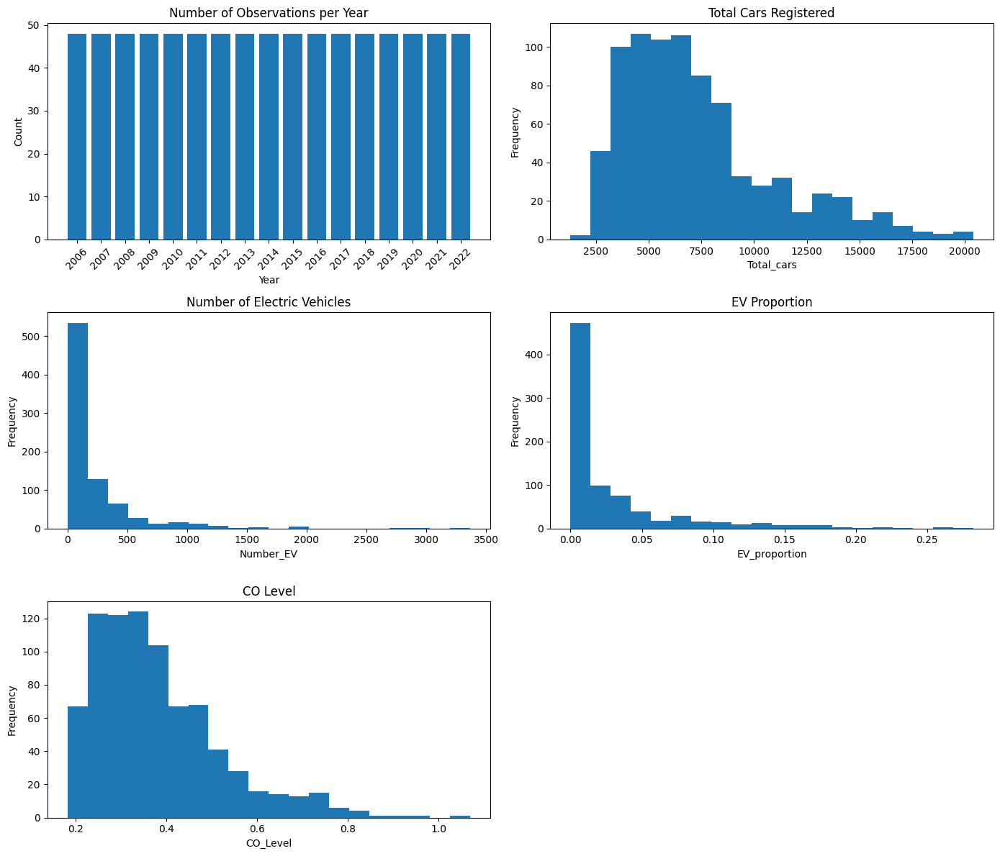

In [ ]:
# Set up the figure with 5 subplots (1 bar, 4 histograms)
fig, axes = plt.subplots(3, 2, figsize=(14, 12))
axes = axes.flatten()

# 1. Bar plot for Year
year_counts = CO_EV_merged['Year'].value_counts().sort_index()
axes[0].bar(year_counts.index.astype(str), year_counts.values)
axes[0].set_title("Number of Observations per Year")
axes[0].set_xlabel("Year")
axes[0].set_ylabel("Count")
axes[0].tick_params(axis='x', rotation=45)

# 2–5. Histograms for the other columns
hist_cols = ['Total_cars', 'Number_EV', 'EV_proportion', 'CO_Level']
titles = ["Total Cars Registered", "Number of Electric Vehicles", "EV Proportion", "CO Level"]

for i, (col, title) in enumerate(zip(hist_cols, titles), start=1):
    axes[i].hist(CO_EV_merged[col], bins=20)
    axes[i].set_title(title)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Frequency")

# Remove any unused subplots (e.g. axes[5] if 3x2 grid has 6 slots)
for j in range(len(hist_cols) + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
CO_EV_merged.info()

<class 'pandas.core.frame.DataFrame'>
Index: 816 entries, 26 to 772
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Canton                816 non-null    object 
 1   Year                  816 non-null    int64  
 2   Month                 816 non-null    int64  
 3   Total_cars            816 non-null    int64  
 4   Number_EV             816 non-null    int64  
 5   EV_proportion         816 non-null    float64
 6   Location              816 non-null    object 
 7   CO_Level              816 non-null    float64
 8   EV_proportion_change  802 non-null    float64
 9   CO_Level_change       812 non-null    float64
 10  Period                816 non-null    object 
dtypes: float64(4), int64(4), object(3)
memory usage: 76.5+ KB


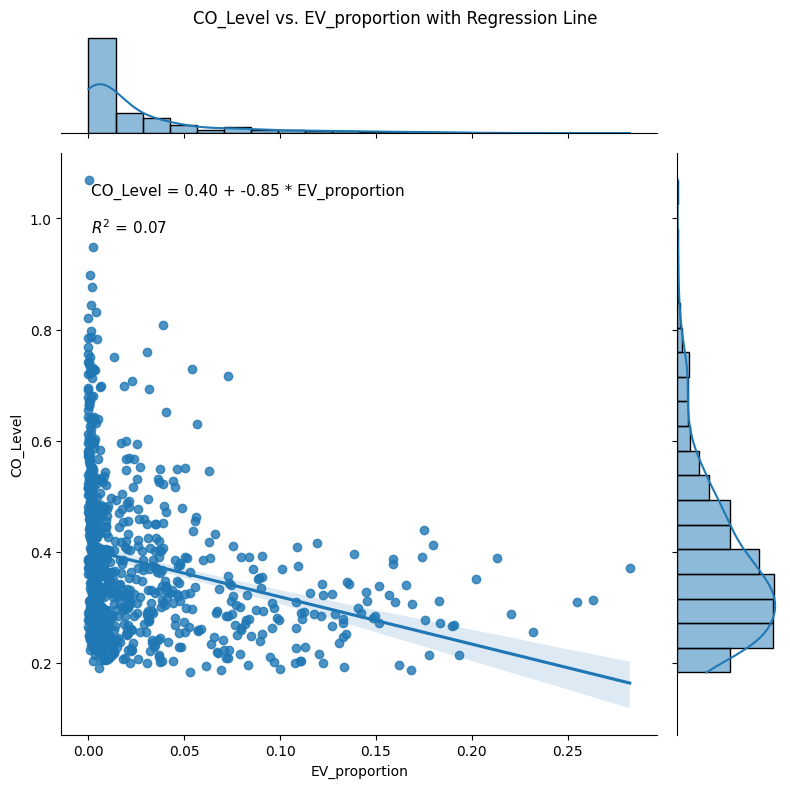

In [ ]:
import statsmodels.api as sm

# Prepare data
X = CO_EV_merged['EV_proportion']
y = CO_EV_merged['CO_Level']

# Fit regression model manually
X_with_const = sm.add_constant(X)
model = sm.OLS(y, X_with_const).fit()
intercept = model.params['const']
slope = model.params['EV_proportion']
r_squared = model.rsquared

# Create joint plot
g = sns.jointplot(
    data=CO_EV_merged,
    x='EV_proportion',
    y='CO_Level',
    kind='reg',
    height=8,
    marginal_kws={'bins': 20, 'fill': True}
)

# Add regression equation and R² as annotation
plt.subplots_adjust(top=0.95)
g.fig.suptitle('CO_Level vs. EV_proportion with Regression Line')

equation = f"CO_Level = {intercept:.2f} + {slope:.2f} * EV_proportion"
r2_text = f"$R^2$ = {r_squared:.2f}"

# Use the main axis of the joint plot to place text
ax = g.ax_joint
ax.text(0.05, 0.95, equation, transform=ax.transAxes, fontsize=11, verticalalignment='top')
ax.text(0.05, 0.89, r2_text, transform=ax.transAxes, fontsize=11, verticalalignment='top')

plt.show()

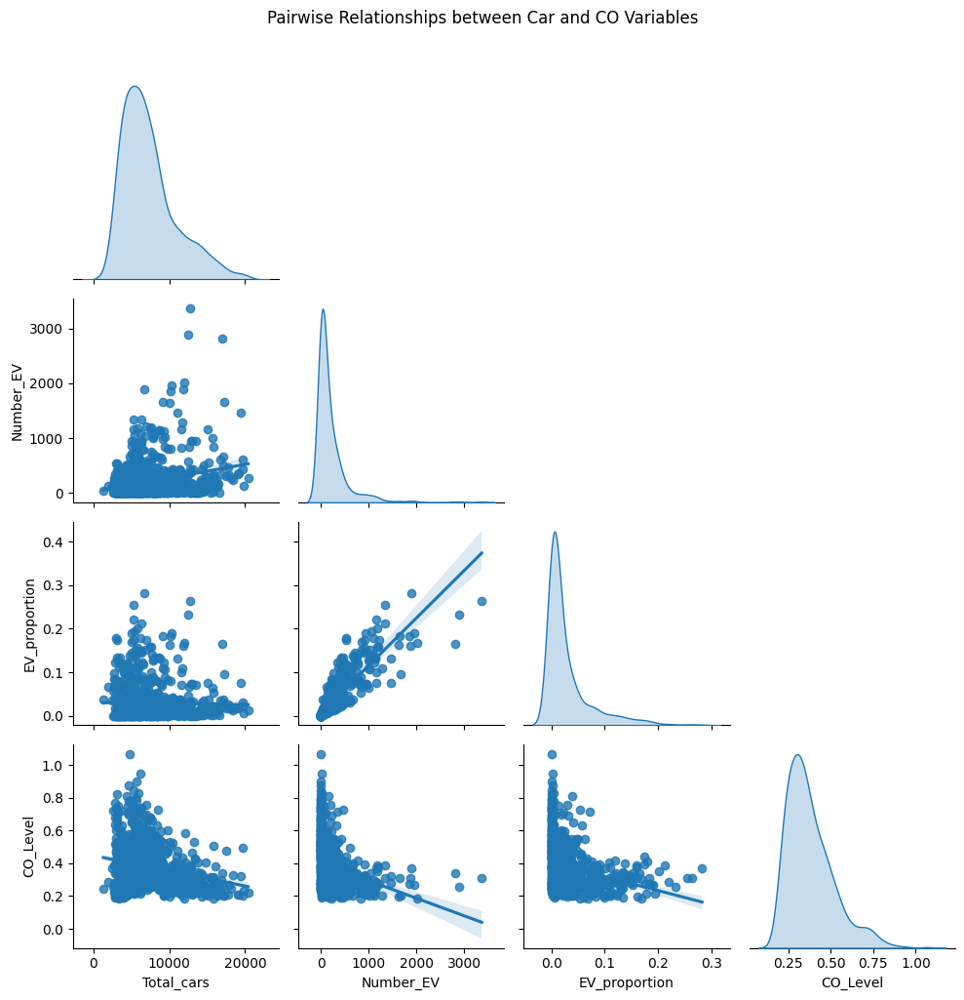

In [ ]:
# Select the relevant variables
pairplot_vars = ['Total_cars', 'Number_EV', 'EV_proportion', 'CO_Level']

# Create the pairplot
sns.pairplot(CO_EV_merged[pairplot_vars], kind='reg', diag_kind='kde', corner=True)

plt.suptitle("Pairwise Relationships between Car and CO Variables", y=1.02)
plt.tight_layout()
plt.show()

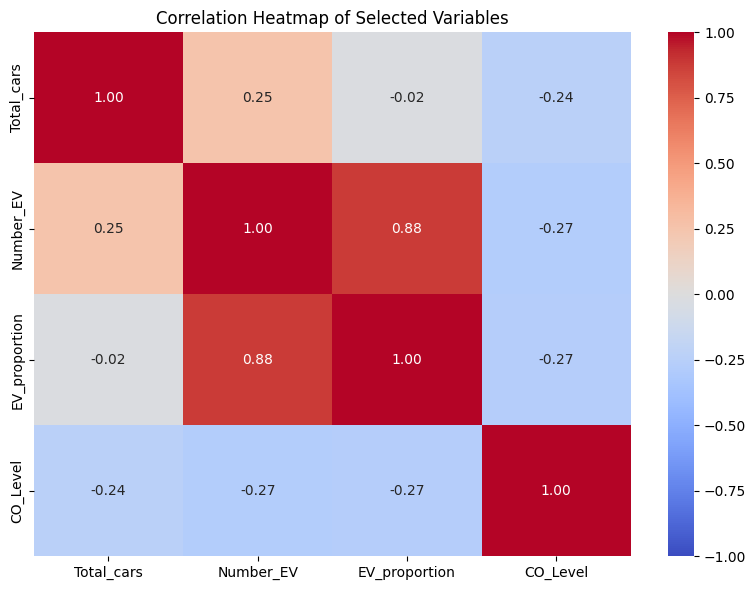

In [ ]:
corr_vars = ['Total_cars', 'Number_EV', 'EV_proportion', 'CO_Level']

# Compute the correlation matrix
corr_matrix = CO_EV_merged[corr_vars].corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title('Correlation Heatmap of Selected Variables')
plt.tight_layout()
plt.show()

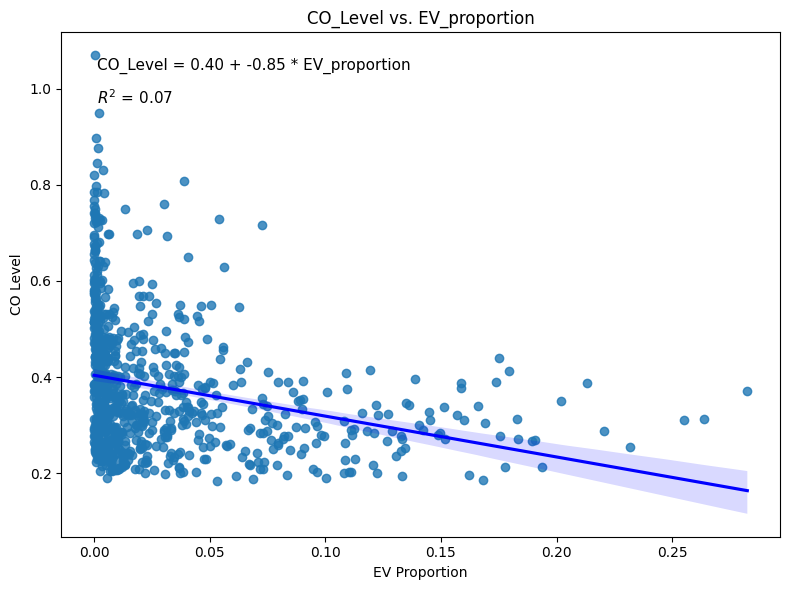

In [ ]:
# Prepare the data
X = CO_EV_merged['EV_proportion']
y = CO_EV_merged['CO_Level']

# Add constant for intercept
X_with_const = sm.add_constant(X)
model = sm.OLS(y, X_with_const).fit()

# Extract regression values
intercept = model.params['const']
slope = model.params['EV_proportion']
r_squared = model.rsquared

# Plot
plt.figure(figsize=(8, 6))
sns.regplot(x='EV_proportion', y='CO_Level', data=CO_EV_merged, line_kws={"color": "blue"})

# Annotate with equation and R²
equation = f"CO_Level = {intercept:.2f} + {slope:.2f} * EV_proportion"
r2_text = f"$R^2$ = {r_squared:.2f}"
plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')

plt.title('CO_Level vs. EV_proportion')
plt.xlabel('EV Proportion')
plt.ylabel('CO Level')
plt.tight_layout()
plt.show()

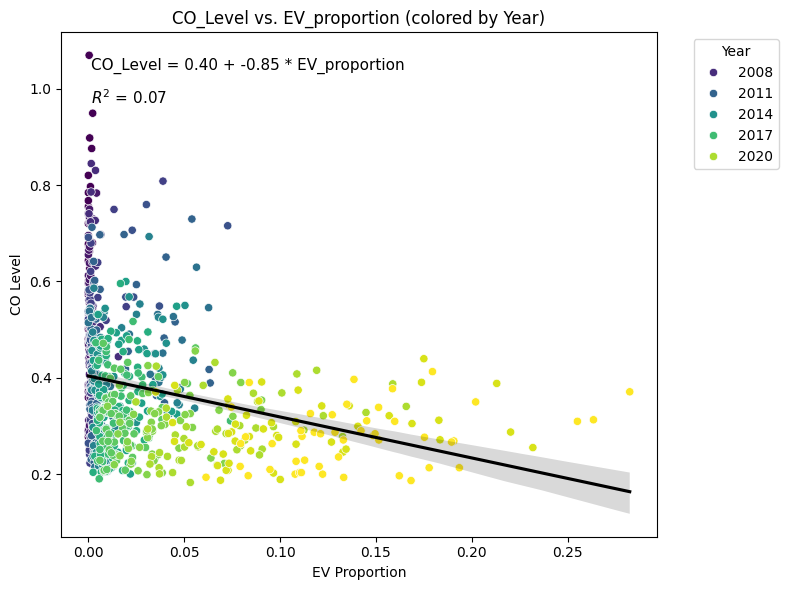

In [ ]:
# Prepare the data
X = CO_EV_merged['EV_proportion']
y = CO_EV_merged['CO_Level']

# Add constant for intercept
X_with_const = sm.add_constant(X)
model = sm.OLS(y, X_with_const).fit()

# Extract regression values
intercept = model.params['const']
slope = model.params['EV_proportion']
r_squared = model.rsquared

# Plot setup
plt.figure(figsize=(8, 6))

# Colored scatterplot by Year
sns.scatterplot(
    data=CO_EV_merged,
    x='EV_proportion',
    y='CO_Level',
    hue='Year',
    palette='viridis',
    legend='auto'
)

# Regression line
sns.regplot(
    data=CO_EV_merged,
    x='EV_proportion',
    y='CO_Level',
    scatter=False,
    line_kws={"color": "black"}
)

# Annotate equation and R²
equation = f"CO_Level = {intercept:.2f} + {slope:.2f} * EV_proportion"
r2_text = f"$R^2$ = {r_squared:.2f}"
plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')

# Labels and layout
plt.title('CO_Level vs. EV_proportion (colored by Year)')
plt.xlabel('EV Proportion')
plt.ylabel('CO Level')
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

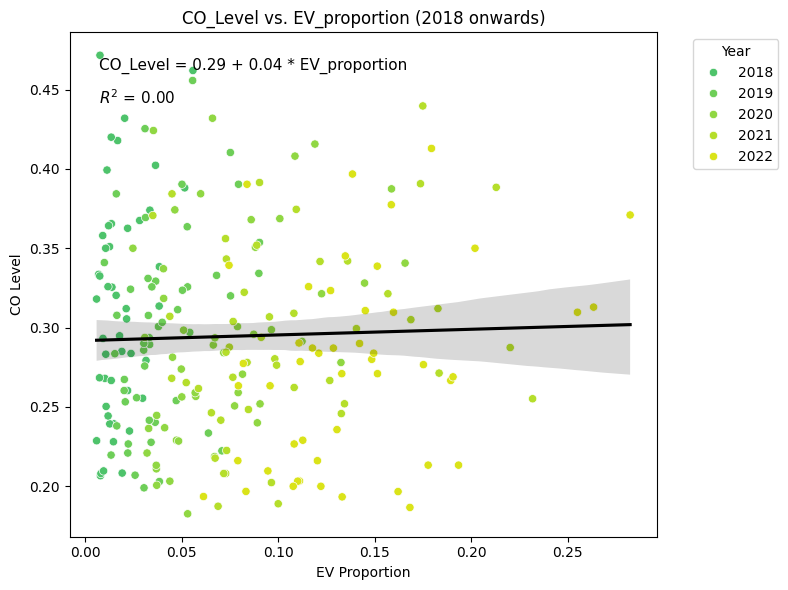

In [ ]:
# Filter data from 2018 onwards
CO_EV_2018on = CO_EV_merged[CO_EV_merged['Year'] >= 2018]

# Prepare the data
X = CO_EV_2018on['EV_proportion']
y = CO_EV_2018on['CO_Level']

# Add constant for intercept
X_with_const = sm.add_constant(X)
model = sm.OLS(y, X_with_const).fit()

# Extract regression values
intercept = model.params['const']
slope = model.params['EV_proportion']
r_squared = model.rsquared

# Set consistent color palette based on all years
all_years_sorted = sorted(CO_EV_merged['Year'].unique())
year_palette = sns.color_palette('viridis', n_colors=len(all_years_sorted))
year_color_dict = dict(zip(all_years_sorted, year_palette))

# Plot setup
plt.figure(figsize=(8, 6))

# Colored scatterplot by Year with fixed palette
sns.scatterplot(
    data=CO_EV_2018on,
    x='EV_proportion',
    y='CO_Level',
    hue='Year',
    palette=year_color_dict,
    legend='auto'
)

# Regression line (no scatter)
sns.regplot(
    data=CO_EV_2018on,
    x='EV_proportion',
    y='CO_Level',
    scatter=False,
    line_kws={"color": "black"}
)

# Annotate equation and R²
equation = f"CO_Level = {intercept:.2f} + {slope:.2f} * EV_proportion"
r2_text = f"$R^2$ = {r_squared:.2f}"
plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')

# Labels and layout
plt.title('CO_Level vs. EV_proportion (2018 onwards)')
plt.xlabel('EV Proportion')
plt.ylabel('CO Level')
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

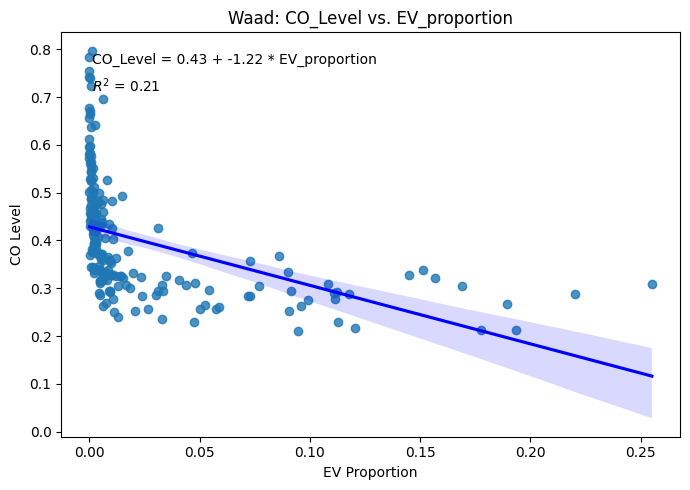

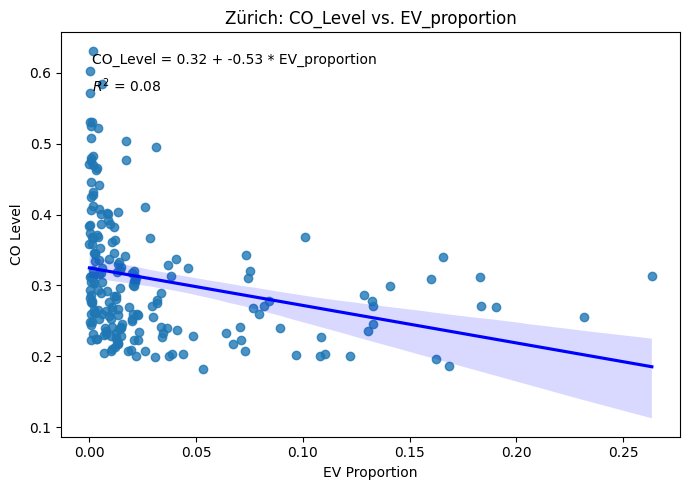

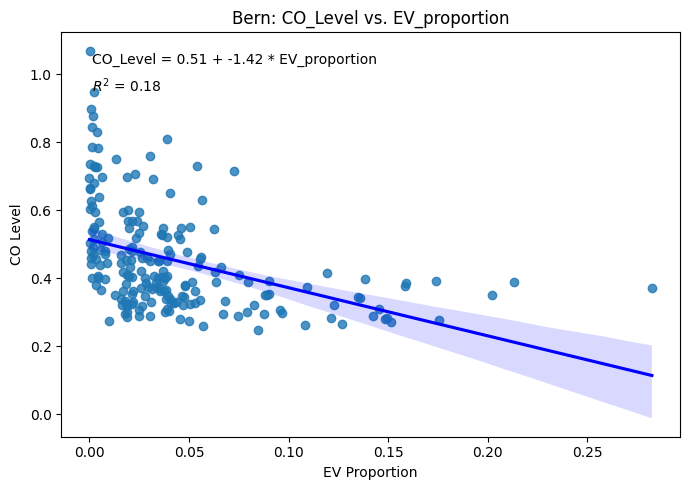

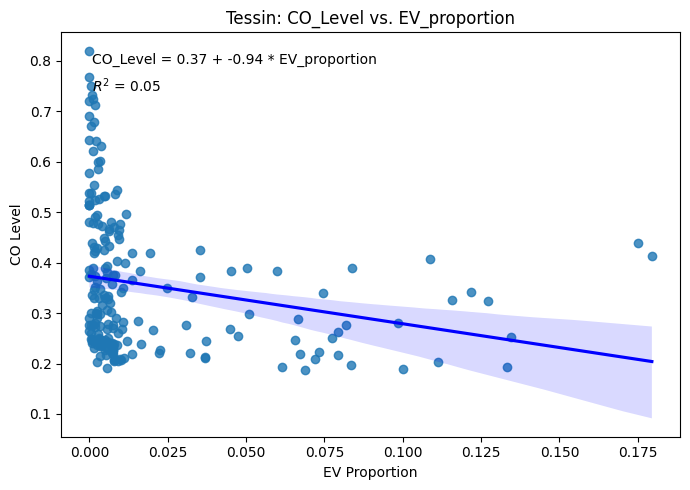

In [ ]:
# Get list of unique cantons
cantons = CO_EV_merged['Canton'].unique()

# Loop through each canton and plot
for canton in cantons:
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]

    if len(df) < 3:
        continue  # skip small groups

    # Prepare regression
    X = df['EV_proportion']
    y = df['CO_Level']
    X_with_const = sm.add_constant(X)
    model = sm.OLS(y, X_with_const).fit()

    intercept = model.params['const']
    slope = model.params['EV_proportion']
    r_squared = model.rsquared

    # Plot
    plt.figure(figsize=(7, 5))
    sns.regplot(x='EV_proportion', y='CO_Level', data=df, line_kws={"color": "blue"})

    # Annotate with regression function and R²
    equation = f"CO_Level = {intercept:.2f} + {slope:.2f} * EV_proportion"
    r2_text = f"$R^2$ = {r_squared:.2f}"
    plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
    plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

    plt.title(f'{canton}: CO_Level vs. EV_proportion')
    plt.xlabel('EV Proportion')
    plt.ylabel('CO Level')
    plt.tight_layout()
    plt.show()

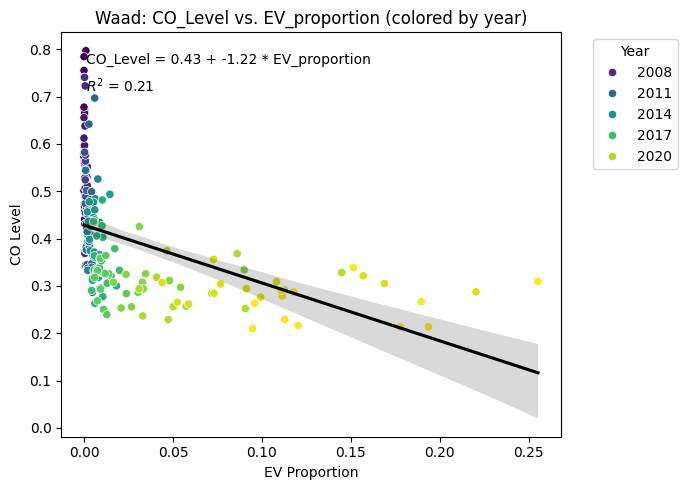

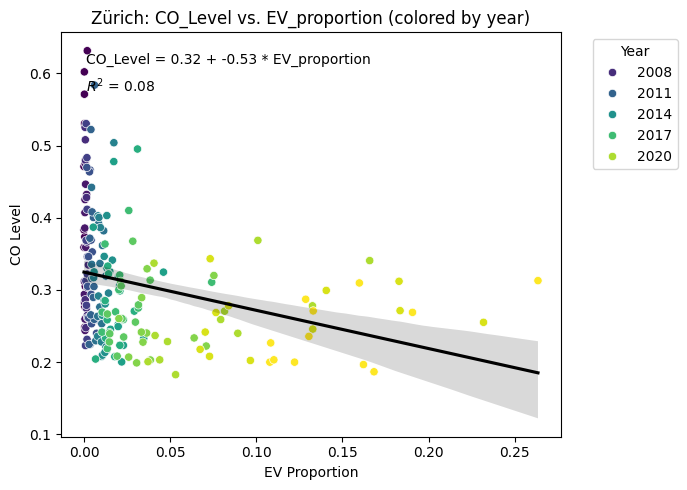

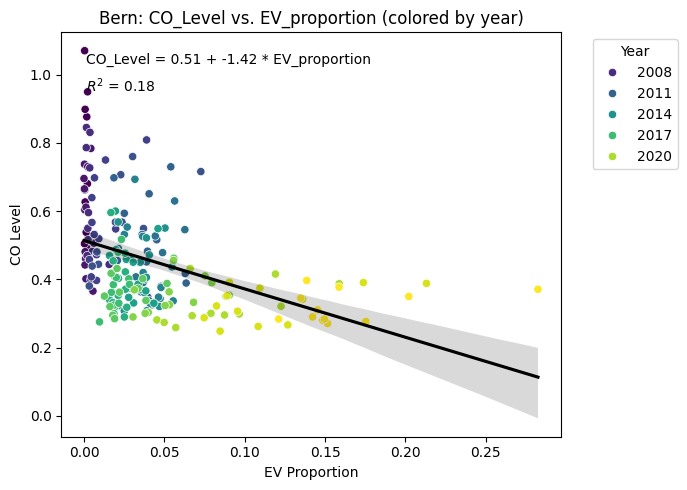

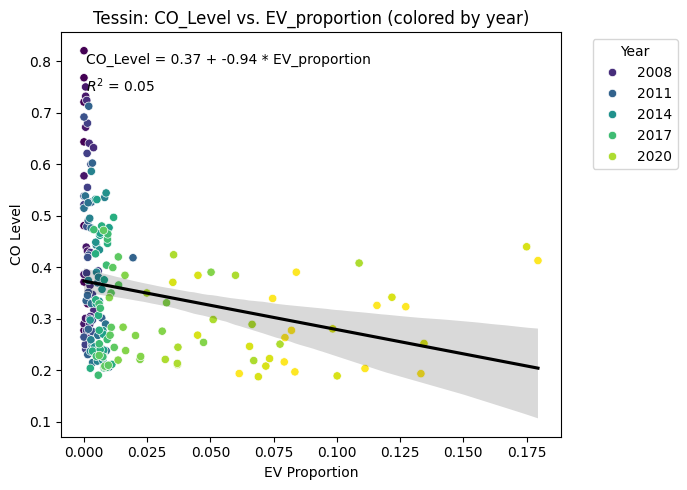

In [ ]:
# Unique cantons
cantons = CO_EV_merged['Canton'].unique()

# Loop through each canton
for canton in cantons:
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]

    if len(df) < 3:
        continue  # skip small groups

    # Regression setup
    X = df['EV_proportion']
    y = df['CO_Level']
    X_with_const = sm.add_constant(X)
    model = sm.OLS(y, X_with_const).fit()

    intercept = model.params['const']
    slope = model.params['EV_proportion']
    r_squared = model.rsquared

    # Plot setup
    plt.figure(figsize=(7, 5))

    # Colored scatterplot
    scatter = sns.scatterplot(
        x='EV_proportion',
        y='CO_Level',
        hue='Year',
        palette='viridis',
        data=df,
        legend='auto'
    )

    # Regression line
    sns.regplot(
        x='EV_proportion',
        y='CO_Level',
        data=df,
        scatter=False,
        line_kws={"color": "black"}
    )

    # Annotate
    equation = f"CO_Level = {intercept:.2f} + {slope:.2f} * EV_proportion"
    r2_text = f"$R^2$ = {r_squared:.2f}"
    plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
    plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

    # Titles and labels
    plt.title(f'{canton}: CO_Level vs. EV_proportion (colored by year)')
    plt.xlabel('EV Proportion')
    plt.ylabel('CO Level')
    plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

In [ ]:
import statsmodels.api as sm

# Prepare the data for regression
X = CO_EV_merged['EV_proportion']
y = CO_EV_merged['CO_Level']

# Add a constant to the independent variable
X = sm.add_constant(X)

# Fit the linear regression model
model = sm.OLS(y, X).fit()

# Print the model summary
print(model.summary())

# Extract R-squared
r_squared = model.rsquared

# Extract coefficients
intercept = model.params['const']
slope = model.params['EV_proportion']

print(f"R-squared: {r_squared}")
print(f"Regression Function: CO_Level = {intercept} + {slope} * EV_proportion")

#Take-away: Both the constant as well as EV_proportion are statistically sgnificantly different from zero

                            OLS Regression Results                            
Dep. Variable:               CO_Level   R-squared:                       0.073
Model:                            OLS   Adj. R-squared:                  0.071
Method:                 Least Squares   F-statistic:                     63.74
Date:                Sun, 11 May 2025   Prob (F-statistic):           4.84e-15
Time:                        14:00:50   Log-Likelihood:                 487.68
No. Observations:                 816   AIC:                            -971.4
Df Residuals:                     814   BIC:                            -962.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.4038      0.006     72.196

In [ ]:
import statsmodels.api as sm

# Loop over each canton
for canton in CO_EV_merged['Canton'].unique():
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]

    # Skip if too few observations
    if len(df) < 3:
        continue

    # Prepare the data
    X = sm.add_constant(df['EV_proportion'])
    y = df['CO_Level']

    # Fit the linear regression model
    model = sm.OLS(y, X).fit()

    # Extract results
    r_squared = model.rsquared
    intercept = model.params['const']
    slope = model.params['EV_proportion']

    # Print results for the canton
    print(f"--- {canton} ---")
    print(model.summary())
    print(f"R-squared: {r_squared:.4f}")
    print(f"Regression Function: CO_Level = {intercept:.4f} + {slope:.4f} * EV_proportion\n")

--- Waad ---
                            OLS Regression Results                            
Dep. Variable:               CO_Level   R-squared:                       0.206
Model:                            OLS   Adj. R-squared:                  0.202
Method:                 Least Squares   F-statistic:                     52.44
Date:                Sun, 11 May 2025   Prob (F-statistic):           9.11e-12
Time:                        14:00:50   Log-Likelihood:                 165.28
No. Observations:                 204   AIC:                            -326.6
Df Residuals:                     202   BIC:                            -319.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.4285      0.0

In [ ]:
from scipy.stats import f_oneway

# Group CO levels by year
groups = [group['CO_Level'].values for name, group in CO_EV_merged.groupby('Year')]

# Perform ANOVA
f_stat, p_value = f_oneway(*groups)

print(f"ANOVA F-statistic: {f_stat:.3f}")
print(f"P-value: {p_value:.5f}")

if p_value < 0.05:
    print("Significant differences in CO levels across years (p < 0.05)")
else:
    print("No significant difference in CO levels across years")

#this is a statistical test

ANOVA F-statistic: 23.432
P-value: 0.00000
Significant differences in CO levels across years (p < 0.05)


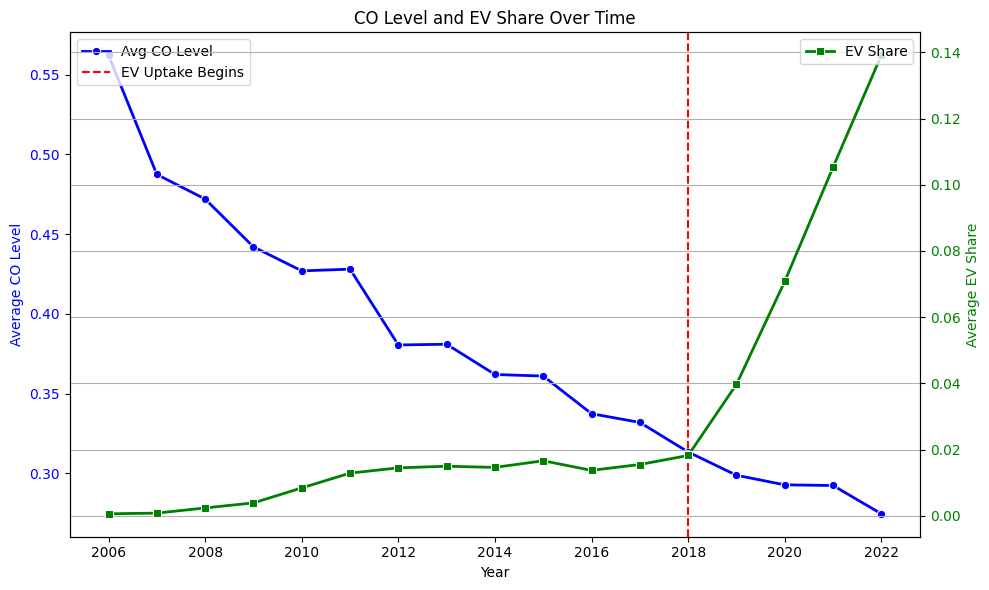

In [ ]:
# Compute yearly averages
yearly_avg = CO_EV_merged.groupby('Year')[['CO_Level', 'EV_proportion']].mean().reset_index()

# Create figure and first y-axis (CO Level)
fig, ax1 = plt.subplots(figsize=(10, 6))

sns.lineplot(data=yearly_avg, x='Year', y='CO_Level', marker='o', ax=ax1, color='blue', label='Avg CO Level', linewidth=2)
ax1.set_ylabel('Average CO Level', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Add vertical line for EV uptake start
ax1.axvline(x=2018, color='red', linestyle='--', label='EV Uptake Begins')
ax1.legend(loc='upper left')

# Create second y-axis (EV share)
ax2 = ax1.twinx()
sns.lineplot(data=yearly_avg, x='Year', y='EV_proportion', marker='s', ax=ax2, color='green', label='EV Share', linewidth=2)
ax2.set_ylabel('Average EV Share', color='green')
ax2.tick_params(axis='y', labelcolor='green')
ax2.legend(loc='upper right')

# Titles and formatting
plt.title('CO Level and EV Share Over Time')
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-89-abc40805c982>:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-89-abc40805c982>:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-89-abc40805c982>:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-89-abc40805c982>:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futu

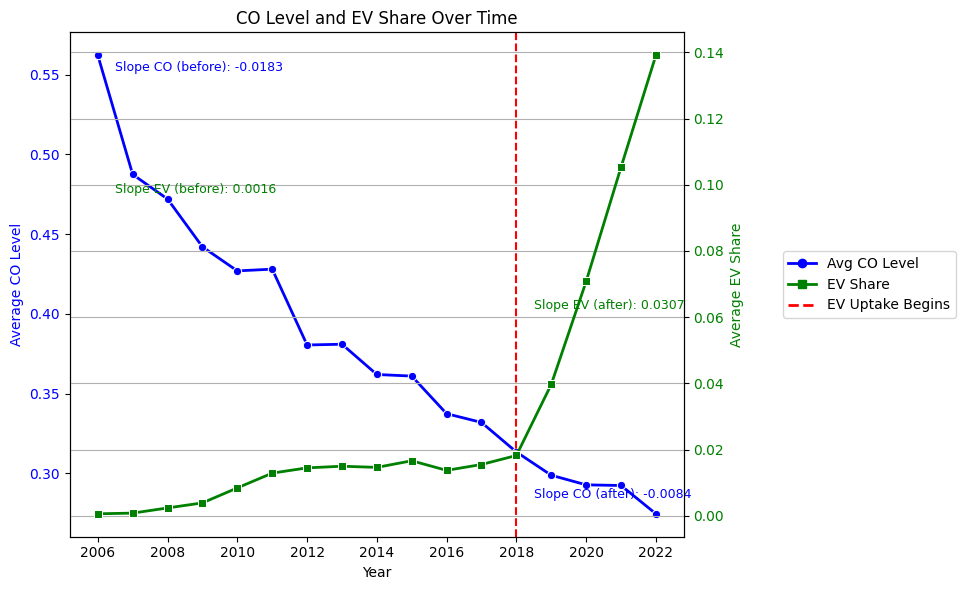

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from matplotlib.lines import Line2D

# Compute yearly averages
yearly_avg = CO_EV_merged.groupby('Year')[['CO_Level', 'EV_proportion']].mean().reset_index()

# Split into before/after 2018
before = yearly_avg[yearly_avg['Year'] < 2018]
after = yearly_avg[yearly_avg['Year'] >= 2018]

# Function to calculate slope from linear regression
def compute_slope(df, x_col, y_col):
    X = sm.add_constant(df[x_col])
    y = df[y_col]
    model = sm.OLS(y, X).fit()
    return model.params[1]

# Compute slopes
slope_CO_before = compute_slope(before, 'Year', 'CO_Level')
slope_CO_after = compute_slope(after, 'Year', 'CO_Level')
slope_EV_before = compute_slope(before, 'Year', 'EV_proportion')
slope_EV_after = compute_slope(after, 'Year', 'EV_proportion')

# Plot setup
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot CO levels
sns.lineplot(data=yearly_avg, x='Year', y='CO_Level', ax=ax1,
             marker='o', color='blue', linewidth=2)
ax1.set_ylabel('Average CO Level', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Add vertical line for EV uptake
ax1.axvline(x=2018, color='red', linestyle='--')

# Create secondary y-axis for EV share
ax2 = ax1.twinx()
sns.lineplot(data=yearly_avg, x='Year', y='EV_proportion', ax=ax2,
             marker='s', color='green', linewidth=2)
ax2.set_ylabel('Average EV Share', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Annotate slopes (positioned to avoid overlap)
ax1.text(2006.5, yearly_avg['CO_Level'].max() - 0.01,
         f"Slope CO (before): {slope_CO_before:.4f}", color='blue', fontsize=9)

ax1.text(2018.5, yearly_avg['CO_Level'].min() + 0.01,
         f"Slope CO (after): {slope_CO_after:.4f}", color='blue', fontsize=9)

ax2.text(2006.5, yearly_avg['EV_proportion'].max() * 0.7,
         f"Slope EV (before): {slope_EV_before:.4f}", color='green', fontsize=9)

ax2.text(2018.5, yearly_avg['EV_proportion'].max() * 0.45,
         f"Slope EV (after): {slope_EV_after:.4f}", color='green', fontsize=9)

# Custom legend elements
legend_elements = [
    Line2D([0], [0], color='blue', lw=2, marker='o', label='Avg CO Level'),
    Line2D([0], [0], color='green', lw=2, marker='s', label='EV Share'),
    Line2D([0], [0], color='red', lw=2, linestyle='--', label='EV Uptake Begins')
]

# Add combined legend to the right of the plot
ax1.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.15, 0.5), frameon=True)

# Formatting
plt.title('CO Level and EV Share Over Time')
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future v

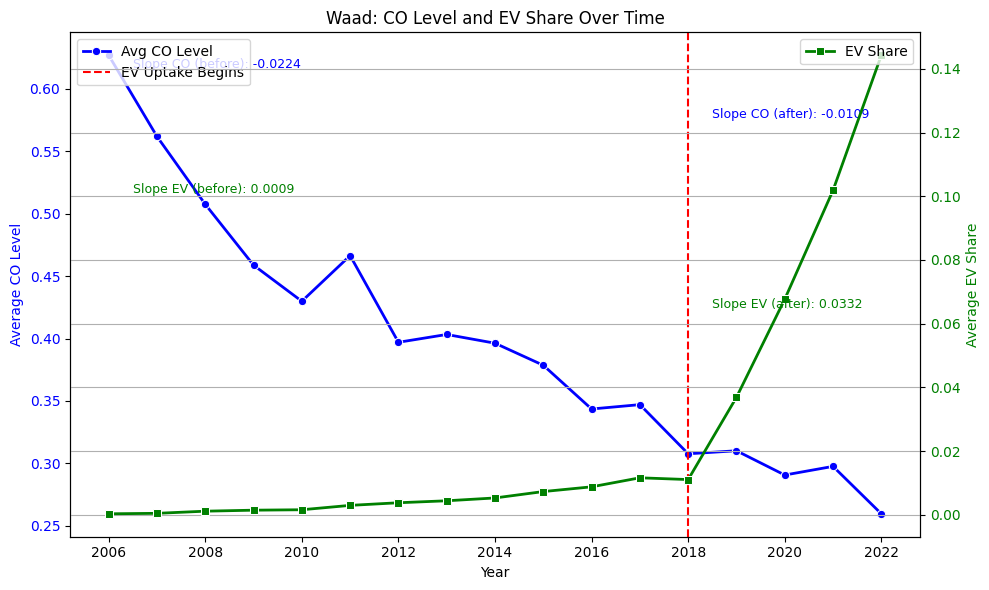

<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future v

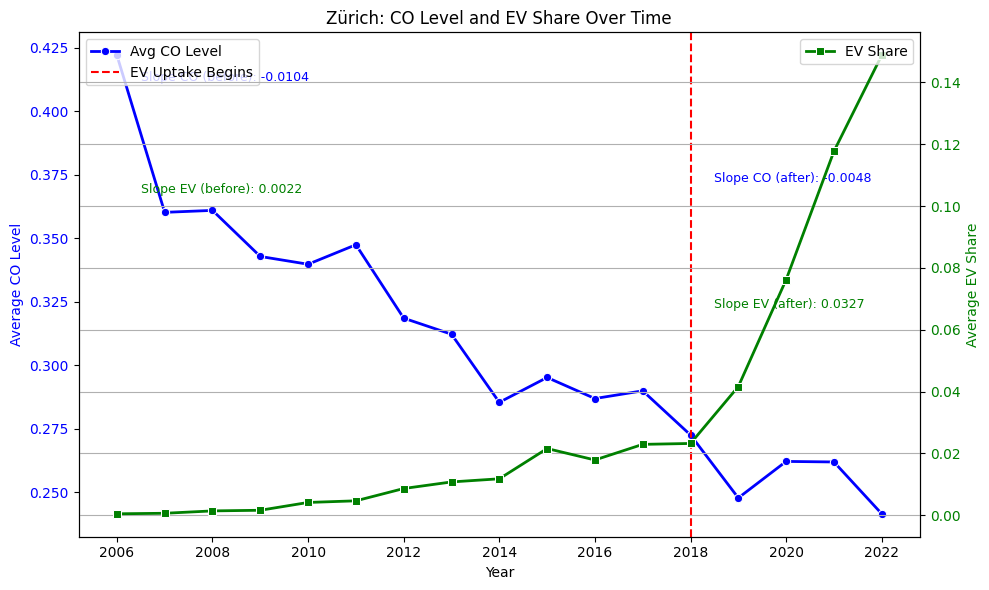

<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future v

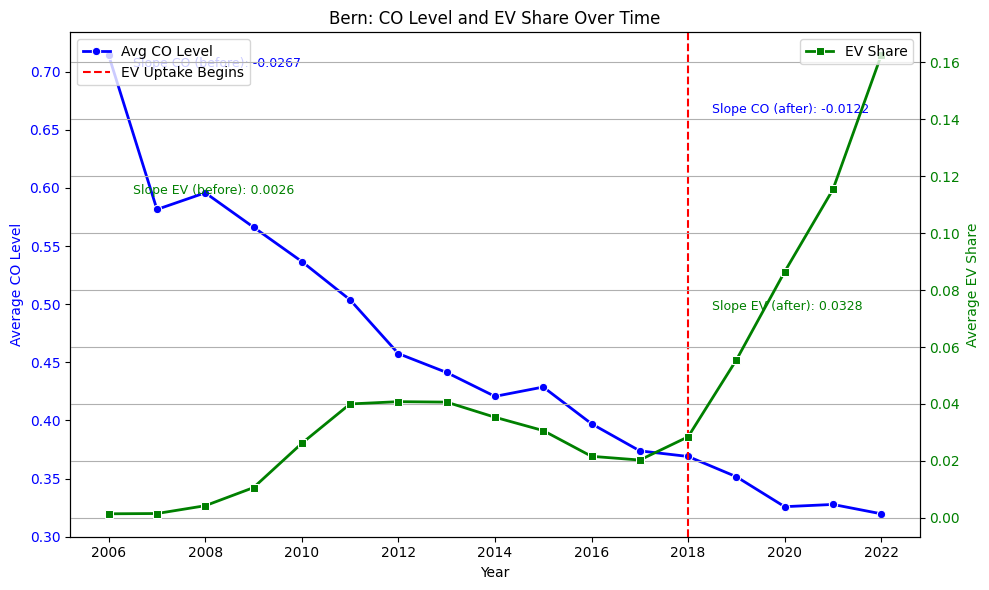

<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-90-0285b05ed7de>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future v

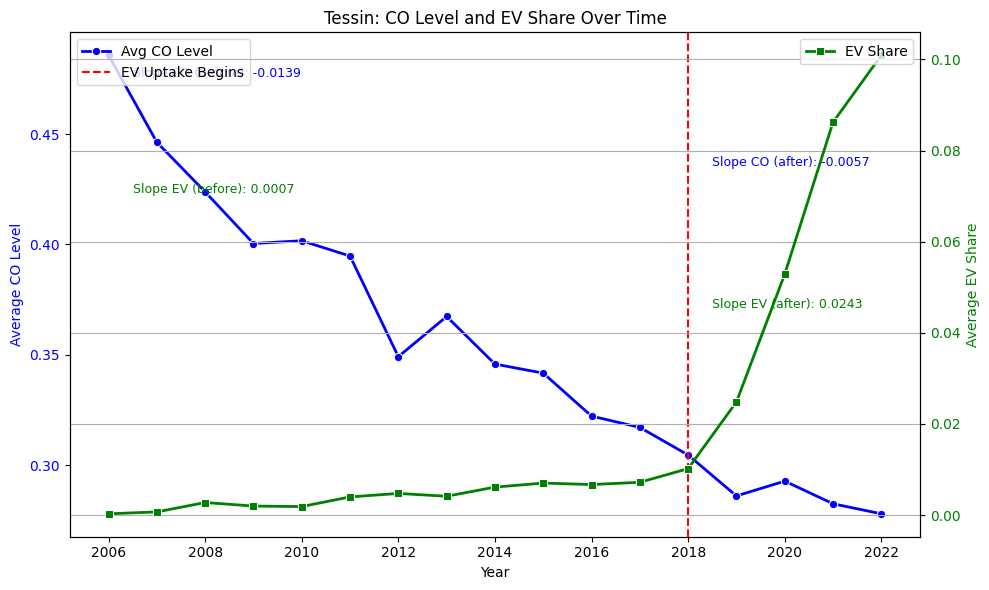

In [ ]:
# Function to calculate slope from linear regression
def compute_slope(df, x_col, y_col):
    X = sm.add_constant(df[x_col])
    y = df[y_col]
    model = sm.OLS(y, X).fit()
    return model.params[1]

# Loop through cantons
for canton in CO_EV_merged['Canton'].unique():
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]

    # Group by year and compute mean values
    yearly_avg = df.groupby('Year')[['CO_Level', 'EV_proportion']].mean().reset_index()

    # Skip if too few years
    if yearly_avg.shape[0] < 4:
        continue

    # Split into before/after 2018
    before = yearly_avg[yearly_avg['Year'] < 2018]
    after = yearly_avg[yearly_avg['Year'] >= 2018]

    # Compute slopes
    slope_CO_before = compute_slope(before, 'Year', 'CO_Level')
    slope_CO_after = compute_slope(after, 'Year', 'CO_Level')
    slope_EV_before = compute_slope(before, 'Year', 'EV_proportion')
    slope_EV_after = compute_slope(after, 'Year', 'EV_proportion')

    # Plot setup
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot CO levels
    sns.lineplot(data=yearly_avg, x='Year', y='CO_Level', ax=ax1,
                 marker='o', color='blue', label='Avg CO Level', linewidth=2)
    ax1.set_ylabel('Average CO Level', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.axvline(x=2018, color='red', linestyle='--', label='EV Uptake Begins')
    ax1.legend(loc='upper left')

    # Plot EV share
    ax2 = ax1.twinx()
    sns.lineplot(data=yearly_avg, x='Year', y='EV_proportion', ax=ax2,
                 marker='s', color='green', label='EV Share', linewidth=2)
    ax2.set_ylabel('Average EV Share', color='green')
    ax2.tick_params(axis='y', labelcolor='green')
    ax2.legend(loc='upper right')

    # Annotate slopes
    ax1.text(2006.5, yearly_avg['CO_Level'].max() - 0.01,
             f"Slope CO (before): {slope_CO_before:.4f}", color='blue', fontsize=9)
    ax1.text(2018.5, yearly_avg['CO_Level'].max() - 0.05,
             f"Slope CO (after): {slope_CO_after:.4f}", color='blue', fontsize=9)
    ax2.text(2006.5, yearly_avg['EV_proportion'].max() * 0.7,
             f"Slope EV (before): {slope_EV_before:.4f}", color='green', fontsize=9)
    ax2.text(2018.5, yearly_avg['EV_proportion'].max() * 0.45,
             f"Slope EV (after): {slope_EV_after:.4f}", color='green', fontsize=9)

    # Formatting
    plt.title(f'{canton}: CO Level and EV Share Over Time')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

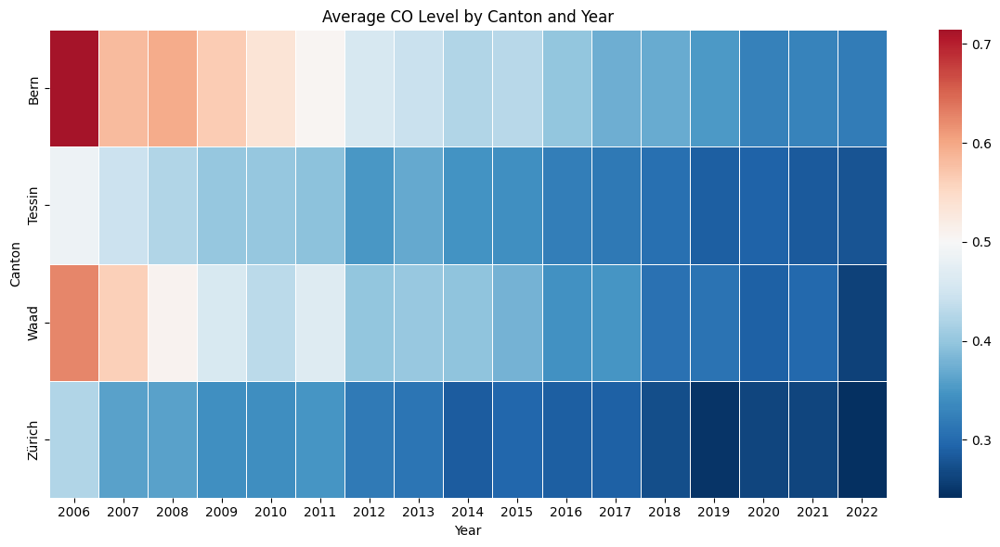

In [ ]:
pivot_table = CO_EV_merged.pivot_table(
    index='Canton',
    columns='Year',
    values='CO_Level',
    aggfunc='mean'
)

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_table, cmap='RdBu_r', annot=False, linewidths=0.5, center=0.5)
plt.title('Average CO Level by Canton and Year')
plt.xlabel('Year')
plt.ylabel('Canton')
plt.tight_layout()
plt.show()

<ipython-input-92-96149b10fb53>:38: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


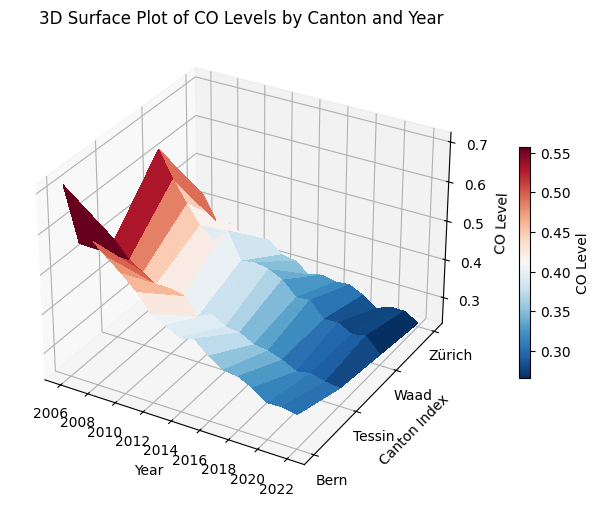

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Pivot data to 2D grid: Canton (rows) × Year (columns)
z_data = CO_EV_merged.pivot_table(
    index='Canton',
    columns='Year',
    values='CO_Level',
    aggfunc='mean'
)

# Create meshgrid for plotting
X, Y = np.meshgrid(z_data.columns, range(len(z_data.index)))
Z = z_data.values

# Plot 3D surface
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
surf = ax.plot_surface(
    X, Y, Z,
    cmap='RdBu_r',  # red = high CO, blue = low
    linewidth=0,
    antialiased=False
)

# Customize axes
ax.set_title('3D Surface Plot of CO Levels by Canton and Year')
ax.set_xlabel('Year')
ax.set_ylabel('Canton Index')
ax.set_zlabel('CO Level')
ax.set_yticks(range(len(z_data.index)))
ax.set_yticklabels(z_data.index)

# Add colorbar
fig.colorbar(surf, ax=ax, shrink=0.5, label='CO Level')

plt.tight_layout()
plt.show()

<ipython-input-93-15ea569fb755>:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


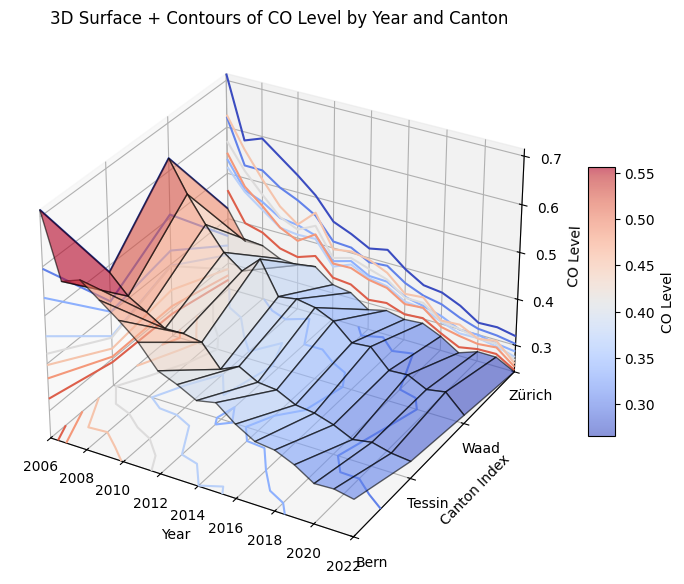

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Pivot: Canton × Year
z_data = CO_EV_merged.pivot_table(
    index='Canton',
    columns='Year',
    values='CO_Level',
    aggfunc='mean'
)

# Meshgrid
X, Y = np.meshgrid(z_data.columns, range(len(z_data.index)))
Z = z_data.values

# Create 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Surface
surf = ax.plot_surface(X, Y, Z, cmap='coolwarm', alpha=0.6, edgecolor='k')

# Contour projections on all 3 sides
ax.contour(X, Y, Z, zdir='z', offset=np.min(Z), cmap='coolwarm')
ax.contour(X, Y, Z, zdir='x', offset=np.min(X), cmap='coolwarm')
ax.contour(X, Y, Z, zdir='y', offset=np.max(Y), cmap='coolwarm')

# Axis labels and ticks
ax.set_xlabel('Year')
ax.set_ylabel('Canton Index')
ax.set_zlabel('CO Level')
ax.set_yticks(range(len(z_data.index)))
ax.set_yticklabels(z_data.index)

# Axis limits (optional)
ax.set_xlim(X.min(), X.max())
ax.set_ylim(Y.min(), Y.max())
ax.set_zlim(Z.min(), Z.max())

# Colorbar
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, label='CO Level')

plt.title('3D Surface + Contours of CO Level by Year and Canton')
plt.tight_layout()
plt.show()

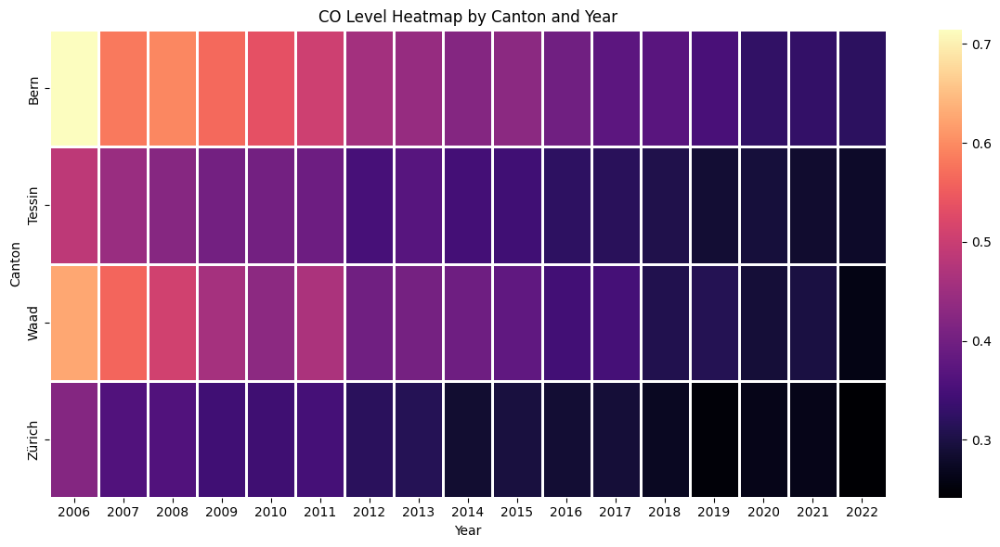

In [ ]:
# Pivot table: Canton × Year
z_data = CO_EV_merged.pivot_table(
    index='Canton',
    columns='Year',
    values='CO_Level',
    aggfunc='mean'
)

# Plot heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(
    z_data,
    cmap='magma',
    linewidths=1,
    linecolor='white',
    annot=False
)

plt.title('CO Level Heatmap by Canton and Year')
plt.xlabel('Year')
plt.ylabel('Canton')
plt.tight_layout()
plt.show()

### NOX and EV-share

In [ ]:
NOX_EV_merged.isna().sum()

,0
Canton,0
Year,0
Month,0
Total_cars,0
Number_EV,0
EV_proportion,0
Location,0
NOx_Level,0


In [ ]:
NOX_EV_merged.describe()

,Year,Month,Total_cars,Number_EV,EV_proportion,NOx_Level
count,1303.000000,1303.000000,1303.000000,1303.000000,1303.000000,1303.000000
mean,2014.314658,6.513431,5393.719110,160.508058,0.030334,44.971750
std,4.931403,3.452054,3863.078983,300.585026,0.046756,32.691075
min,2006.000000,1.000000,378.000000,0.000000,0.000000,3.454839
25%,2010.000000,4.000000,2027.000000,10.000000,0.002521,17.977527
50%,2015.000000,7.000000,4616.000000,36.000000,0.009504,36.800000
75%,2019.000000,10.000000,7326.000000,193.000000,0.035479,65.548763
max,2022.000000,12.000000,20400.000000,3368.000000,0.293532,189.086667


In [ ]:
NOX_EV_merged.head(5)

,Canton,Year,Month,Total_cars,Number_EV,EV_proportion,Location,NOx_Level
12,Basel-Stadt,2006,4,1458,2,0.001372,Basel-Binningen,26.336667
13,Basel-Stadt,2006,8,1218,2,0.001642,Basel-Binningen,13.283871
14,Basel-Stadt,2006,12,1684,0,0.000000,Basel-Binningen,65.654839
15,Basel-Stadt,2006,2,884,0,0.000000,Basel-Binningen,71.489286
16,Basel-Stadt,2006,1,816,4,0.004902,Basel-Binningen,81.058065


In [ ]:
# Count the occurrences of each canton in the 'Canton' column of CO_EV_merged
canton_counts = NOX_EV_merged['Canton'].value_counts()

# Print the results
canton_counts

,count
Canton,
Basel-Stadt,204
Bern,204
Thurgau,204
Tessin,204
Waad,204
Zürich,204
Aargau,79


In [ ]:
NOX_EV_merged.head(5)

,Canton,Year,Month,Total_cars,Number_EV,EV_proportion,Location,NOx_Level
12,Basel-Stadt,2006,4,1458,2,0.001372,Basel-Binningen,26.336667
13,Basel-Stadt,2006,8,1218,2,0.001642,Basel-Binningen,13.283871
14,Basel-Stadt,2006,12,1684,0,0.000000,Basel-Binningen,65.654839
15,Basel-Stadt,2006,2,884,0,0.000000,Basel-Binningen,71.489286
16,Basel-Stadt,2006,1,816,4,0.004902,Basel-Binningen,81.058065


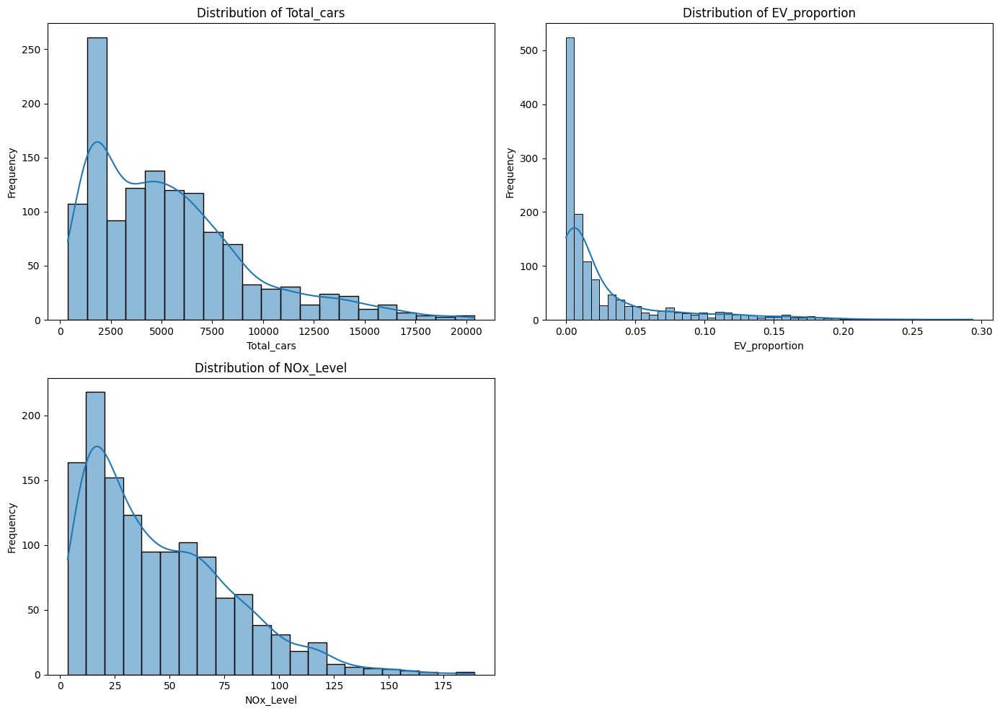

In [ ]:
# Select the columns to plot
cols_to_plot = ['Total_cars', 'EV_proportion', 'NOx_Level']

# Create 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()  # Flatten to simplify indexing

# Plot each column
for i, col in enumerate(cols_to_plot):
    sns.histplot(NOX_EV_merged[col], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# Remove the unused subplot
fig.delaxes(axes[len(cols_to_plot)])

plt.tight_layout()
plt.show()

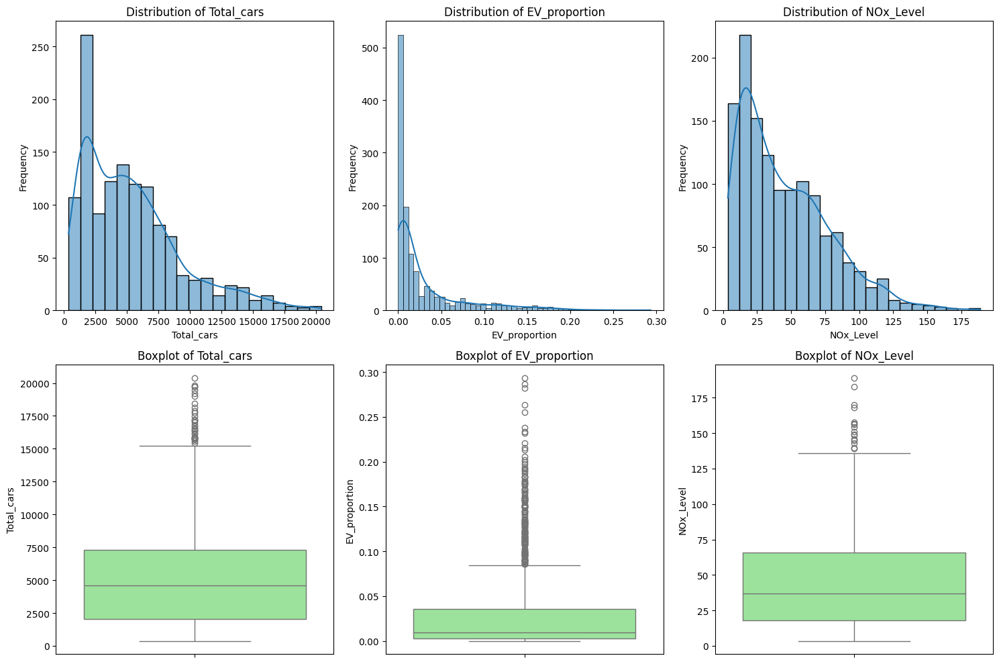

In [ ]:
# Select the columns to plot
cols_to_plot = ['Total_cars', 'EV_proportion', 'NOx_Level']

# Create 2x3 subplots (1st row: histograms, 2nd row: boxplots)
fig, axes = plt.subplots(2, len(cols_to_plot), figsize=(5 * len(cols_to_plot), 10))

# Plot histograms with KDE on top row
for i, col in enumerate(cols_to_plot):
    sns.histplot(NOX_EV_merged[col], kde=True, ax=axes[0][i])
    axes[0][i].set_title(f'Distribution of {col}')
    axes[0][i].set_xlabel(col)
    axes[0][i].set_ylabel('Frequency')

# Plot boxplots on bottom row
for i, col in enumerate(cols_to_plot):
    sns.boxplot(y=NOX_EV_merged[col], ax=axes[1][i], color='lightgreen')
    axes[1][i].set_title(f'Boxplot of {col}')
    axes[1][i].set_xlabel('')
    axes[1][i].set_ylabel(col)

plt.tight_layout()
plt.show()

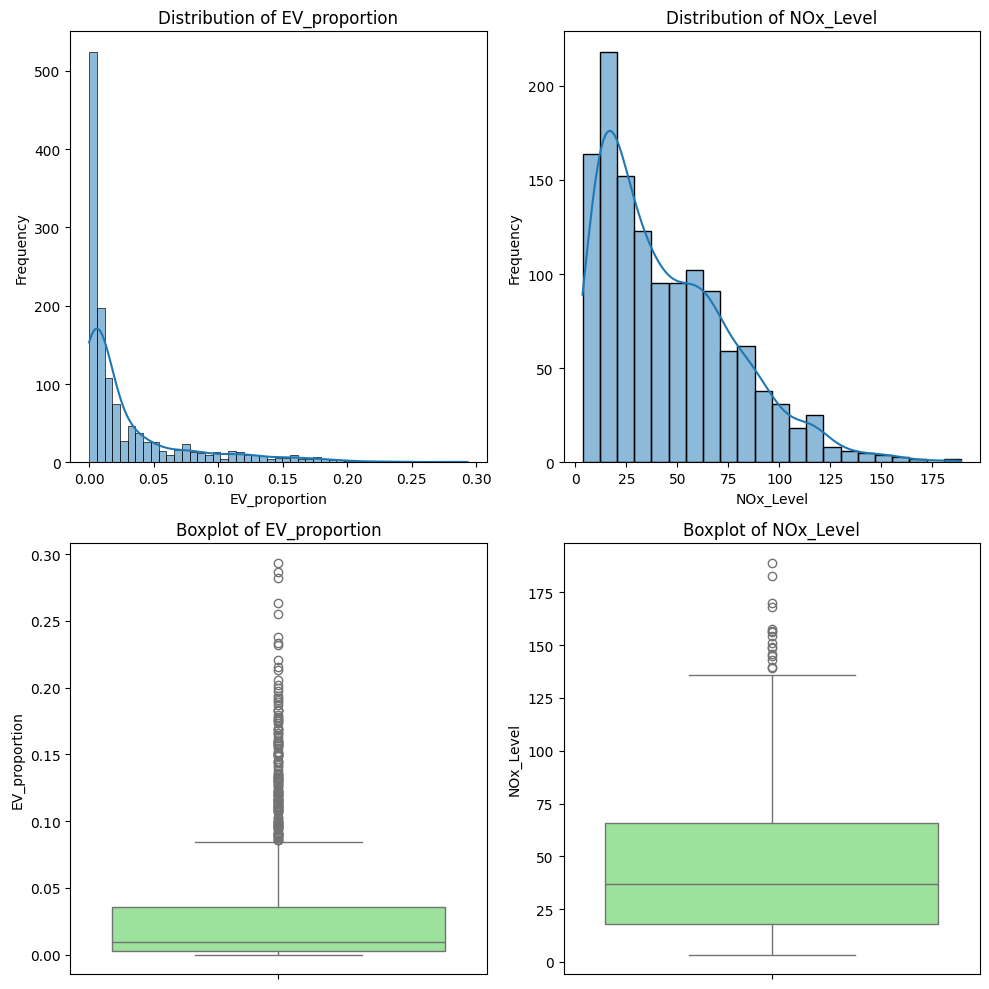

In [ ]:
# Select the columns to plot
cols_to_plot = ['EV_proportion', 'NOx_Level']

# Create 2x3 subplots (1st row: histograms, 2nd row: boxplots)
fig, axes = plt.subplots(2, len(cols_to_plot), figsize=(5 * len(cols_to_plot), 10))

# Plot histograms with KDE on top row
for i, col in enumerate(cols_to_plot):
    sns.histplot(NOX_EV_merged[col], kde=True, ax=axes[0][i])
    axes[0][i].set_title(f'Distribution of {col}')
    axes[0][i].set_xlabel(col)
    axes[0][i].set_ylabel('Frequency')

# Plot boxplots on bottom row
for i, col in enumerate(cols_to_plot):
    sns.boxplot(y=NOX_EV_merged[col], ax=axes[1][i], color='lightgreen')
    axes[1][i].set_title(f'Boxplot of {col}')
    axes[1][i].set_xlabel('')
    axes[1][i].set_ylabel(col)

plt.tight_layout()
plt.show()

In [ ]:
# Select the relevant columns
cols_to_analyze = ['Total_cars', 'Number_EV', 'EV_proportion', 'NOx_Level']

# Calculate skewness
skew_values = NOX_EV_merged[cols_to_analyze].skew()

# Print the results
print("Skewness of selected features:")
print(skew_values)

Skewness of selected features:
Total_cars       1.162698
Number_EV        4.220504
EV_proportion    2.305815
NOx_Level        1.010663
dtype: float64


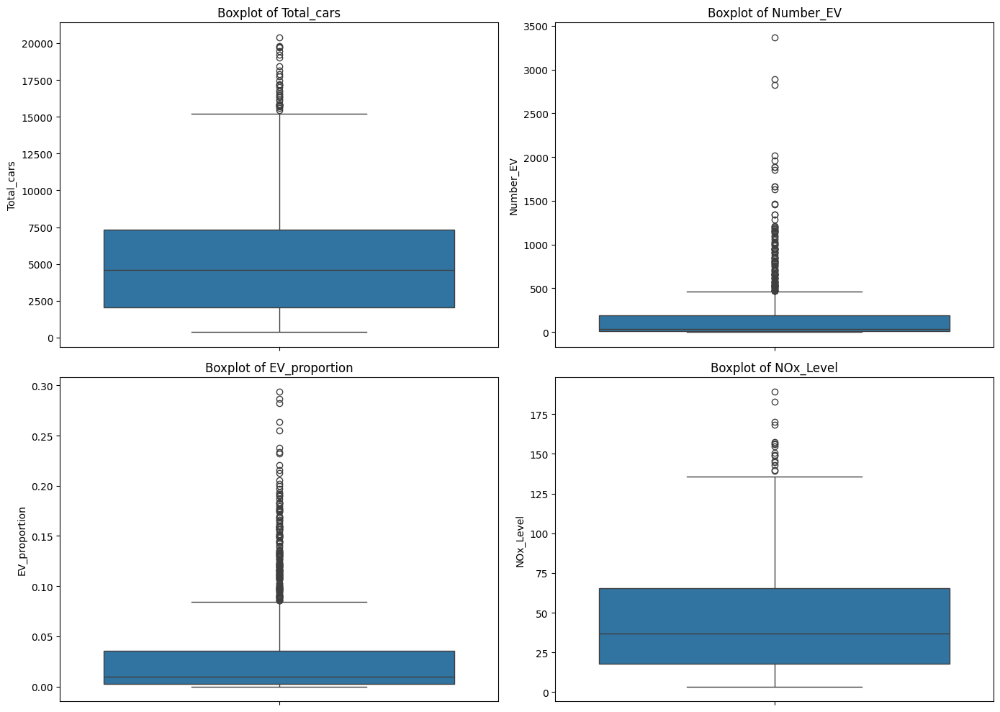

In [ ]:
# Columns to plot
cols_to_plot = ['Total_cars', 'Number_EV', 'EV_proportion', 'NOx_Level']

# Create 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

# Create boxplots
for i, col in enumerate(cols_to_plot):
    sns.boxplot(y=NOX_EV_merged[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_ylabel(col)

plt.tight_layout()
plt.show()

<ipython-input-105-a4b79331f3db>:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=NOX_EV_merged[time_col], y=NOX_EV_merged[col], ax=axes[i], ci=None)
<ipython-input-105-a4b79331f3db>:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=NOX_EV_merged[time_col], y=NOX_EV_merged[col], ax=axes[i], ci=None)
<ipython-input-105-a4b79331f3db>:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=NOX_EV_merged[time_col], y=NOX_EV_merged[col], ax=axes[i], ci=None)
<ipython-input-105-a4b79331f3db>:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=NOX_EV_merged[time_col], y=NOX_EV_merged[col], ax=axes[i], ci=None)


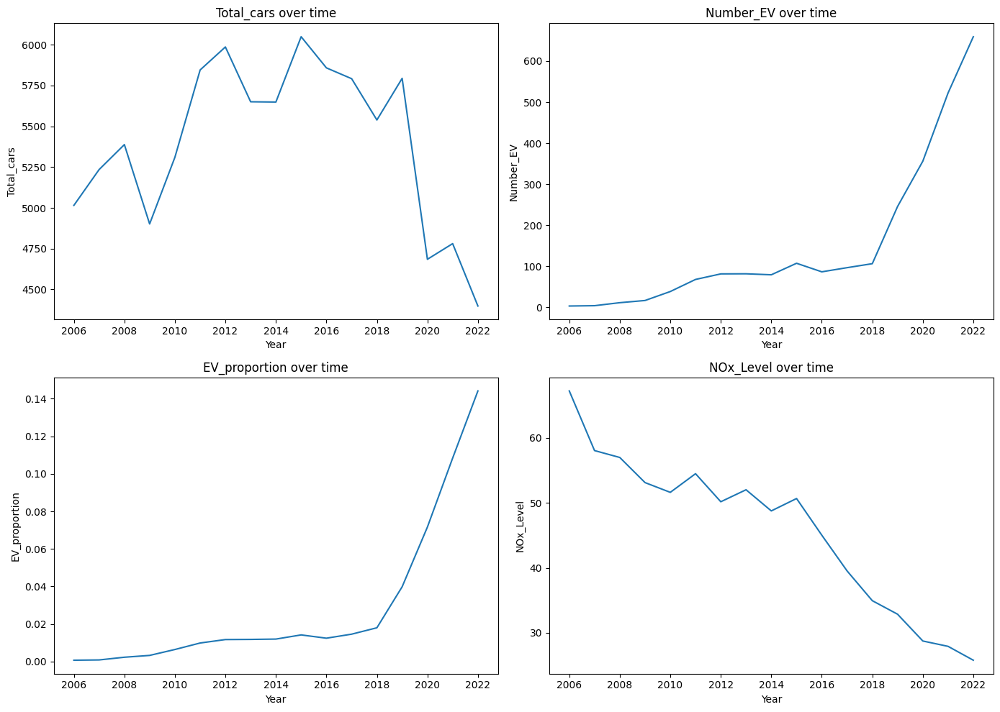

In [ ]:
# Ensure the time variable is available and sorted
NOX_EV_merged = NOX_EV_merged.sort_values('Year')

# Set the time column name
time_col = 'Year'

# Columns to plot
cols_to_plot = ['Total_cars', 'Number_EV', 'EV_proportion', 'NOx_Level']

# Create 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

# Line plot over time for each variable without confidence interval
for i, col in enumerate(cols_to_plot):
    sns.lineplot(x=NOX_EV_merged[time_col], y=NOX_EV_merged[col], ax=axes[i], ci=None)
    axes[i].set_title(f'{col} over time')
    axes[i].set_xlabel(time_col)
    axes[i].set_ylabel(col)

plt.tight_layout()
plt.show()

<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


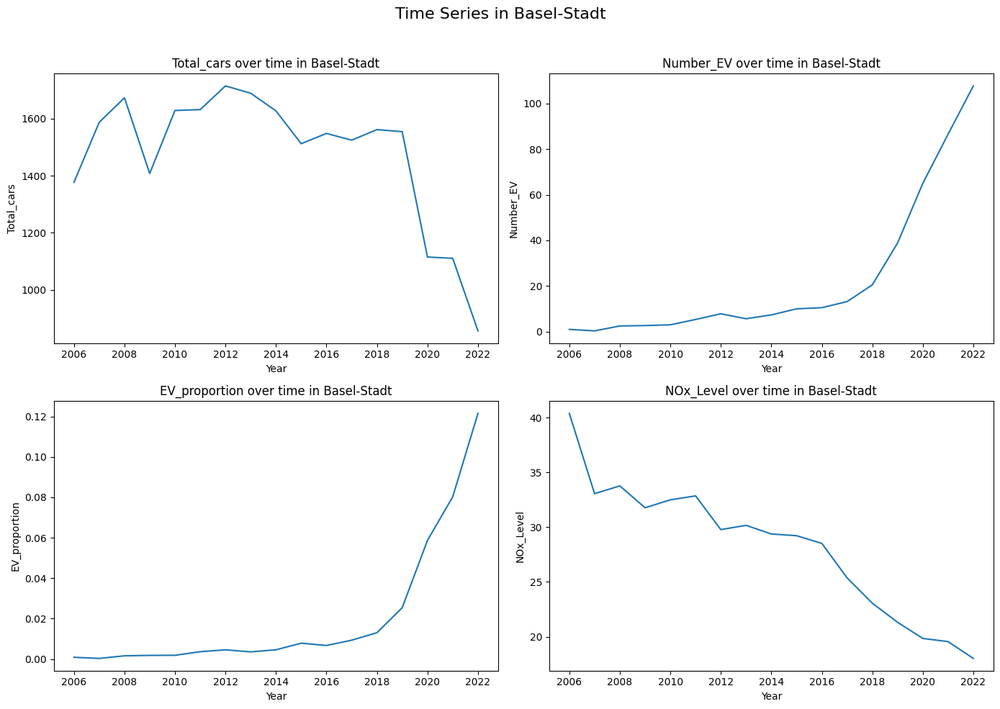

<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


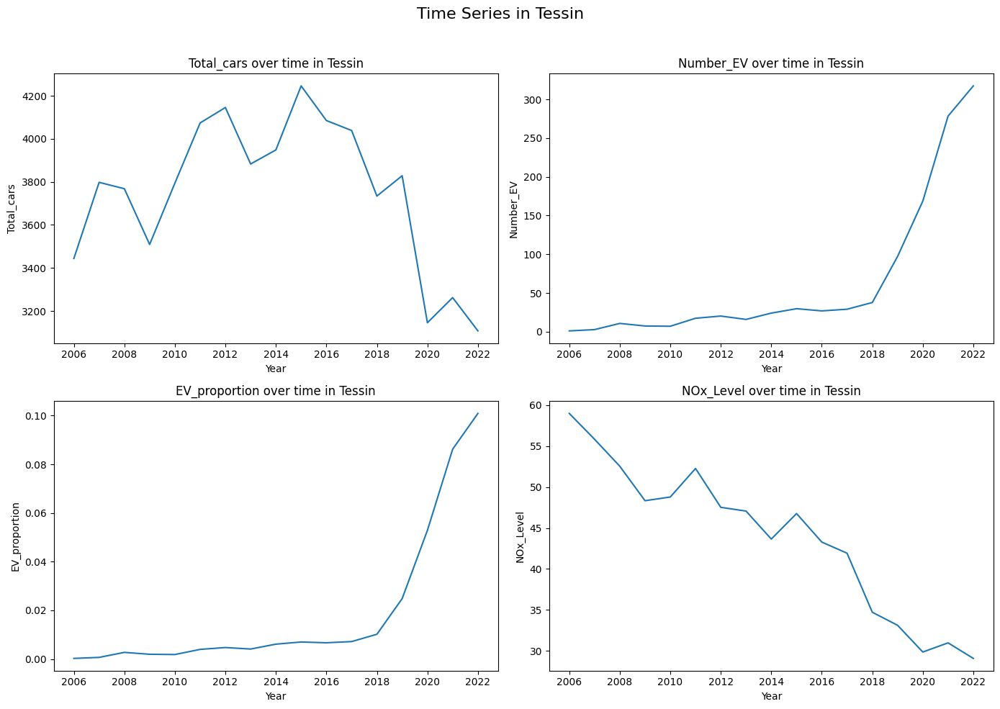

<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


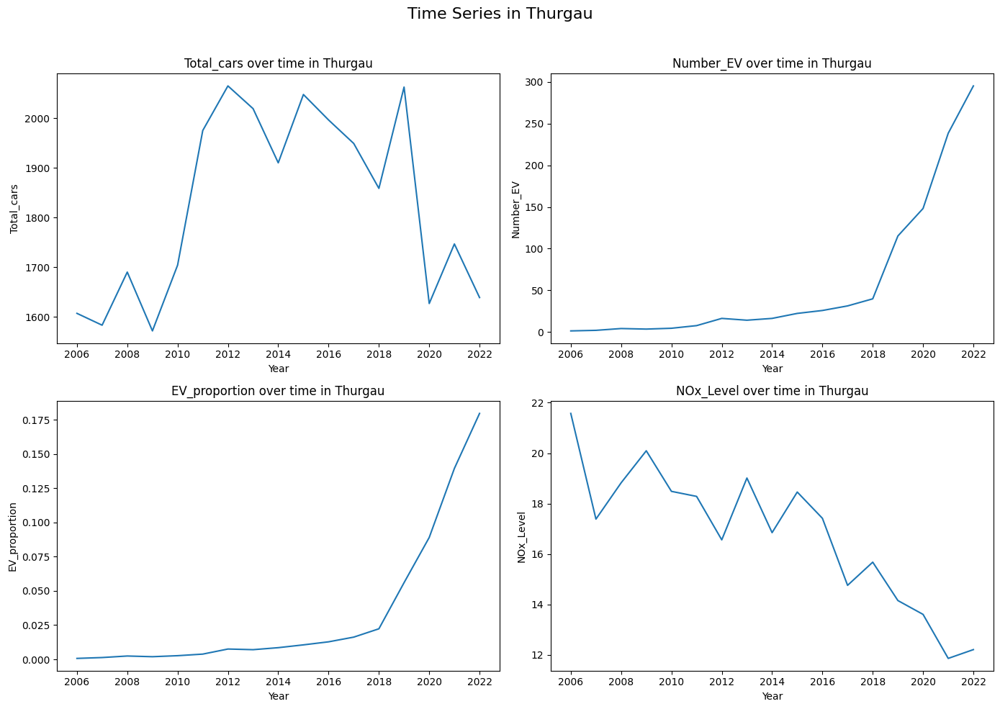

<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


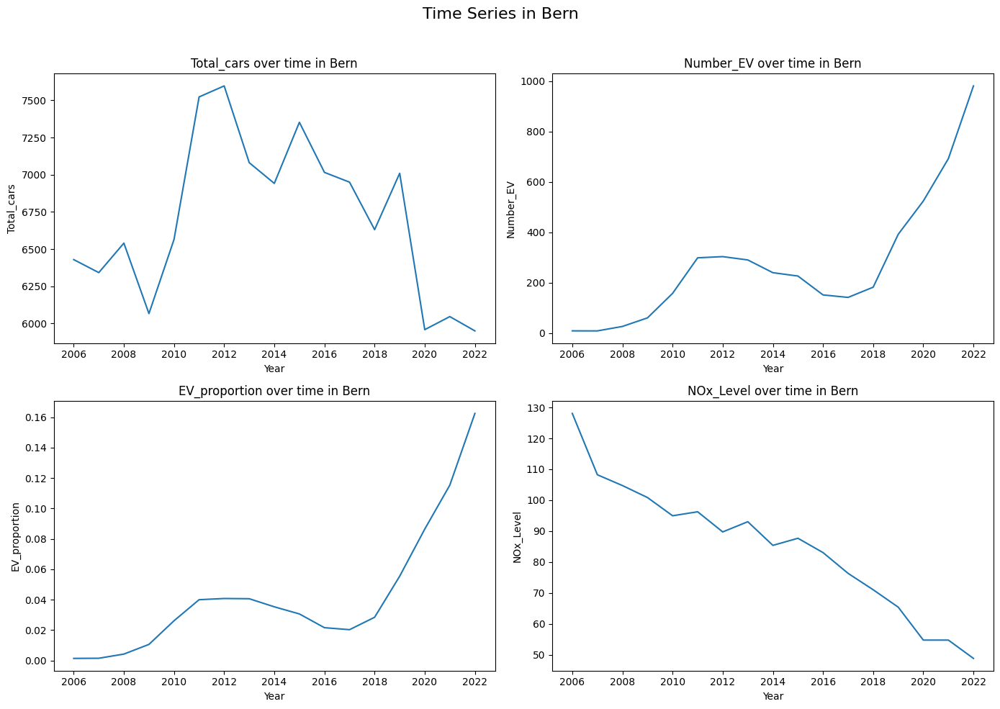

<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


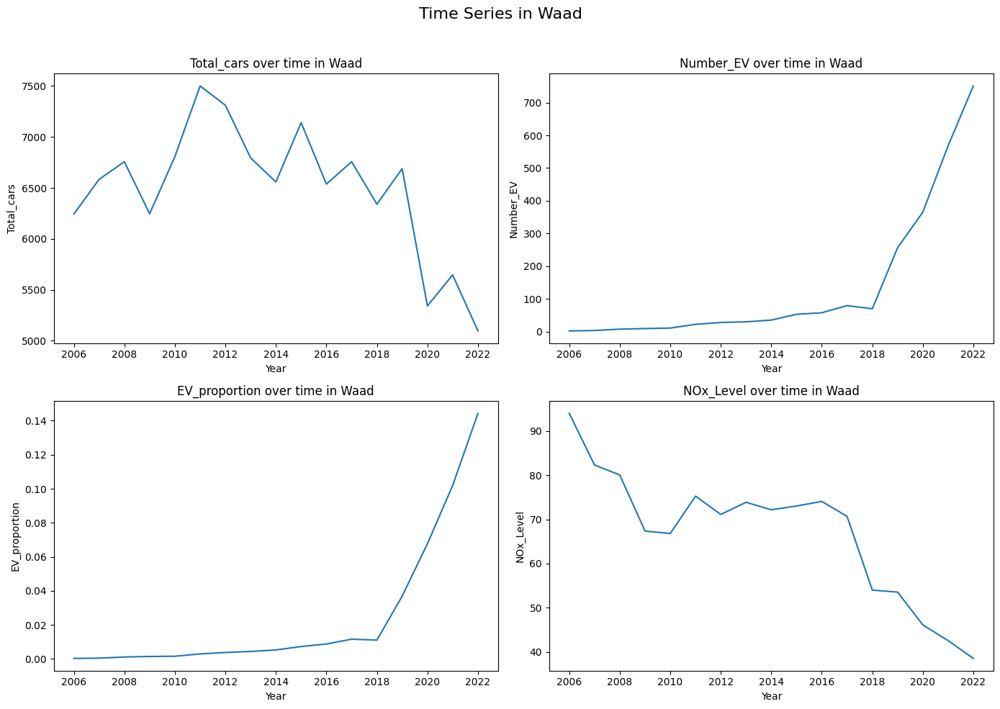

<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


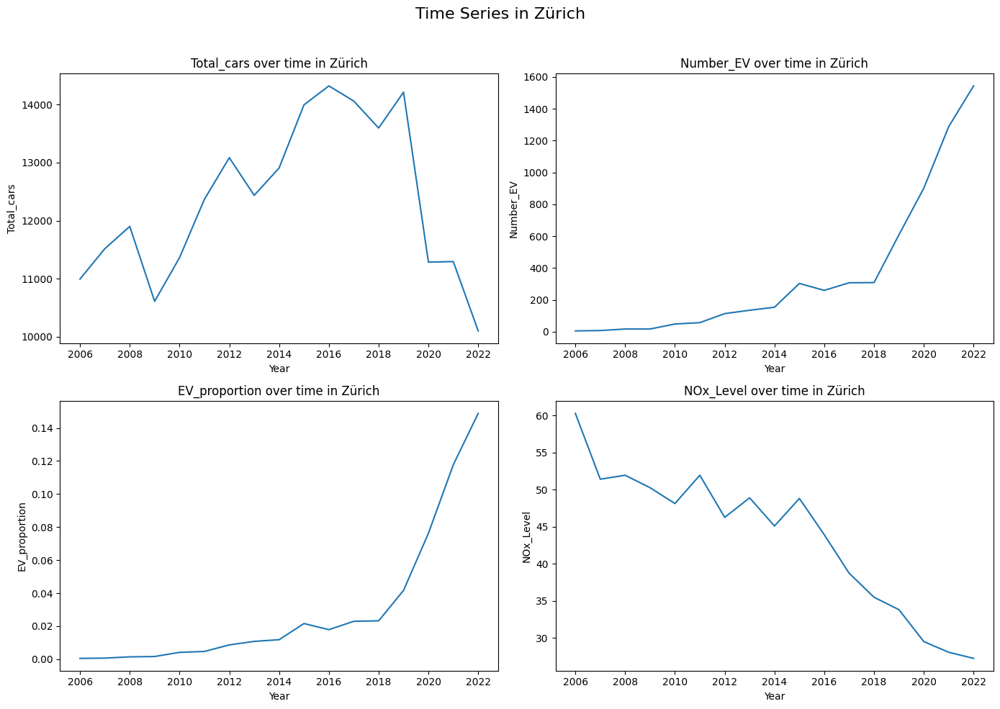

<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-106-982c05aec647>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


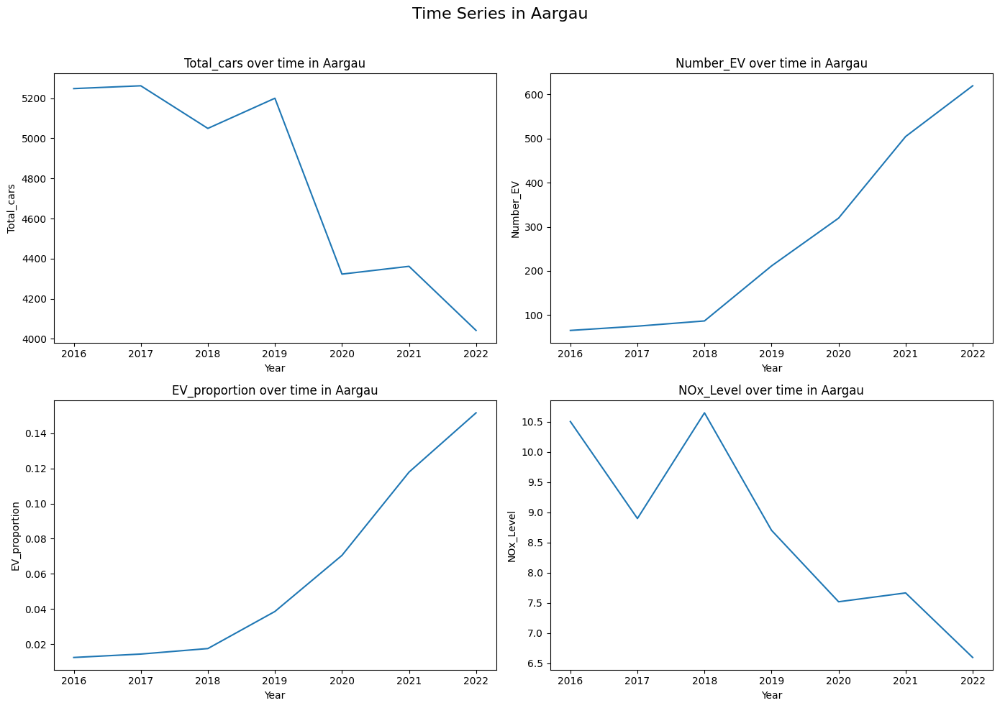

In [ ]:
# Ensure data is sorted
NOX_EV_merged = NOX_EV_merged.sort_values('Year')

# Define time column and variables to plot
time_col = 'Year'
cols_to_plot = ['Total_cars', 'Number_EV', 'EV_proportion', 'NOx_Level']

# Loop through each canton
for canton in NOX_EV_merged['Canton'].unique():
    df = NOX_EV_merged[NOX_EV_merged['Canton'] == canton]

    # Skip if too few data points
    if df.shape[0] < 3:
        continue

    # Create 2x2 subplots
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    # Plot each variable
    for i, col in enumerate(cols_to_plot):
        sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
        axes[i].set_title(f'{col} over time in {canton}')
        axes[i].set_xlabel(time_col)
        axes[i].set_ylabel(col)

    plt.suptitle(f'Time Series in {canton}', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

<ipython-input-107-e66d1d01daf1>:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)
<ipython-input-107-e66d1d01daf1>:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)
<ipython-input-107-e66d1d01daf1>:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)
<ipython-input-107-e66d1d01daf1>:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)


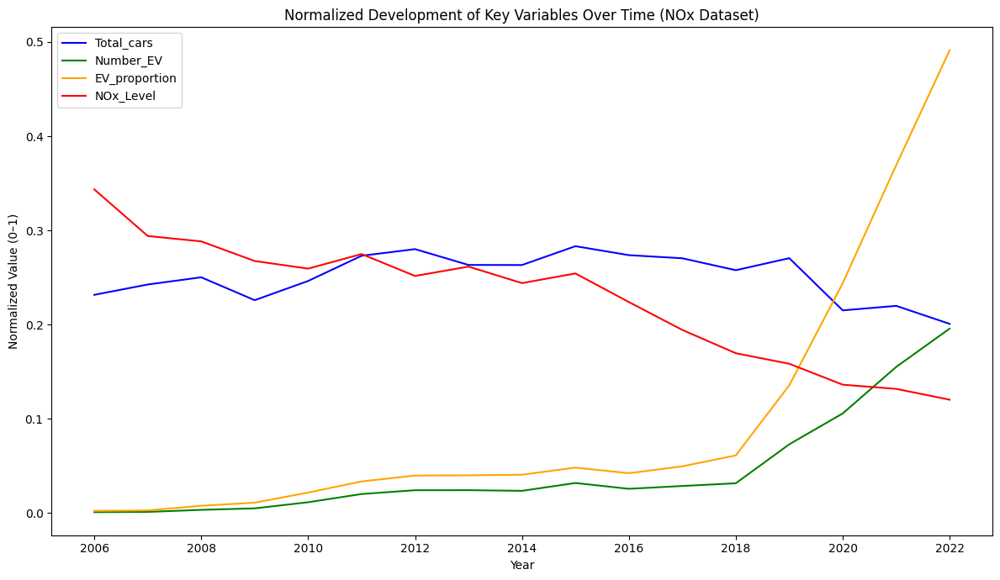

In [ ]:
# Make sure data is sorted by Year
NOX_EV_merged = NOX_EV_merged.sort_values('Year')

# Select variables
cols_to_plot = ['Total_cars', 'Number_EV', 'EV_proportion', 'NOx_Level']
colors = ['blue', 'green', 'orange', 'red']

# Normalize values (min-max)
normalized_df = NOX_EV_merged.copy()
for col in cols_to_plot:
    col_min = NOX_EV_merged[col].min()
    col_max = NOX_EV_merged[col].max()
    normalized_df[col] = (NOX_EV_merged[col] - col_min) / (col_max - col_min)

# Plot all on a single figure
plt.figure(figsize=(12, 7))

for col, color in zip(cols_to_plot, colors):
    sns.lineplot(x=normalized_df['Year'], y=normalized_df[col], label=col, color=color, ci=None)

plt.title("Normalized Development of Key Variables Over Time (NOx Dataset)")
plt.xlabel("Year")
plt.ylabel("Normalized Value (0–1)")
plt.legend()
plt.tight_layout()
plt.show()

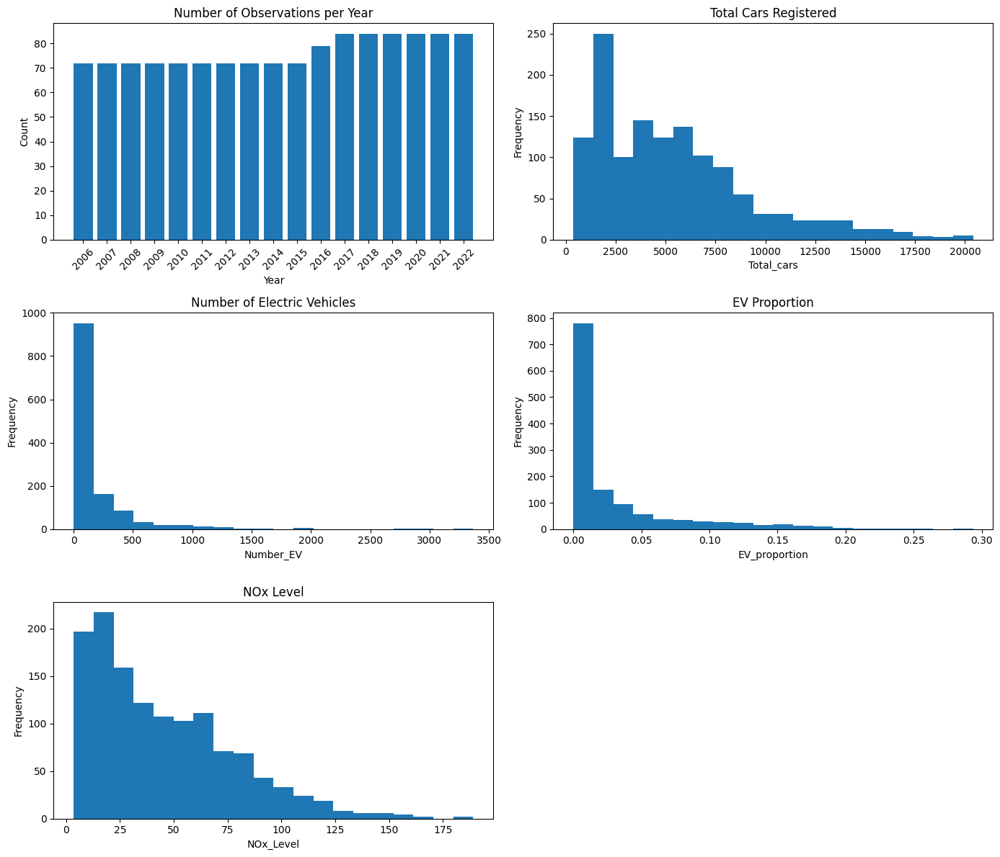

In [ ]:
# Set up the figure with 5 subplots (1 bar, 4 histograms)
fig, axes = plt.subplots(3, 2, figsize=(14, 12))
axes = axes.flatten()

# 1. Bar plot for Year
year_counts = NOX_EV_merged['Year'].value_counts().sort_index()
axes[0].bar(year_counts.index.astype(str), year_counts.values)
axes[0].set_title("Number of Observations per Year")
axes[0].set_xlabel("Year")
axes[0].set_ylabel("Count")
axes[0].tick_params(axis='x', rotation=45)

# 2–5. Histograms for the other columns
hist_cols = ['Total_cars', 'Number_EV', 'EV_proportion', 'NOx_Level']
titles = ["Total Cars Registered", "Number of Electric Vehicles", "EV Proportion", "NOx Level"]

for i, (col, title) in enumerate(zip(hist_cols, titles), start=1):
    axes[i].hist(NOX_EV_merged[col], bins=20)
    axes[i].set_title(title)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Frequency")

# Remove any unused subplots
for j in range(len(hist_cols) + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

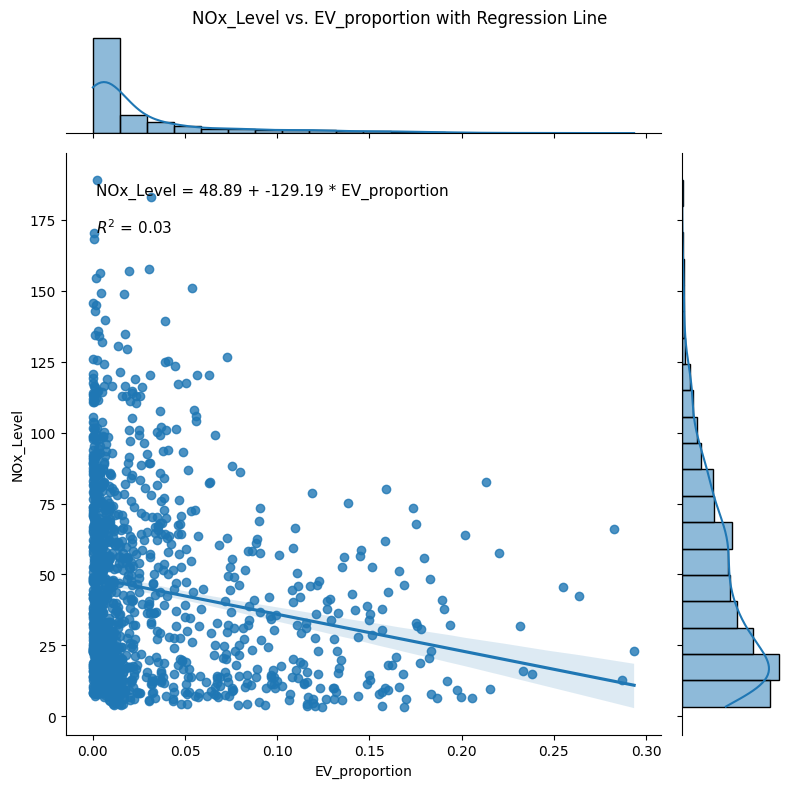

In [ ]:
X = NOX_EV_merged['EV_proportion']
y = NOX_EV_merged['NOx_Level']

# Fit regression model manually
X_with_const = sm.add_constant(X)
model = sm.OLS(y, X_with_const).fit()
intercept = model.params['const']
slope = model.params['EV_proportion']
r_squared = model.rsquared

# Create joint plot
g = sns.jointplot(
    data=NOX_EV_merged,
    x='EV_proportion',
    y='NOx_Level',
    kind='reg',
    height=8,
    marginal_kws={'bins': 20, 'fill': True}
)

# Add regression equation and R² as annotation
plt.subplots_adjust(top=0.95)
g.fig.suptitle('NOx_Level vs. EV_proportion with Regression Line')

equation = f"NOx_Level = {intercept:.2f} + {slope:.2f} * EV_proportion"
r2_text = f"$R^2$ = {r_squared:.2f}"

# Annotate on the main axis
ax = g.ax_joint
ax.text(0.05, 0.95, equation, transform=ax.transAxes, fontsize=11, verticalalignment='top')
ax.text(0.05, 0.89, r2_text, transform=ax.transAxes, fontsize=11, verticalalignment='top')

plt.show()

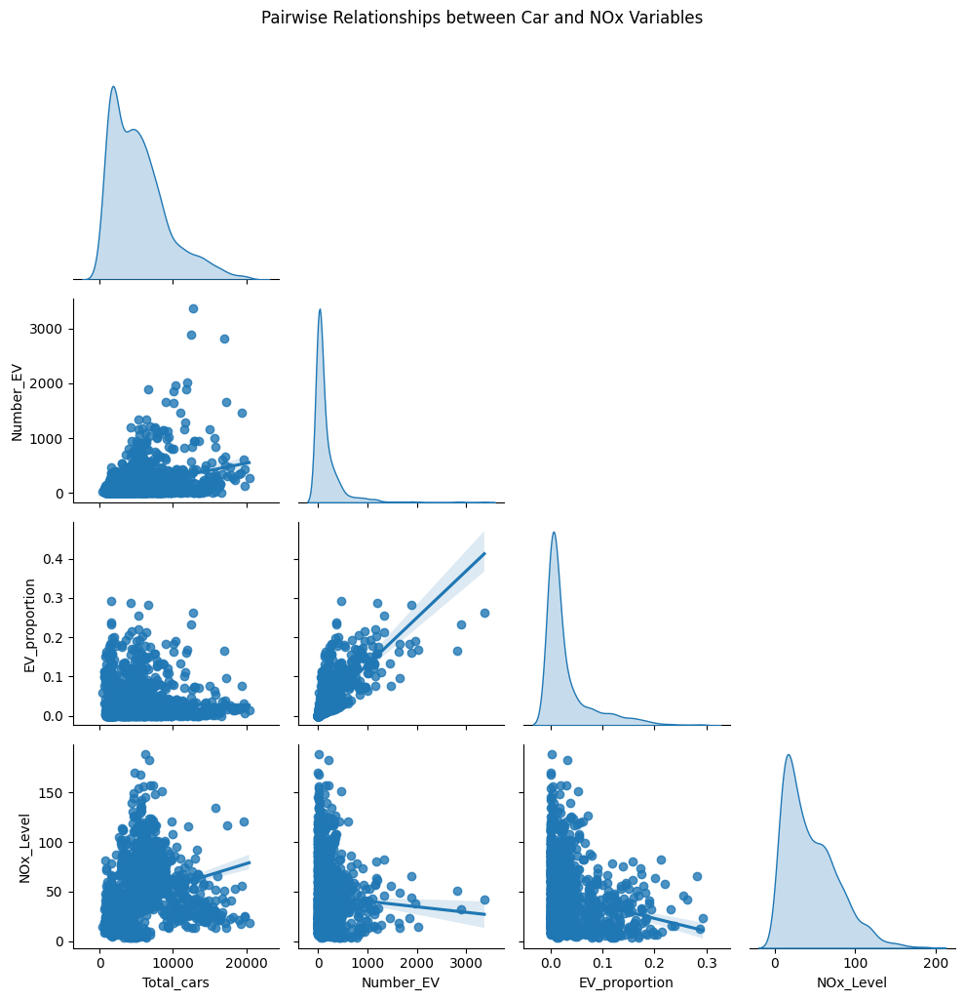

In [ ]:
pairplot_vars = ['Total_cars', 'Number_EV', 'EV_proportion', 'NOx_Level']

# Create the pairplot
sns.pairplot(NOX_EV_merged[pairplot_vars], kind='reg', diag_kind='kde', corner=True)

plt.suptitle("Pairwise Relationships between Car and NOx Variables", y=1.02)
plt.tight_layout()
plt.show()

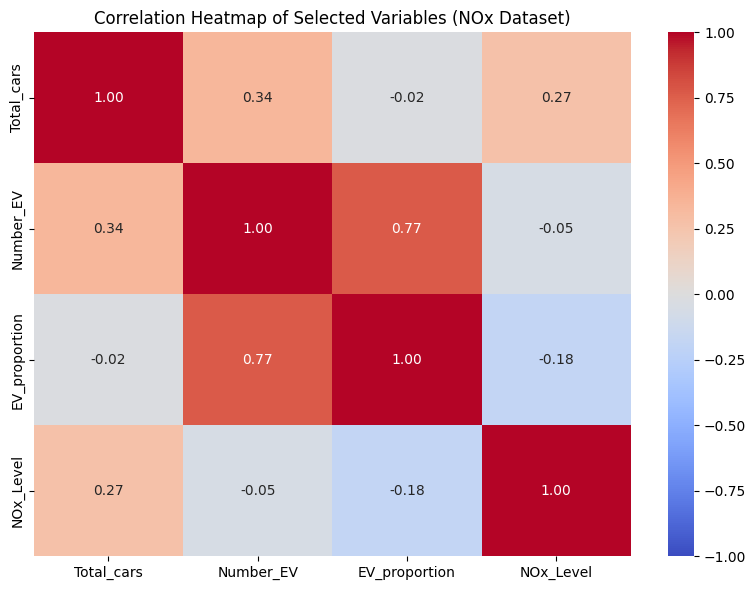

In [ ]:
corr_vars = ['Total_cars', 'Number_EV', 'EV_proportion', 'NOx_Level']

# Compute the correlation matrix
corr_matrix = NOX_EV_merged[corr_vars].corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title('Correlation Heatmap of Selected Variables (NOx Dataset)')
plt.tight_layout()
plt.show()

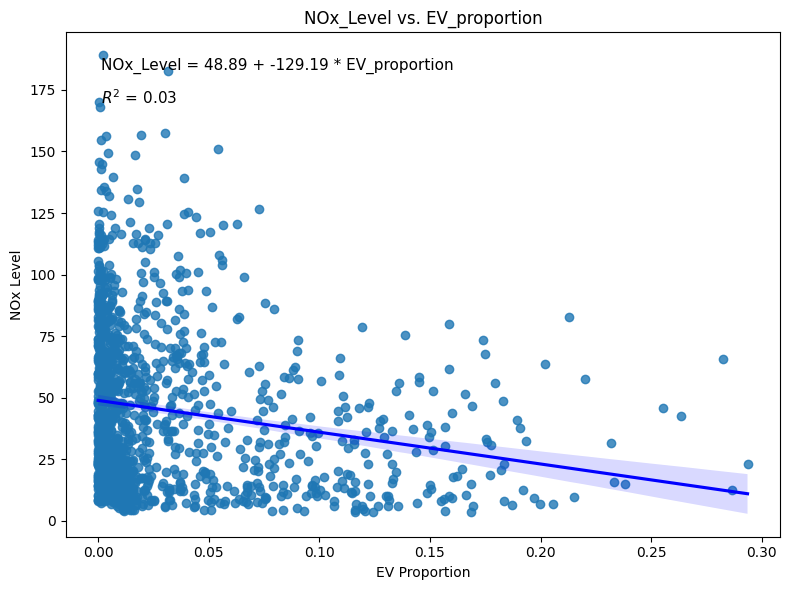

In [ ]:
# Prepare the data
X = NOX_EV_merged['EV_proportion']
y = NOX_EV_merged['NOx_Level']

# Add constant for intercept
X_with_const = sm.add_constant(X)
model = sm.OLS(y, X_with_const).fit()

# Extract regression values
intercept = model.params['const']
slope = model.params['EV_proportion']
r_squared = model.rsquared

# Plot
plt.figure(figsize=(8, 6))
sns.regplot(x='EV_proportion', y='NOx_Level', data=NOX_EV_merged, line_kws={"color": "blue"})

# Annotate with equation and R²
equation = f"NOx_Level = {intercept:.2f} + {slope:.2f} * EV_proportion"
r2_text = f"$R^2$ = {r_squared:.2f}"
plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')

plt.title('NOx_Level vs. EV_proportion')
plt.xlabel('EV Proportion')
plt.ylabel('NOx Level')
plt.tight_layout()
plt.show()

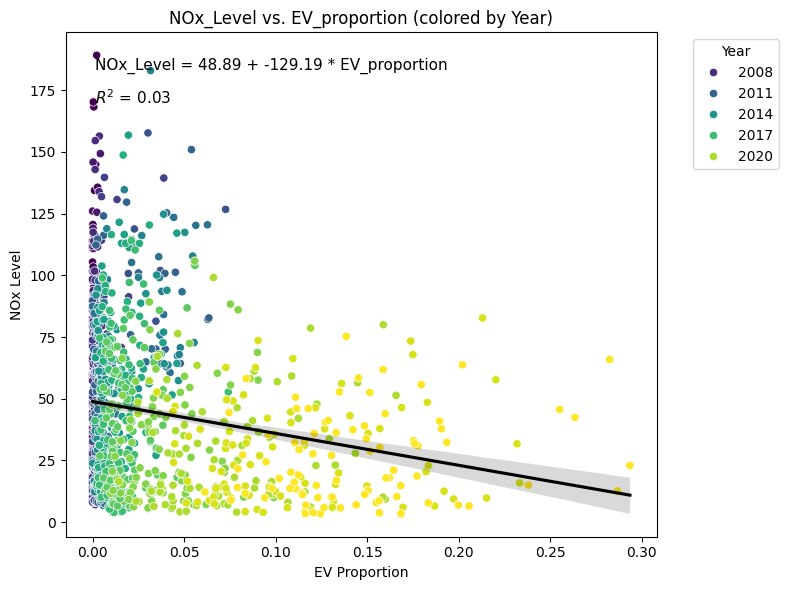

In [ ]:
# Prepare the data
X = NOX_EV_merged['EV_proportion']
y = NOX_EV_merged['NOx_Level']

# Add constant for intercept
X_with_const = sm.add_constant(X)
model = sm.OLS(y, X_with_const).fit()

# Extract regression values
intercept = model.params['const']
slope = model.params['EV_proportion']
r_squared = model.rsquared

# Plot setup
plt.figure(figsize=(8, 6))

# Colored scatterplot by Year
sns.scatterplot(
    data=NOX_EV_merged,
    x='EV_proportion',
    y='NOx_Level',
    hue='Year',
    palette='viridis',
    legend='auto'
)

# Regression line
sns.regplot(
    data=NOX_EV_merged,
    x='EV_proportion',
    y='NOx_Level',
    scatter=False,
    line_kws={"color": "black"}
)

# Annotate equation and R²
equation = f"NOx_Level = {intercept:.2f} + {slope:.2f} * EV_proportion"
r2_text = f"$R^2$ = {r_squared:.2f}"
plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')

# Labels and layout
plt.title('NOx_Level vs. EV_proportion (colored by Year)')
plt.xlabel('EV Proportion')
plt.ylabel('NOx Level')
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

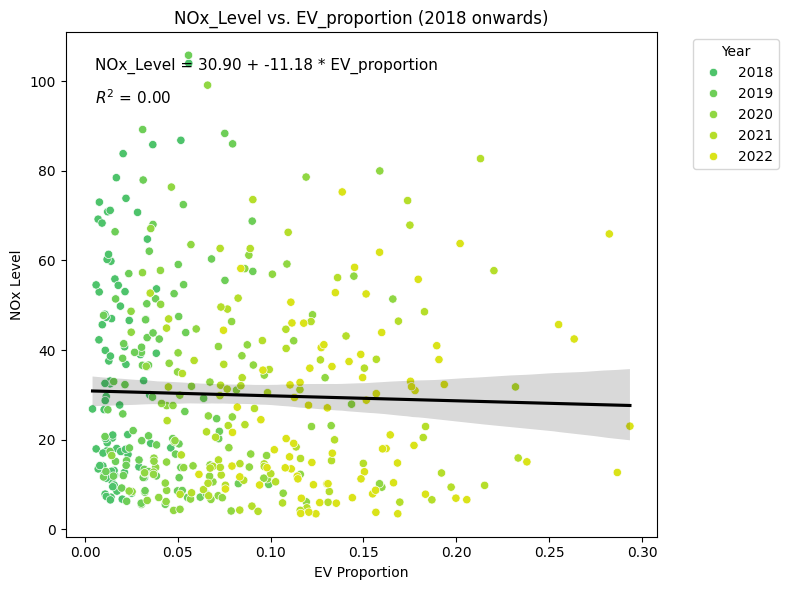

In [ ]:
# Filter data from 2018 onwards
NOX_EV_2018on = NOX_EV_merged[NOX_EV_merged['Year'] >= 2018]

# Prepare the data
X = NOX_EV_2018on['EV_proportion']
y = NOX_EV_2018on['NOx_Level']

# Add constant for intercept
X_with_const = sm.add_constant(X)
model = sm.OLS(y, X_with_const).fit()

# Extract regression values
intercept = model.params['const']
slope = model.params['EV_proportion']
r_squared = model.rsquared

# Set consistent color palette based on all years
all_years_sorted = sorted(NOX_EV_merged['Year'].unique())
year_palette = sns.color_palette('viridis', n_colors=len(all_years_sorted))
year_color_dict = dict(zip(all_years_sorted, year_palette))

# Plot setup
plt.figure(figsize=(8, 6))

# Colored scatterplot by Year with fixed palette
sns.scatterplot(
    data=NOX_EV_2018on,
    x='EV_proportion',
    y='NOx_Level',
    hue='Year',
    palette=year_color_dict,
    legend='auto'
)

# Regression line (no scatter)
sns.regplot(
    data=NOX_EV_2018on,
    x='EV_proportion',
    y='NOx_Level',
    scatter=False,
    line_kws={"color": "black"}
)

# Annotate equation and R²
equation = f"NOx_Level = {intercept:.2f} + {slope:.2f} * EV_proportion"
r2_text = f"$R^2$ = {r_squared:.2f}"
plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')

# Labels and layout
plt.title('NOx_Level vs. EV_proportion (2018 onwards)')
plt.xlabel('EV Proportion')
plt.ylabel('NOx Level')
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

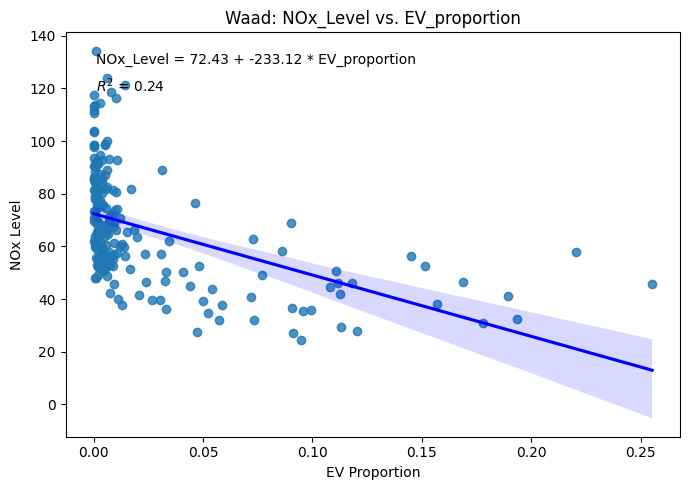

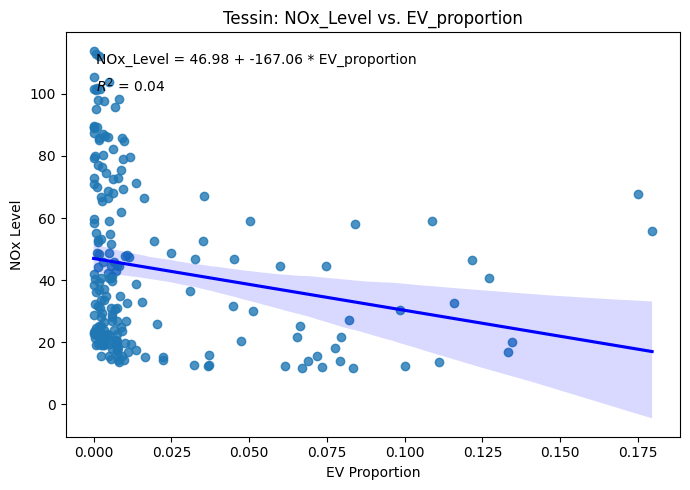

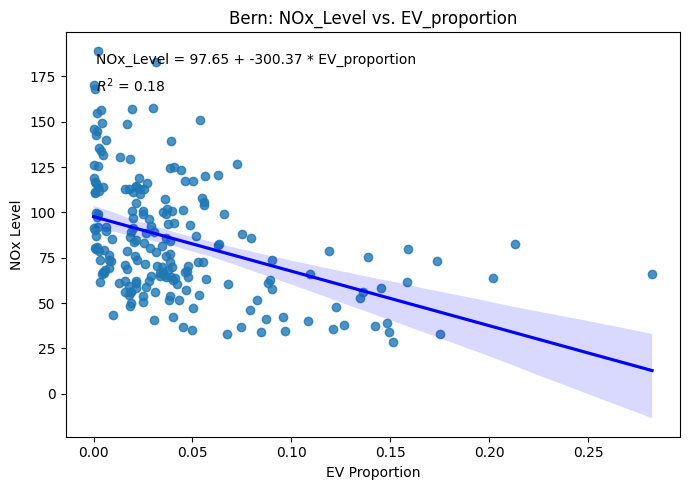

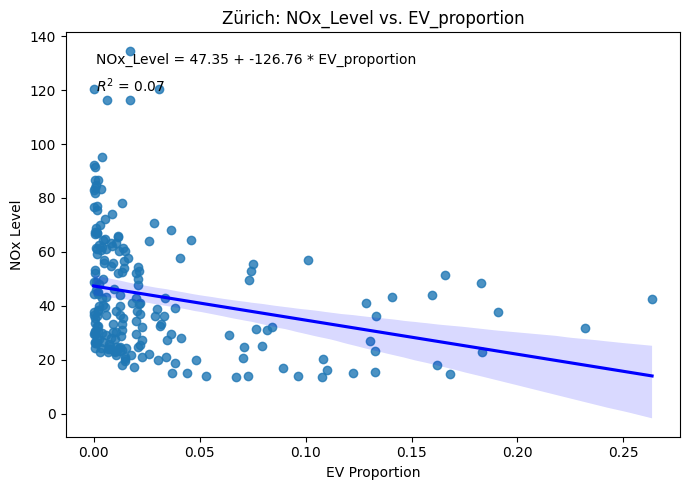

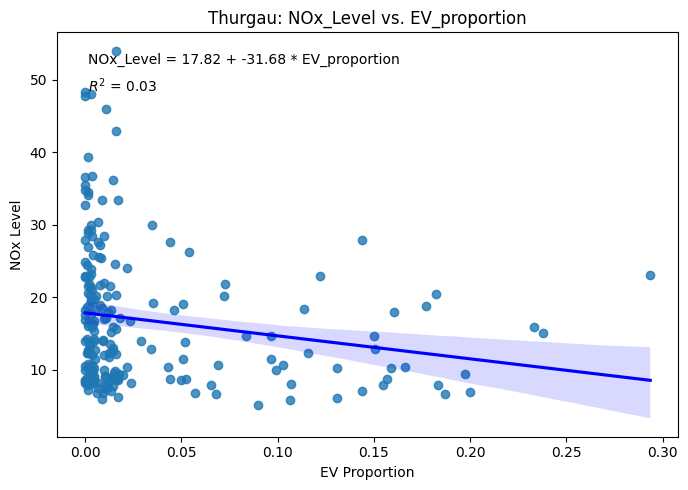

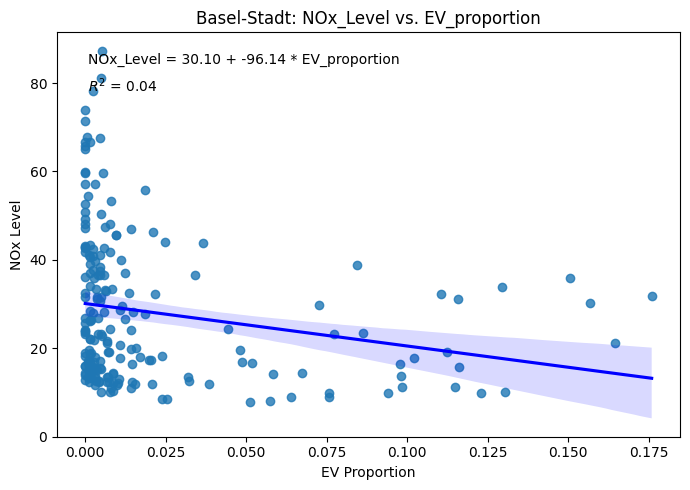

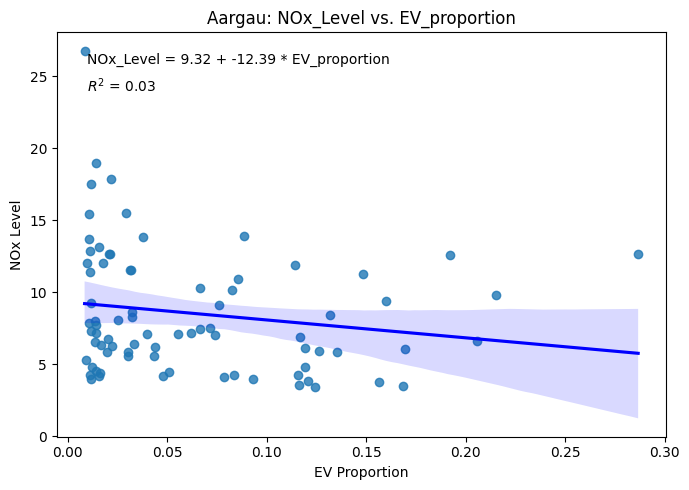

In [ ]:
# Get list of unique cantons
cantons = NOX_EV_merged['Canton'].unique()

# Loop through each canton and plot
for canton in cantons:
    df = NOX_EV_merged[NOX_EV_merged['Canton'] == canton]

    if len(df) < 3:
        continue  # skip small groups

    # Prepare regression
    X = df['EV_proportion']
    y = df['NOx_Level']
    X_with_const = sm.add_constant(X)
    model = sm.OLS(y, X_with_const).fit()

    intercept = model.params['const']
    slope = model.params['EV_proportion']
    r_squared = model.rsquared

    # Plot
    plt.figure(figsize=(7, 5))
    sns.regplot(x='EV_proportion', y='NOx_Level', data=df, line_kws={"color": "blue"})

    # Annotate with regression function and R²
    equation = f"NOx_Level = {intercept:.2f} + {slope:.2f} * EV_proportion"
    r2_text = f"$R^2$ = {r_squared:.2f}"
    plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
    plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

    plt.title(f'{canton}: NOx_Level vs. EV_proportion')
    plt.xlabel('EV Proportion')
    plt.ylabel('NOx Level')
    plt.tight_layout()
    plt.show()

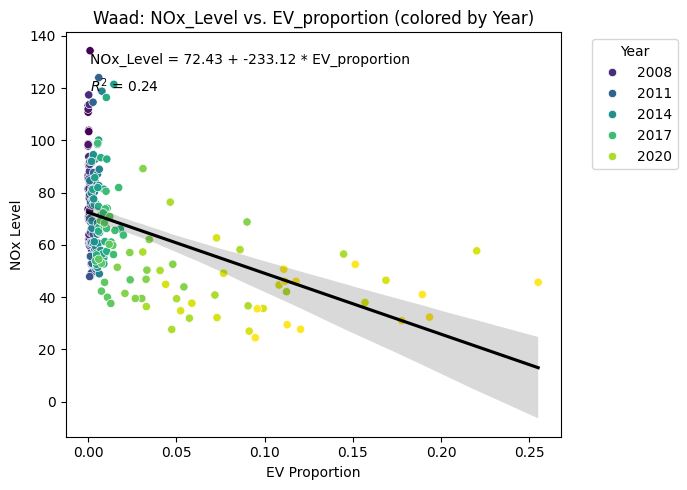

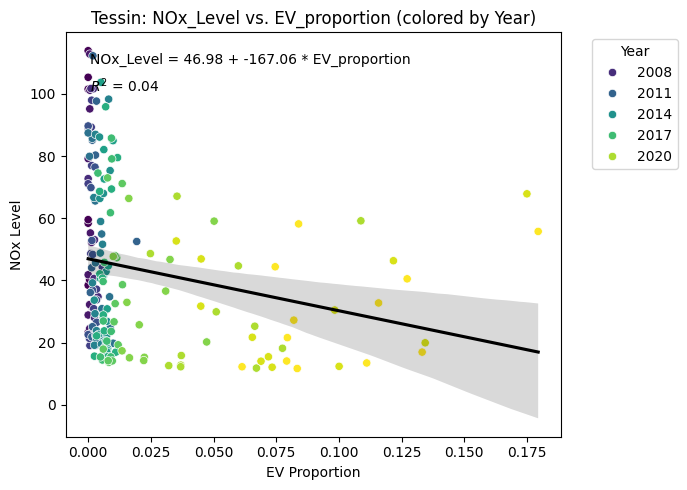

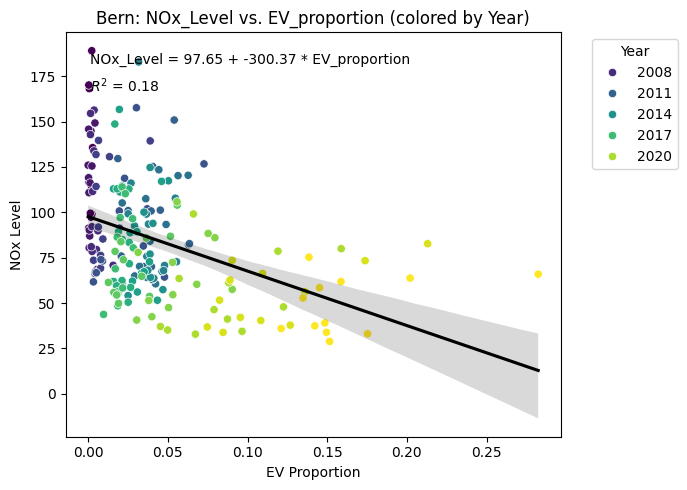

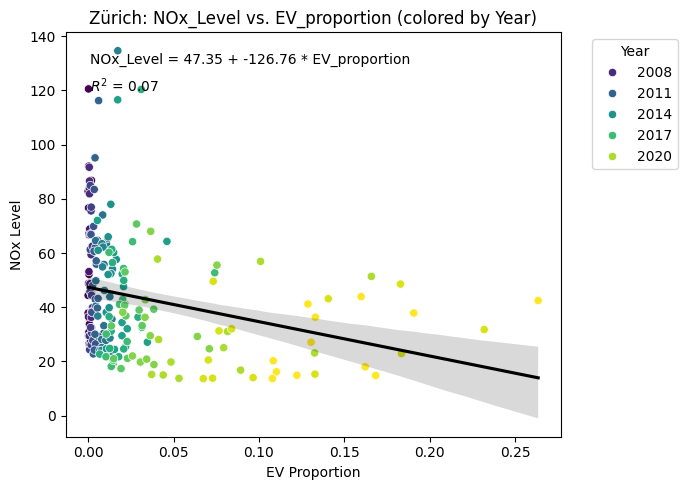

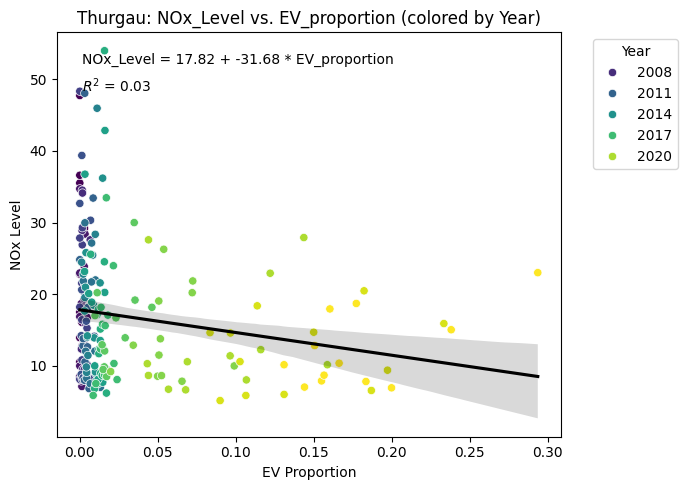

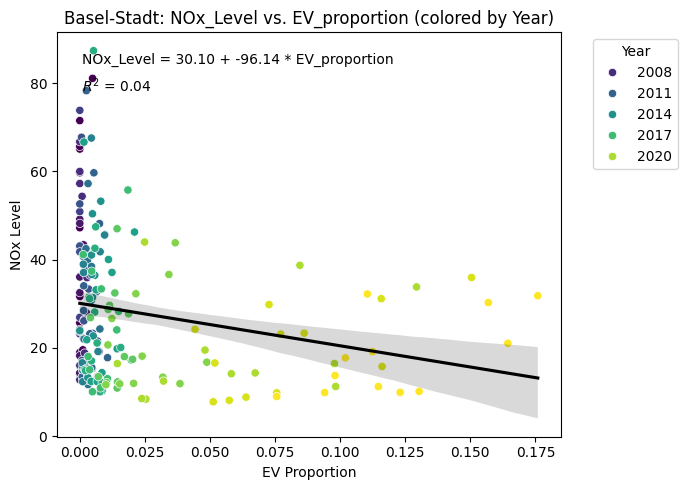

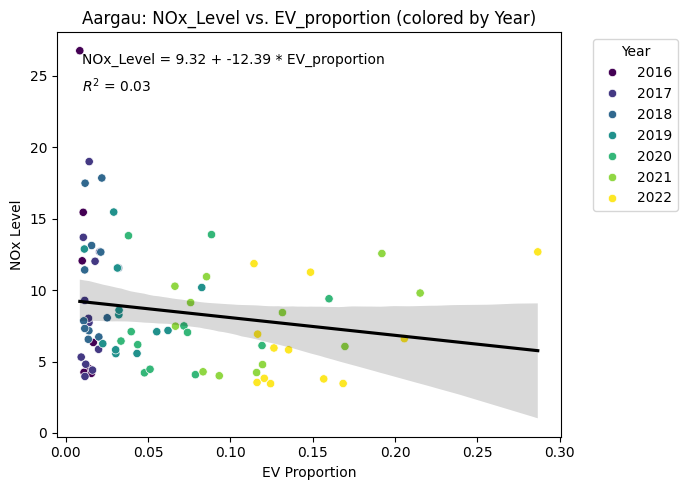

In [ ]:
# Unique cantons
cantons = NOX_EV_merged['Canton'].unique()

# Loop through each canton
for canton in cantons:
    df = NOX_EV_merged[NOX_EV_merged['Canton'] == canton]

    if len(df) < 3:
        continue  # Skip small groups

    # Regression setup
    X = df['EV_proportion']
    y = df['NOx_Level']
    X_with_const = sm.add_constant(X)
    model = sm.OLS(y, X_with_const).fit()

    intercept = model.params['const']
    slope = model.params['EV_proportion']
    r_squared = model.rsquared

    # Plot setup
    plt.figure(figsize=(7, 5))

    # Colored scatterplot by Year
    sns.scatterplot(
        x='EV_proportion',
        y='NOx_Level',
        hue='Year',
        palette='viridis',
        data=df,
        legend='auto'
    )

    # Regression line
    sns.regplot(
        x='EV_proportion',
        y='NOx_Level',
        data=df,
        scatter=False,
        line_kws={"color": "black"}
    )

    # Annotate with regression function and R²
    equation = f"NOx_Level = {intercept:.2f} + {slope:.2f} * EV_proportion"
    r2_text = f"$R^2$ = {r_squared:.2f}"
    plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
    plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

    # Titles and labels
    plt.title(f'{canton}: NOx_Level vs. EV_proportion (colored by Year)')
    plt.xlabel('EV Proportion')
    plt.ylabel('NOx Level')
    plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

In [ ]:
# Prepare the data for regression
X = NOX_EV_merged['EV_proportion']
y = NOX_EV_merged['NOx_Level']

# Add a constant to the independent variable
X = sm.add_constant(X)

# Fit the linear regression model
model = sm.OLS(y, X).fit()

# Print the model summary
print(model.summary())

# Extract R-squared
r_squared = model.rsquared

# Extract coefficients
intercept = model.params['const']
slope = model.params['EV_proportion']

print(f"R-squared: {r_squared}")
print(f"Regression Function: NOx_Level = {intercept} + {slope} * EV_proportion")

# Take-away: Both the constant as well as EV_proportion are statistically significantly different from zero (if p-values < 0.05)

                            OLS Regression Results                            
Dep. Variable:              NOx_Level   R-squared:                       0.034
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     45.99
Date:                Sun, 11 May 2025   Prob (F-statistic):           1.80e-11
Time:                        14:01:20   Log-Likelihood:                -6369.4
No. Observations:                1303   AIC:                         1.274e+04
Df Residuals:                    1301   BIC:                         1.275e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            48.8905      1.061     46.059

In [ ]:
# Loop through each canton
for canton in NOX_EV_merged['Canton'].unique():
    df = NOX_EV_merged[NOX_EV_merged['Canton'] == canton]

    # Skip cantons with too few data points
    if len(df) < 3:
        continue

    # Prepare regression
    X = sm.add_constant(df['EV_proportion'])
    y = df['NOx_Level']

    # Fit model
    model = sm.OLS(y, X).fit()

    # Extract results
    intercept = model.params['const']
    slope = model.params['EV_proportion']
    r_squared = model.rsquared

    # Print results
    print(f"--- {canton} ---")
    print(model.summary())
    print(f"R-squared: {r_squared:.4f}")
    print(f"Regression Function: NOx_Level = {intercept:.4f} + {slope:.4f} * EV_proportion\n")

    #Aarau no stat. significant, probably because it does not have many data points

--- Waad ---
                            OLS Regression Results                            
Dep. Variable:              NOx_Level   R-squared:                       0.236
Model:                            OLS   Adj. R-squared:                  0.232
Method:                 Least Squares   F-statistic:                     62.40
Date:                Sun, 11 May 2025   Prob (F-statistic):           1.77e-13
Time:                        14:01:20   Log-Likelihood:                -887.93
No. Observations:                 204   AIC:                             1780.
Df Residuals:                     202   BIC:                             1786.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            72.4261      1.5

In [ ]:
results = []

# Loop through each canton
for canton in NOX_EV_merged['Canton'].unique():
    df = NOX_EV_merged[NOX_EV_merged['Canton'] == canton]

    if len(df) < 3:
        continue  # skip cantons with insufficient data

    # Regression: NOx_Level ~ EV_proportion
    X = sm.add_constant(df['EV_proportion'])
    y = df['NOx_Level']
    model = sm.OLS(y, X).fit()

    # Store results
    results.append({
        'Canton': canton,
        'Intercept': model.params['const'],
        'Slope (EV_proportion)': model.params['EV_proportion'],
        'R²': model.rsquared,
        'p-value': model.pvalues['EV_proportion'],
        'Observations': int(model.nobs)
    })

# Create a summary DataFrame
regression_results_df = pd.DataFrame(results)

# Sort by R² (optional)
regression_results_df = regression_results_df.sort_values(by='R²', ascending=False)

# Print result
print(regression_results_df.to_string(index=False))

     Canton  Intercept  Slope (EV_proportion)       R²      p-value  Observations
       Waad  72.426127            -233.120608 0.235996 1.771202e-13           204
       Bern  97.648027            -300.368169 0.175932 4.254530e-10           204
     Zürich  47.349922            -126.756433 0.067765 1.697419e-04           204
Basel-Stadt  30.102421             -96.143853 0.042977 2.928325e-03           204
     Tessin  46.975380            -167.064954 0.041676 3.402736e-03           204
    Thurgau  17.824796             -31.684760 0.033589 8.694423e-03           204
     Aargau   9.315336             -12.393602 0.030301 1.249638e-01            79


<ipython-input-119-775d9a8e4244>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Period', y='NOx_Level', data=NOX_EV_merged, palette='coolwarm')


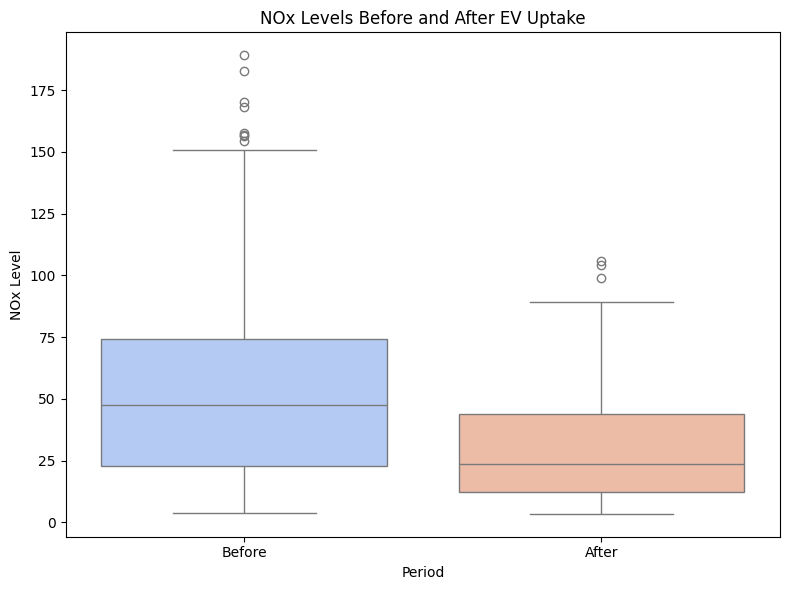

T-statistic: 14.038
P-value: 0.00000
Statistically significant difference in NOx levels before vs. after EV uptake


In [ ]:
# Define cutoff year when EV adoption started rising
cutoff_year = 2018

# Create a new 'Period' column: Before vs. After EV rise
NOX_EV_merged['Period'] = NOX_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# Split data
before = NOX_EV_merged[NOX_EV_merged['Period'] == 'Before']
after = NOX_EV_merged[NOX_EV_merged['Period'] == 'After']

# Visualization: Boxplot of NOx levels before and after EV rise
plt.figure(figsize=(8, 6))
sns.boxplot(x='Period', y='NOx_Level', data=NOX_EV_merged, palette='coolwarm')
plt.title('NOx Levels Before and After EV Uptake')
plt.ylabel('NOx Level')
plt.xlabel('Period')
plt.tight_layout()
plt.show()

# Statistical Test: Independent t-test (Welch's t-test)
t_stat, p_val = ttest_ind(before['NOx_Level'], after['NOx_Level'], equal_var=False)

print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_val:.5f}")

if p_val < 0.05:
    print("Statistically significant difference in NOx levels before vs. after EV uptake")
else:
    print("No statistically significant difference detected")

Welch's t-test results for NOx levels per Canton:
     Canton  N Before  N After  T-Statistic  P-Value  Significant (p<0.05)
       Waad       144       60       12.129  0.00000                  True
     Tessin       144       60        5.139  0.00000                  True
       Bern       144       60       10.162  0.00000                  True
     Zürich       144       60        6.618  0.00000                  True
    Thurgau       144       60        3.955  0.00011                  True
Basel-Stadt       144       60        5.515  0.00000                  True
     Aargau        19       60        0.857  0.40069                 False


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

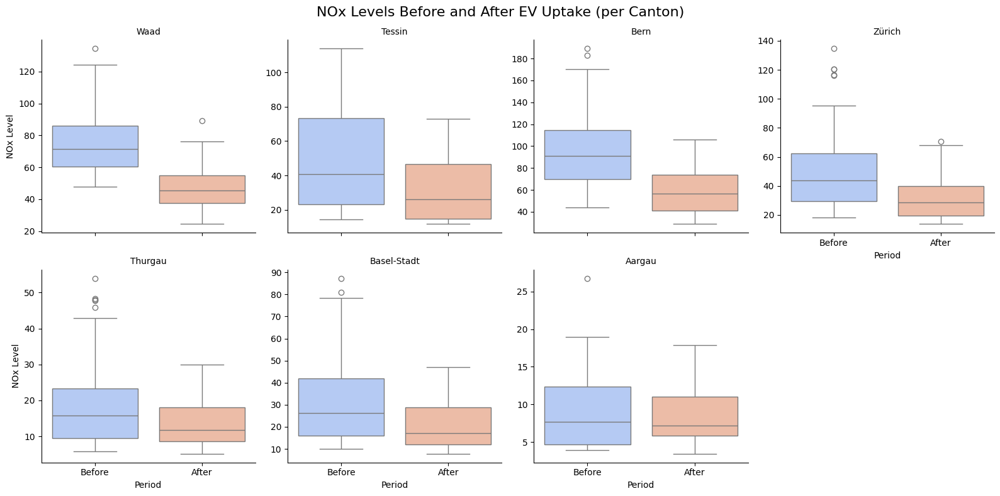

In [ ]:
# Define cutoff year
cutoff_year = 2018

# Create 'Period' column
NOX_EV_merged['Period'] = NOX_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# Prepare results list and filter for valid cantons
results = []
valid_cantons = []

for canton in NOX_EV_merged['Canton'].unique():
    df = NOX_EV_merged[NOX_EV_merged['Canton'] == canton]
    before = df[df['Period'] == 'Before']['NOx_Level']
    after = df[df['Period'] == 'After']['NOx_Level']

    if len(before) >= 3 and len(after) >= 3:
        valid_cantons.append(canton)

        # Welch's t-test
        t_stat, p_val = ttest_ind(before, after, equal_var=False)
        results.append({
            'Canton': canton,
            'N Before': len(before),
            'N After': len(after),
            'T-Statistic': round(t_stat, 3),
            'P-Value': round(p_val, 5),
            'Significant (p<0.05)': p_val < 0.05
        })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Print results
print("Welch's t-test results for NOx levels per Canton:")
print(results_df.to_string(index=False))

# Plot: Faceted boxplots per canton
filtered_df = NOX_EV_merged[NOX_EV_merged['Canton'].isin(valid_cantons)]

g = sns.FacetGrid(filtered_df, col="Canton", col_wrap=4, sharey=False, height=4)
g.map_dataframe(sns.boxplot, x='Period', y='NOx_Level', palette='coolwarm')
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Period", "NOx Level")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("NOx Levels Before and After EV Uptake (per Canton)", fontsize=16)
plt.tight_layout()
plt.show()

<ipython-input-121-518b004691fd>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Period', y='EV_proportion', data=NOX_EV_merged, palette=custom_palette)


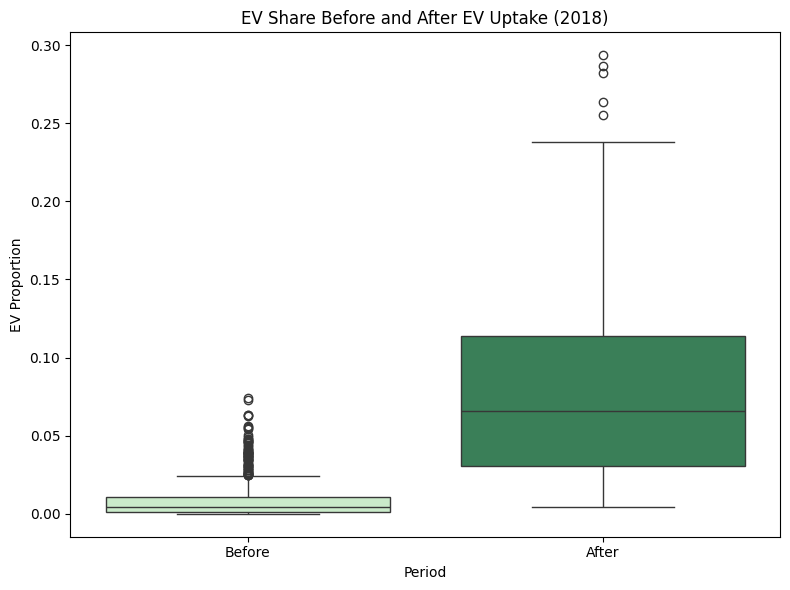

T-statistic: -23.706
P-value: 0.00000
Statistically significant difference in EV share after 2018.


In [ ]:
# Define cutoff year when EV adoption started rising
cutoff_year = 2018

# Create a new 'Period' column: Before vs. After EV rise
NOX_EV_merged['Period'] = NOX_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# Split data
before = NOX_EV_merged[NOX_EV_merged['Period'] == 'Before']
after = NOX_EV_merged[NOX_EV_merged['Period'] == 'After']

# Visualization: Boxplot with custom colors
plt.figure(figsize=(8, 6))
custom_palette = {'Before': '#c4f0c5', 'After': '#2e8b57'}  # light green and dark green
sns.boxplot(x='Period', y='EV_proportion', data=NOX_EV_merged, palette=custom_palette)
plt.title('EV Share Before and After EV Uptake (2018)')
plt.ylabel('EV Proportion')
plt.xlabel('Period')
plt.tight_layout()
plt.show()

# Statistical Test: Independent t-test (Welch's t-test)
t_stat, p_val = ttest_ind(before['EV_proportion'], after['EV_proportion'], equal_var=False)

print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_val:.5f}")

if p_val < 0.05:
    print("Statistically significant difference in EV share after 2018.")
else:
    print("No statistically significant difference detected in EV share.")

Welch's t-test results for EV share before vs. after 2018 (per canton):
     Canton  N Before  N After  T-Statistic  P-Value  Significant (p<0.05)
       Waad       144       60       -8.861      0.0                  True
     Tessin       144       60       -9.075      0.0                  True
       Bern       144       60       -8.974      0.0                  True
     Zürich       144       60       -9.391      0.0                  True
    Thurgau       144       60      -10.495      0.0                  True
Basel-Stadt       144       60       -9.217      0.0                  True
     Aargau        19       60       -8.215      0.0                  True


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

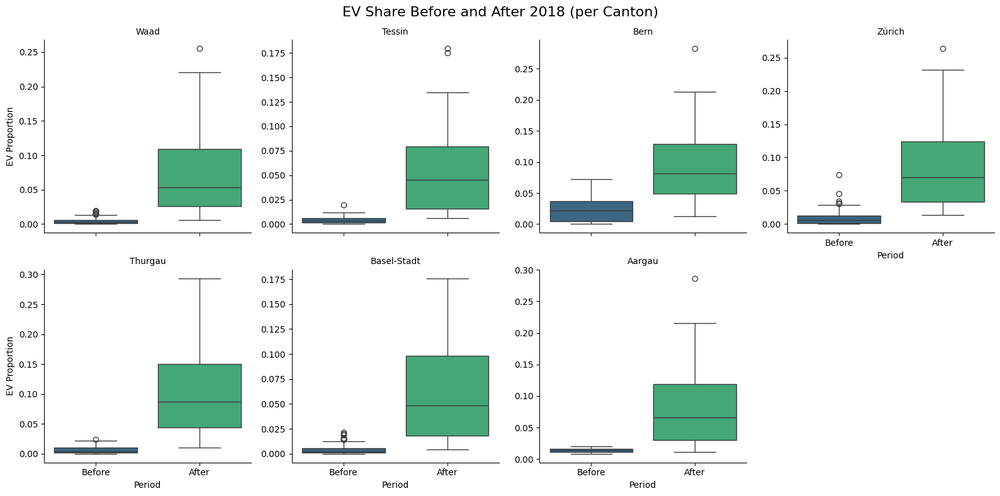

In [ ]:
# Define cutoff year
cutoff_year = 2018

# Create 'Period' column
NOX_EV_merged['Period'] = NOX_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# Prepare results list and filter for valid cantons
results = []
valid_cantons = []

for canton in NOX_EV_merged['Canton'].unique():
    df = NOX_EV_merged[NOX_EV_merged['Canton'] == canton]
    before = df[df['Period'] == 'Before']['EV_proportion']
    after = df[df['Period'] == 'After']['EV_proportion']

    if len(before) >= 3 and len(after) >= 3:
        # Add to valid list for plotting
        valid_cantons.append(canton)

        # Welch's t-test
        t_stat, p_val = ttest_ind(before, after, equal_var=False)
        results.append({
            'Canton': canton,
            'N Before': len(before),
            'N After': len(after),
            'T-Statistic': round(t_stat, 3),
            'P-Value': round(p_val, 5),
            'Significant (p<0.05)': p_val < 0.05
        })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Print results
print("Welch's t-test results for EV share before vs. after 2018 (per canton):")
print(results_df.to_string(index=False))

# Plot: Faceted boxplots per canton
filtered_df = NOX_EV_merged[NOX_EV_merged['Canton'].isin(valid_cantons)]

g = sns.FacetGrid(filtered_df, col="Canton", col_wrap=4, sharey=False, height=4)
g.map_dataframe(sns.boxplot, x='Period', y='EV_proportion', palette='viridis')
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Period", "EV Proportion")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("EV Share Before and After 2018 (per Canton)", fontsize=16)
plt.tight_layout()
plt.show()

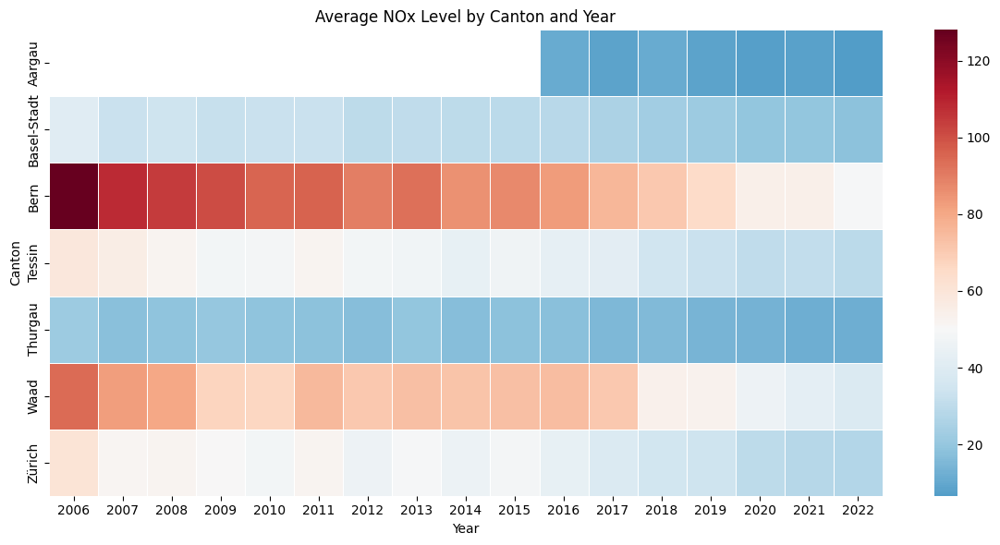

In [ ]:
# Pivot: average NOx_Level per canton and year
pivot_table = NOX_EV_merged.pivot_table(
    index='Canton',
    columns='Year',
    values='NOx_Level',
    aggfunc='mean'
)

# Set a central value appropriate for NOx scale (adjust center if needed)
center_value = 50  # You can change this depending on your NOx_Level scale

# Plot heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(
    pivot_table,
    cmap='RdBu_r',
    annot=False,
    linewidths=0.5,
    center=center_value  # central value for diverging color map
)

plt.title('Average NOx Level by Canton and Year')
plt.xlabel('Year')
plt.ylabel('Canton')
plt.tight_layout()
plt.show()

#Comparison to CO: Bern and Waad again relatively high emission levels in early years

<ipython-input-124-04f33e24bc02>:41: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


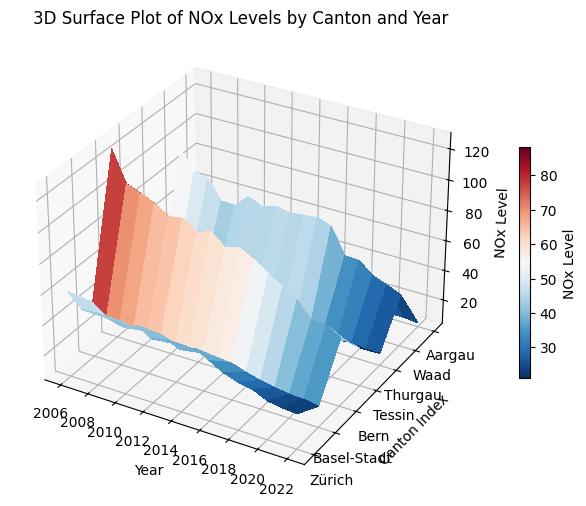

In [ ]:
# Pivot and reverse canton order (move Zürich to bottom, Aargau to top)
z_data = NOX_EV_merged.pivot_table(
    index='Canton',
    columns='Year',
    values='NOx_Level',
    aggfunc='mean'
)

# Reorder index: put Zürich last, Aargau first
canton_order = list(z_data.index)
if 'Aargau' in canton_order and 'Zürich' in canton_order:
    canton_order.remove('Aargau')
    canton_order.remove('Zürich')
    canton_order = ['Zürich'] + canton_order + ['Aargau']
    z_data = z_data.loc[canton_order]

# Create meshgrid
X, Y = np.meshgrid(z_data.columns, range(len(z_data.index)))
Z = z_data.values

# Plot
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_surface(
    X, Y, Z,
    cmap='RdBu_r',
    linewidth=0,
    antialiased=False
)

# Customize axes
ax.set_title('3D Surface Plot of NOx Levels by Canton and Year')
ax.set_xlabel('Year')
ax.set_ylabel('Canton Index')
ax.set_zlabel('NOx Level')
ax.set_yticks(range(len(z_data.index)))
ax.set_yticklabels(z_data.index)

fig.colorbar(surf, ax=ax, shrink=0.5, label='NOx Level')
plt.tight_layout()
plt.show()

<ipython-input-125-17da19a6e3e0>:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


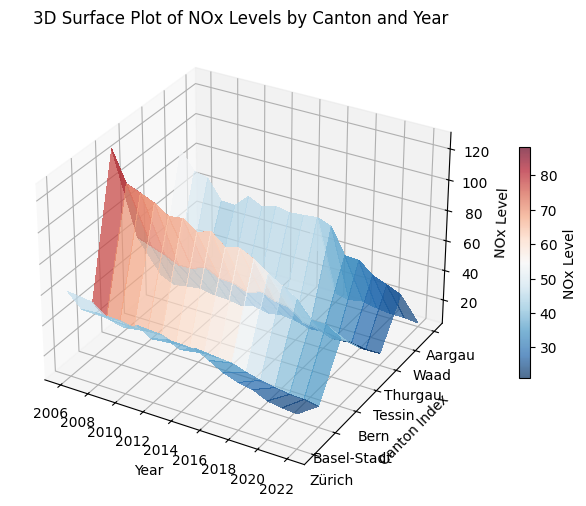

In [ ]:
# Pivot and reverse canton order (move Zürich to bottom, Aargau to top)
z_data = NOX_EV_merged.pivot_table(
    index='Canton',
    columns='Year',
    values='NOx_Level',
    aggfunc='mean'
)

# Reorder index: put Zürich last, Aargau first
canton_order = list(z_data.index)
if 'Aargau' in canton_order and 'Zürich' in canton_order:
    canton_order.remove('Aargau')
    canton_order.remove('Zürich')
    canton_order = ['Zürich'] + canton_order + ['Aargau']
    z_data = z_data.loc[canton_order]

# Create meshgrid
X, Y = np.meshgrid(z_data.columns, range(len(z_data.index)))
Z = z_data.values

# Plot
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')

# Add transparency using alpha
surf = ax.plot_surface(
    X, Y, Z,
    cmap='RdBu_r',
    linewidth=0,
    antialiased=False,
    alpha=0.7  # <- transparency set here
)

# Customize axes
ax.set_title('3D Surface Plot of NOx Levels by Canton and Year')
ax.set_xlabel('Year')
ax.set_ylabel('Canton Index')
ax.set_zlabel('NOx Level')
ax.set_yticks(range(len(z_data.index)))
ax.set_yticklabels(z_data.index)

fig.colorbar(surf, ax=ax, shrink=0.5, label='NOx Level')
plt.tight_layout()
plt.show()

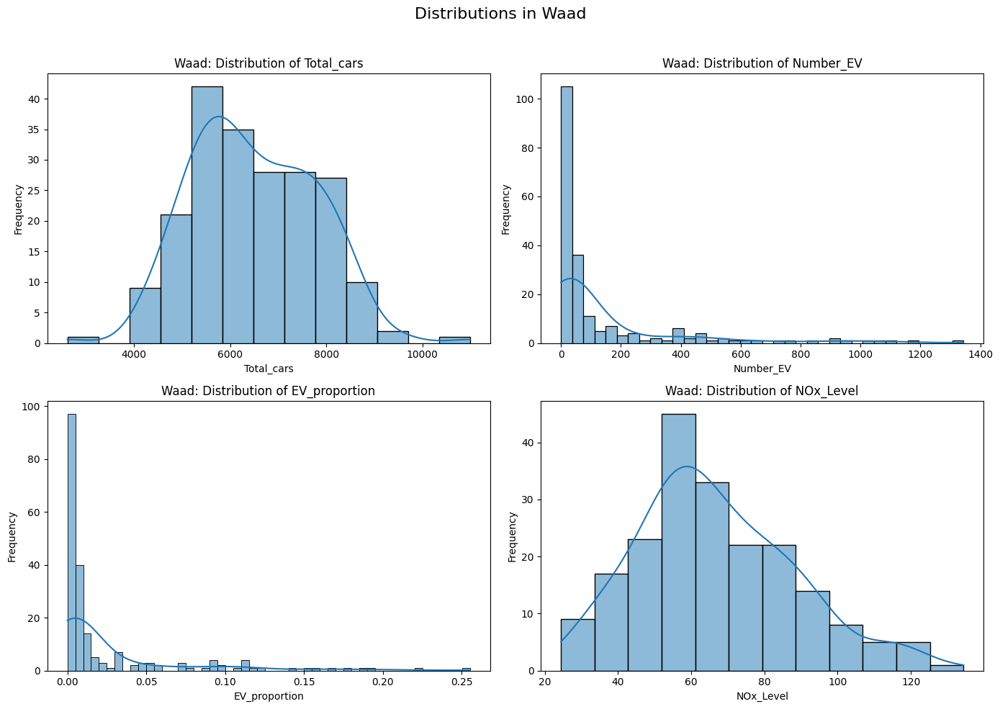

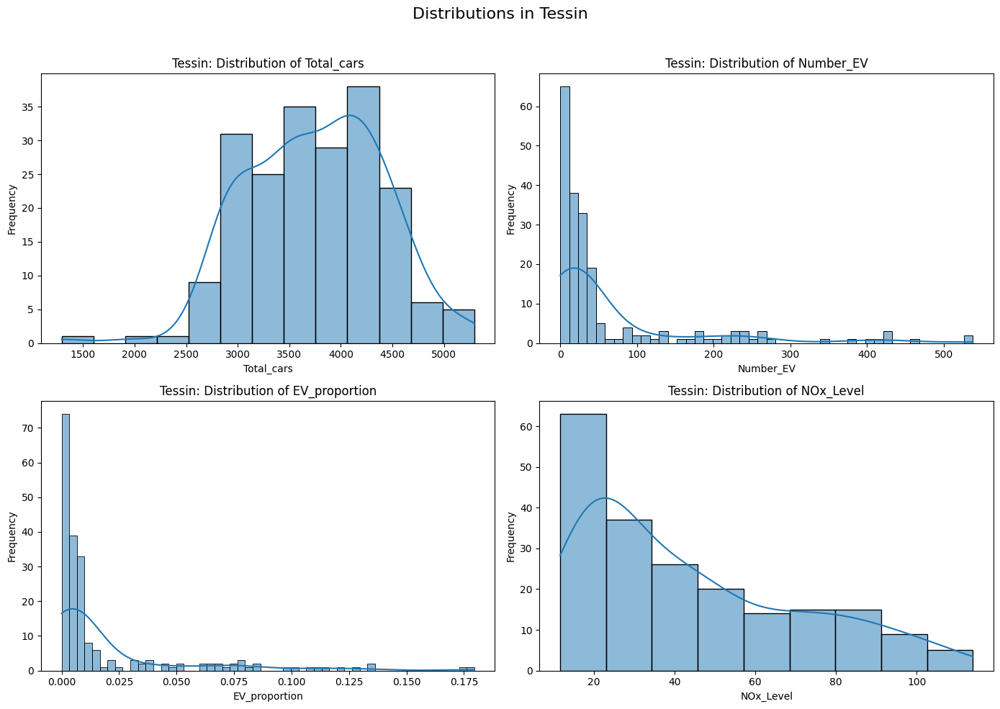

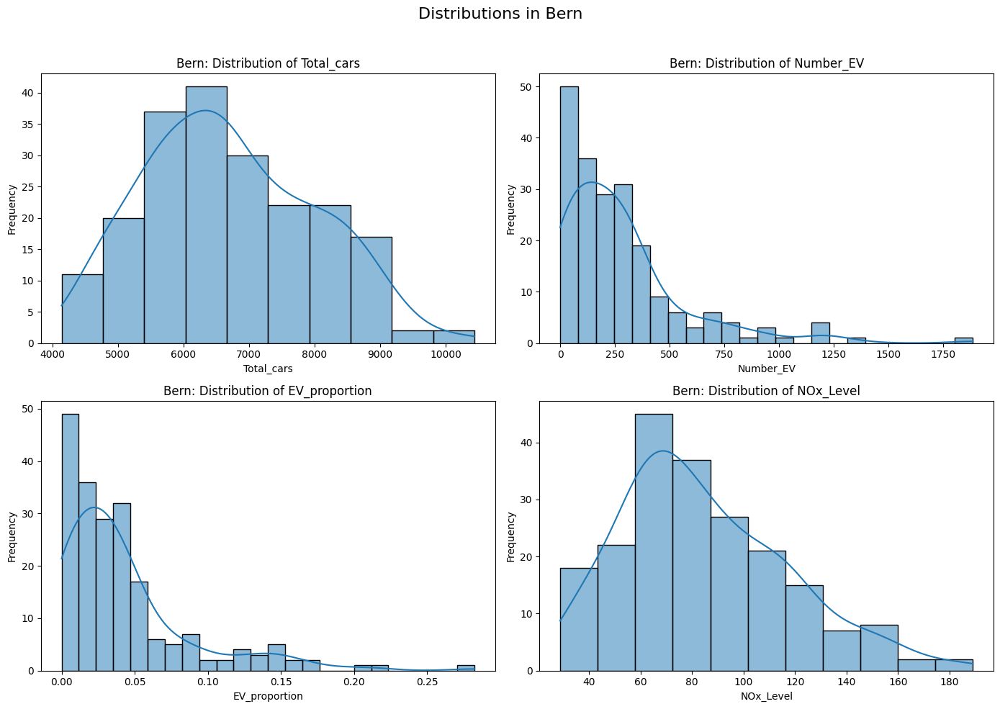

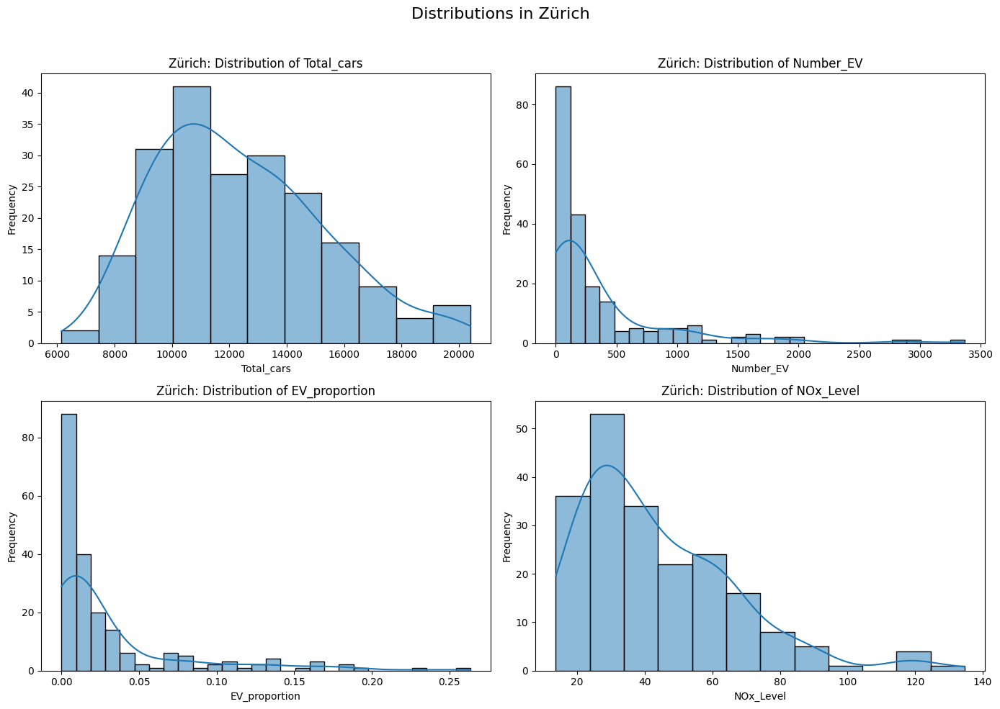

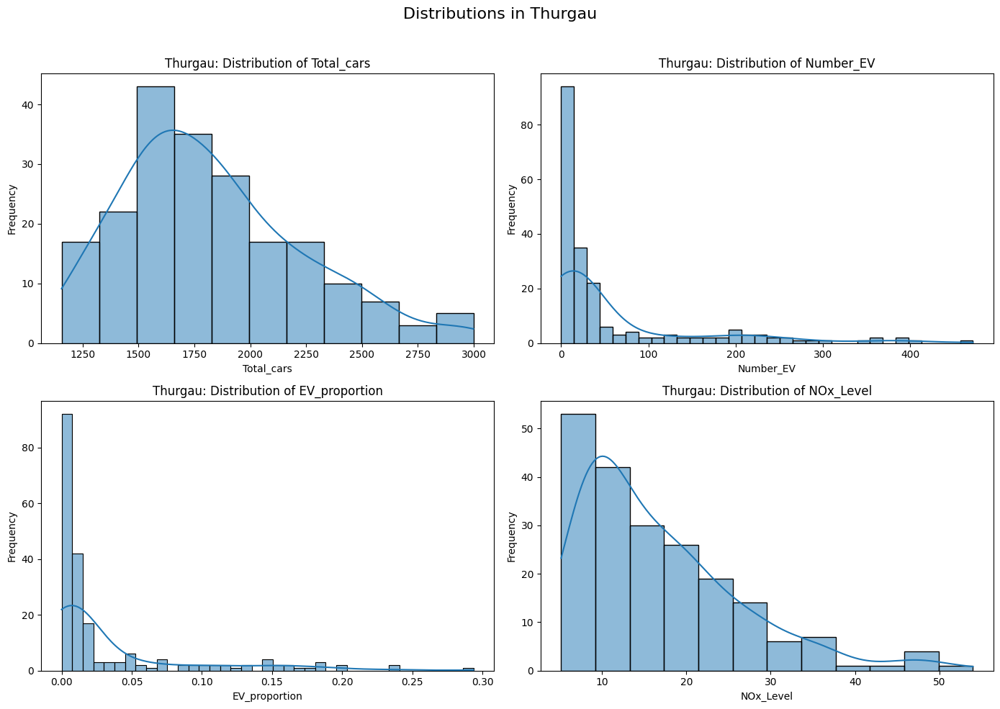

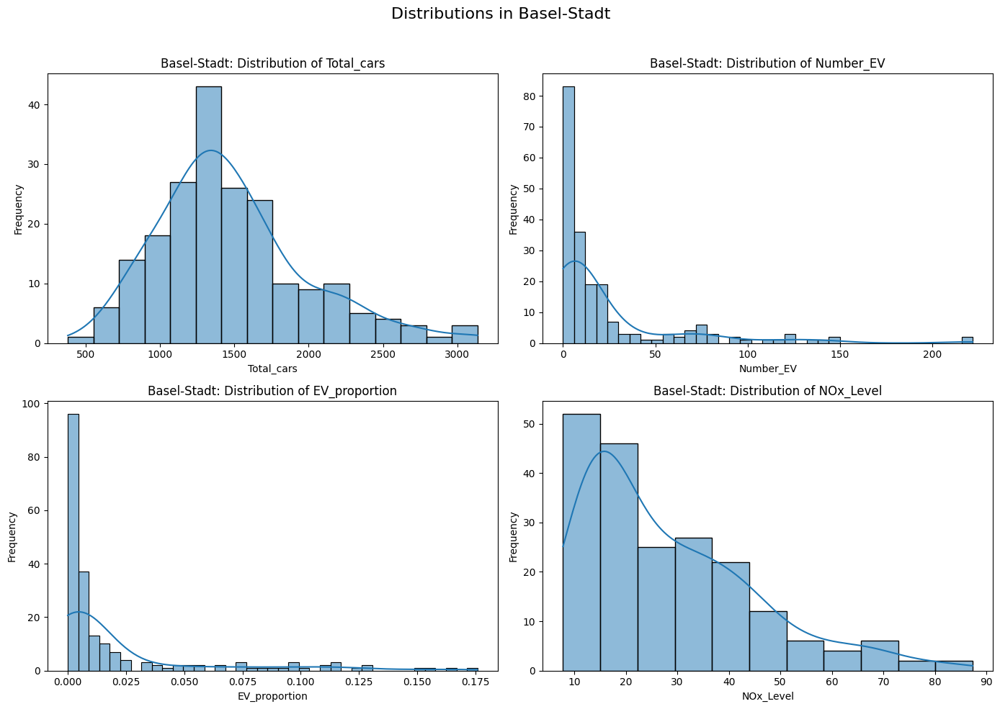

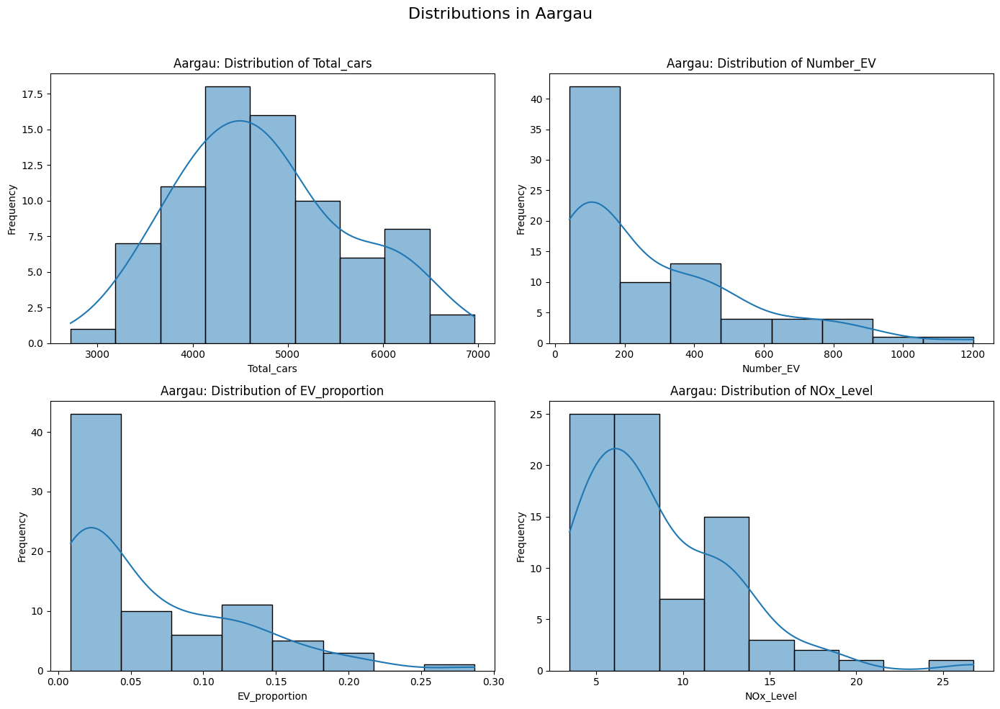

In [ ]:
# Columns to plot
cols_to_plot = ['Total_cars', 'Number_EV', 'EV_proportion', 'NOx_Level']

# Loop through each canton
for canton in NOX_EV_merged['Canton'].unique():
    df = NOX_EV_merged[NOX_EV_merged['Canton'] == canton]

    # Skip if too few data points
    if df.shape[0] < 3:
        continue

    # Create 2x2 subplots
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    for i, col in enumerate(cols_to_plot):
        sns.histplot(df[col], kde=True, ax=axes[i])
        axes[i].set_title(f'{canton}: Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    plt.suptitle(f'Distributions in {canton}', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

<ipython-input-127-481f34bce712>:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-127-481f34bce712>:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-127-481f34bce712>:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-127-481f34bce712>:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a 

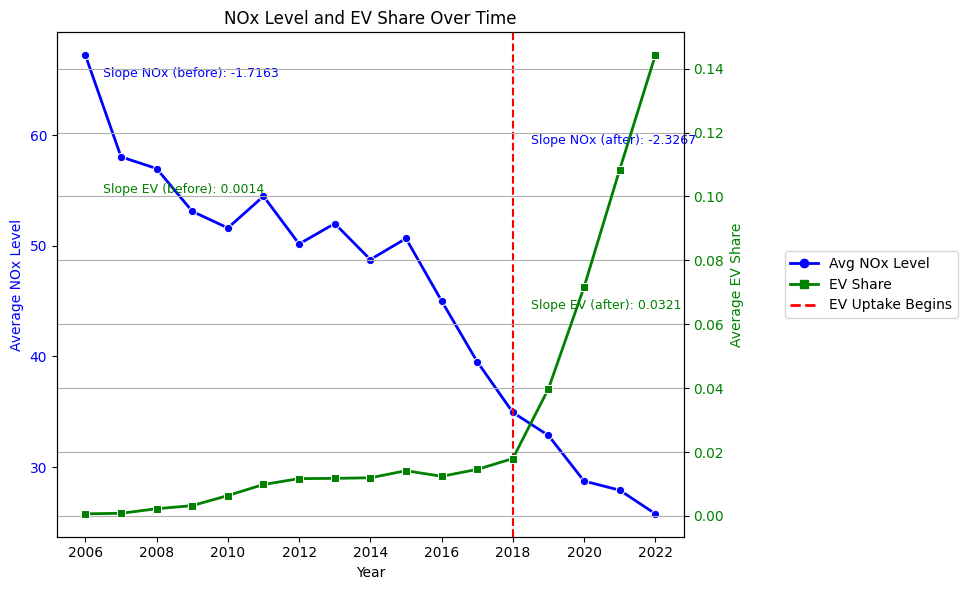

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from matplotlib.lines import Line2D

# Compute yearly averages for NOx level and EV proportion
yearly_avg = NOX_EV_merged.groupby('Year')[['NOx_Level', 'EV_proportion']].mean().reset_index()

# Split into before/after 2018
before = yearly_avg[yearly_avg['Year'] < 2018]
after = yearly_avg[yearly_avg['Year'] >= 2018]

# Function to calculate slope from linear regression
def compute_slope(df, x_col, y_col):
    X = sm.add_constant(df[x_col])
    y = df[y_col]
    model = sm.OLS(y, X).fit()
    return model.params[1]

# Compute slopes
slope_NOx_before = compute_slope(before, 'Year', 'NOx_Level')
slope_NOx_after = compute_slope(after, 'Year', 'NOx_Level')
slope_EV_before = compute_slope(before, 'Year', 'EV_proportion')
slope_EV_after = compute_slope(after, 'Year', 'EV_proportion')

# Plot setup
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot NOx levels
sns.lineplot(data=yearly_avg, x='Year', y='NOx_Level', ax=ax1,
             marker='o', color='blue', linewidth=2)
ax1.set_ylabel('Average NOx Level', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Add vertical line for 2018
ax1.axvline(x=2018, color='red', linestyle='--')

# Plot EV share on second y-axis
ax2 = ax1.twinx()
sns.lineplot(data=yearly_avg, x='Year', y='EV_proportion', ax=ax2,
             marker='s', color='green', linewidth=2)
ax2.set_ylabel('Average EV Share', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Annotate slopes
ax1.text(2006.5, yearly_avg['NOx_Level'].max() - 2,
         f"Slope NOx (before): {slope_NOx_before:.4f}", color='blue', fontsize=9)
ax1.text(2018.5, yearly_avg['NOx_Level'].max() - 8,
         f"Slope NOx (after): {slope_NOx_after:.4f}", color='blue', fontsize=9)
ax2.text(2006.5, yearly_avg['EV_proportion'].max() * 0.7,
         f"Slope EV (before): {slope_EV_before:.4f}", color='green', fontsize=9)
ax2.text(2018.5, yearly_avg['EV_proportion'].max() * 0.45,
         f"Slope EV (after): {slope_EV_after:.4f}", color='green', fontsize=9)

# Custom legend elements
legend_elements = [
    Line2D([0], [0], color='blue', lw=2, marker='o', label='Avg NOx Level'),
    Line2D([0], [0], color='green', lw=2, marker='s', label='EV Share'),
    Line2D([0], [0], color='red', lw=2, linestyle='--', label='EV Uptake Begins')
]

# Add combined legend to the right of the plot
ax1.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.15, 0.5), frameon=True)

# Formatting
plt.title('NOx Level and EV Share Over Time')
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futu

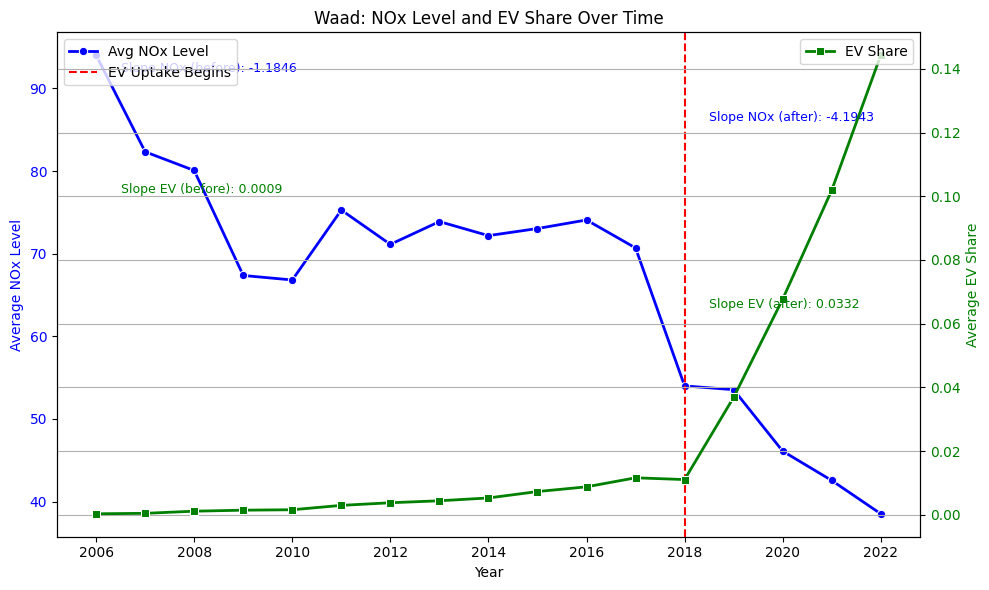

<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futu

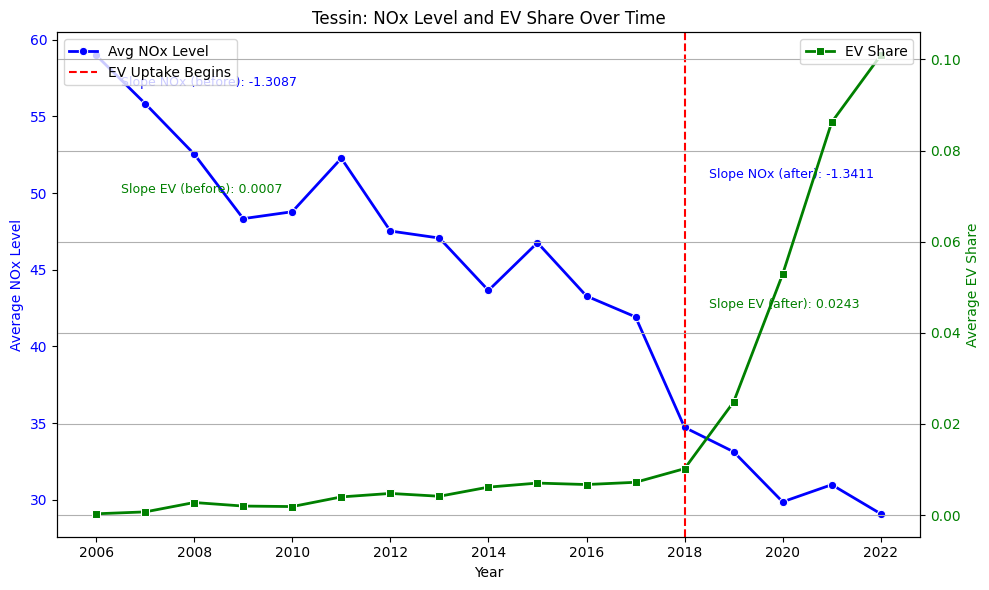

<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futu

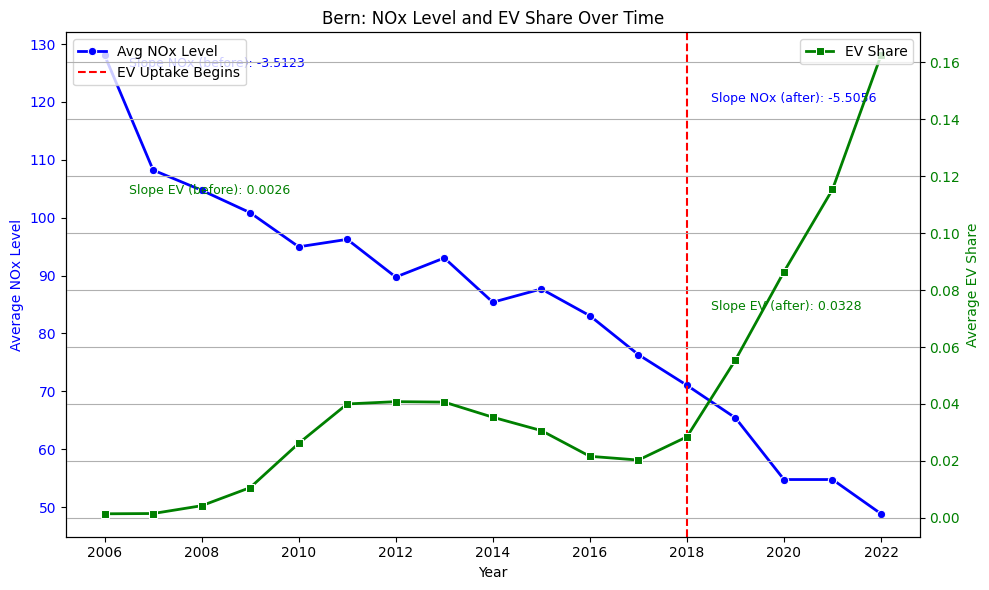

<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futu

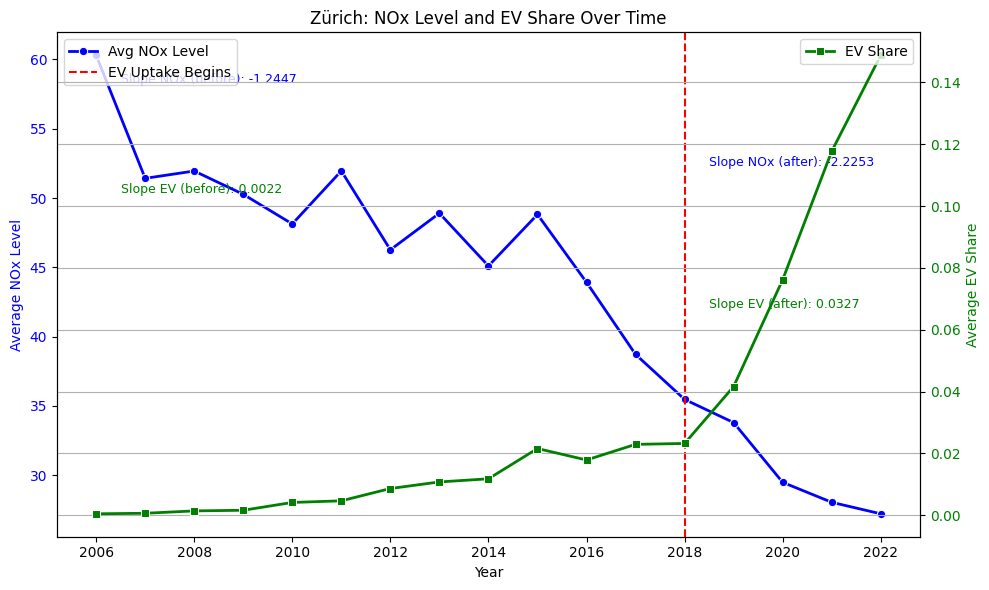

<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futu

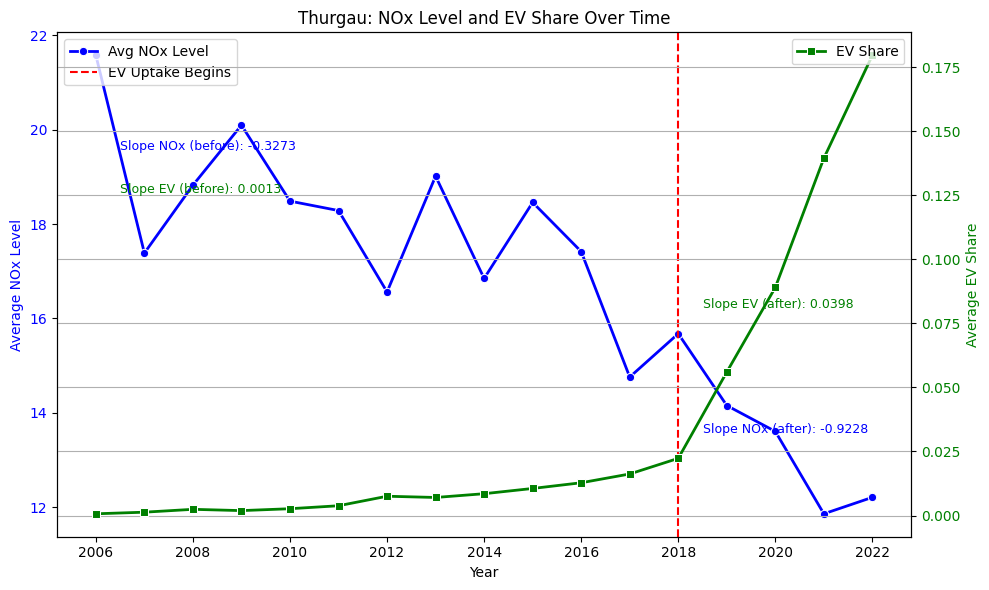

<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futu

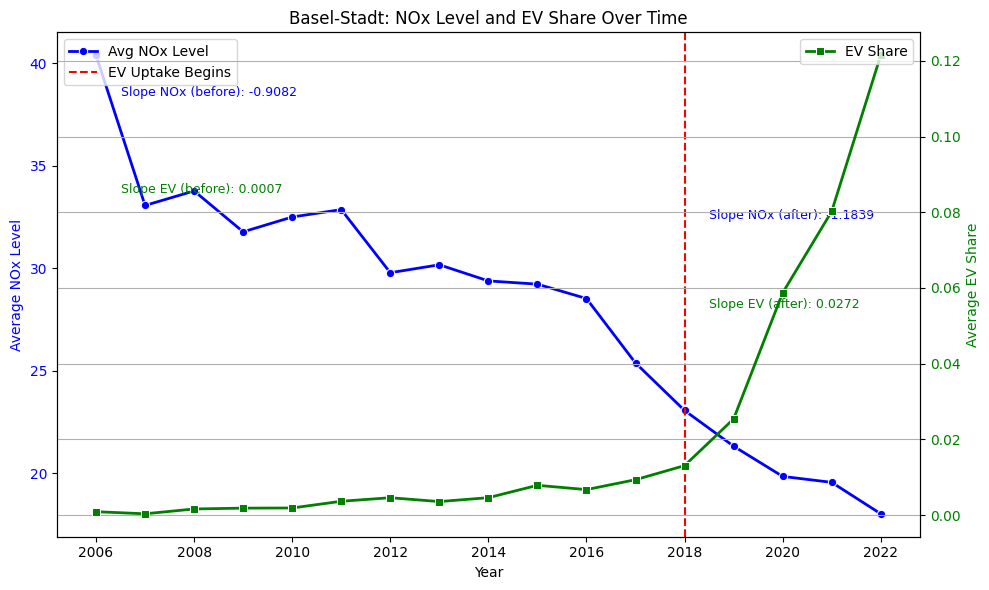

<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return model.params[1]
<ipython-input-128-c121043774c0>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a futu

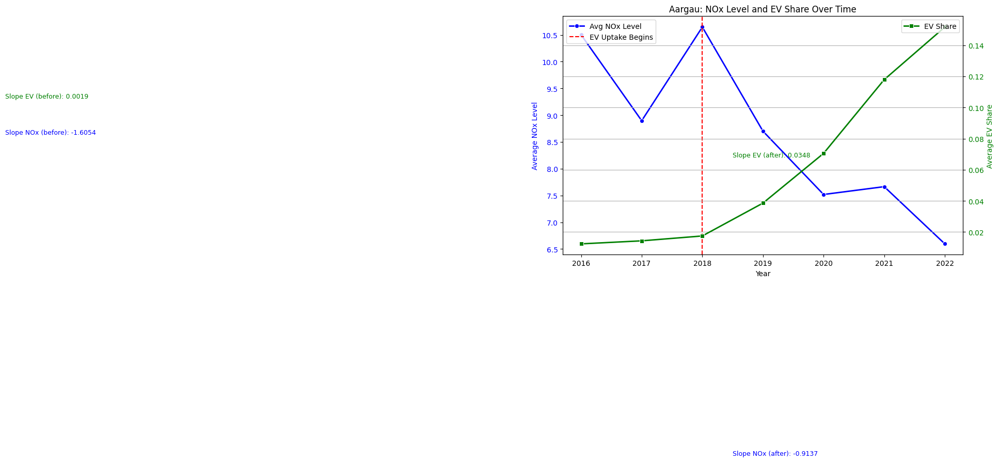

In [ ]:
# Function to calculate slope from linear regression
def compute_slope(df, x_col, y_col):
    X = sm.add_constant(df[x_col])
    y = df[y_col]
    model = sm.OLS(y, X).fit()
    return model.params[1]

# Loop through cantons
for canton in NOX_EV_merged['Canton'].unique():
    df = NOX_EV_merged[NOX_EV_merged['Canton'] == canton]

    # Group by year and compute mean values
    yearly_avg = df.groupby('Year')[['NOx_Level', 'EV_proportion']].mean().reset_index()

    # Skip if too few years
    if yearly_avg.shape[0] < 4:
        continue

    # Split into before/after 2018
    before = yearly_avg[yearly_avg['Year'] < 2018]
    after = yearly_avg[yearly_avg['Year'] >= 2018]

    # Compute slopes
    slope_NOx_before = compute_slope(before, 'Year', 'NOx_Level')
    slope_NOx_after = compute_slope(after, 'Year', 'NOx_Level')
    slope_EV_before = compute_slope(before, 'Year', 'EV_proportion')
    slope_EV_after = compute_slope(after, 'Year', 'EV_proportion')

    # Plot setup
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot NOx levels
    sns.lineplot(data=yearly_avg, x='Year', y='NOx_Level', ax=ax1,
                 marker='o', color='blue', label='Avg NOx Level', linewidth=2)
    ax1.set_ylabel('Average NOx Level', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')

    # Add vertical line for 2018
    ax1.axvline(x=2018, color='red', linestyle='--', label='EV Uptake Begins')
    ax1.legend(loc='upper left')

    # Plot EV share on second y-axis
    ax2 = ax1.twinx()
    sns.lineplot(data=yearly_avg, x='Year', y='EV_proportion', ax=ax2,
                 marker='s', color='green', label='EV Share', linewidth=2)
    ax2.set_ylabel('Average EV Share', color='green')
    ax2.tick_params(axis='y', labelcolor='green')
    ax2.legend(loc='upper right')

    # Annotate slopes
    ax1.text(2006.5, yearly_avg['NOx_Level'].max() - 2,
             f"Slope NOx (before): {slope_NOx_before:.4f}", color='blue', fontsize=9)
    ax1.text(2018.5, yearly_avg['NOx_Level'].max() - 8,
             f"Slope NOx (after): {slope_NOx_after:.4f}", color='blue', fontsize=9)
    ax2.text(2006.5, yearly_avg['EV_proportion'].max() * 0.7,
             f"Slope EV (before): {slope_EV_before:.4f}", color='green', fontsize=9)
    ax2.text(2018.5, yearly_avg['EV_proportion'].max() * 0.45,
             f"Slope EV (after): {slope_EV_after:.4f}", color='green', fontsize=9)

    # Final formatting
    plt.title(f'{canton}: NOx Level and EV Share Over Time')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    #Some cantons do show some element of stronger decrease in air pollution after 2018, but not all. However, this evidence cannot be interpreted causally at this point.

### Alternative way to display the results - CO and non-EV share

In [ ]:
CO_EV_merged.head(5)

,Canton,Year,Month,Total_cars,Number_EV,EV_proportion,Location,CO_Level,EV_proportion_change,CO_Level_change,Period
26,Waad,2006,12,5960,2,0.000336,Lausanne-César-Roux,0.671613,-0.689150,-0.157324,Before
33,Waad,2006,11,5558,6,0.001080,Lausanne-César-Roux,0.797000,1.975171,0.199951,Before
34,Waad,2006,10,5512,2,0.000363,Lausanne-César-Roux,0.664194,inf,0.113796,Before
35,Waad,2006,9,5392,0,0.000000,Lausanne-César-Roux,0.596333,-1.000000,0.300938,Before
47,Zürich,2006,9,8414,4,0.000475,Zürich-Kaserne,0.373667,0.059187,0.504372,Before


In [ ]:
# Add a new column for non-EV proportion
CO_EV_merged['non_EV_proportion'] = 1 - CO_EV_merged['EV_proportion']
cols = list(CO_EV_merged.columns)

# Move EV_proportion and non_EV_proportion to come right after Number_EV
ev_index = cols.index('EV_proportion')
non_ev_index = cols.index('non_EV_proportion')

# Remove and reinsert them in desired order
cols.remove('EV_proportion')
cols.remove('non_EV_proportion')
insert_after = cols.index('Number_EV') + 1
cols = cols[:insert_after] + ['EV_proportion', 'non_EV_proportion'] + cols[insert_after:]

# Apply new column order
CO_EV_merged = CO_EV_merged[cols]
CO_EV_merged.head(5)

,Canton,Year,Month,Total_cars,Number_EV,EV_proportion,non_EV_proportion,Location,CO_Level,EV_proportion_change,CO_Level_change,Period
26,Waad,2006,12,5960,2,0.000336,0.999664,Lausanne-César-Roux,0.671613,-0.689150,-0.157324,Before
33,Waad,2006,11,5558,6,0.001080,0.998920,Lausanne-César-Roux,0.797000,1.975171,0.199951,Before
34,Waad,2006,10,5512,2,0.000363,0.999637,Lausanne-César-Roux,0.664194,inf,0.113796,Before
35,Waad,2006,9,5392,0,0.000000,1.000000,Lausanne-César-Roux,0.596333,-1.000000,0.300938,Before
47,Zürich,2006,9,8414,4,0.000475,0.999525,Zürich-Kaserne,0.373667,0.059187,0.504372,Before


In [ ]:
# Calculate number of non-EVs
CO_EV_merged['Number_non_EV'] = CO_EV_merged['Total_cars'] - CO_EV_merged['Number_EV']

<ipython-input-131-10537eef8a94>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CO_EV_merged['Number_non_EV'] = CO_EV_merged['Total_cars'] - CO_EV_merged['Number_EV']


In [ ]:
CO_EV_merged.head(5)

,Canton,Year,Month,Total_cars,Number_EV,EV_proportion,non_EV_proportion,Location,CO_Level,EV_proportion_change,CO_Level_change,Period,Number_non_EV
26,Waad,2006,12,5960,2,0.000336,0.999664,Lausanne-César-Roux,0.671613,-0.689150,-0.157324,Before,5958
33,Waad,2006,11,5558,6,0.001080,0.998920,Lausanne-César-Roux,0.797000,1.975171,0.199951,Before,5552
34,Waad,2006,10,5512,2,0.000363,0.999637,Lausanne-César-Roux,0.664194,inf,0.113796,Before,5510
35,Waad,2006,9,5392,0,0.000000,1.000000,Lausanne-César-Roux,0.596333,-1.000000,0.300938,Before,5392
47,Zürich,2006,9,8414,4,0.000475,0.999525,Zürich-Kaserne,0.373667,0.059187,0.504372,Before,8410


<ipython-input-133-f492688e63b2>:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=CO_EV_merged[time_col], y=CO_EV_merged[col], ax=axes[i], ci=None)
<ipython-input-133-f492688e63b2>:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=CO_EV_merged[time_col], y=CO_EV_merged[col], ax=axes[i], ci=None)
<ipython-input-133-f492688e63b2>:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=CO_EV_merged[time_col], y=CO_EV_merged[col], ax=axes[i], ci=None)
<ipython-input-133-f492688e63b2>:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=CO_EV_merged[time_col], y=CO_EV_merged[col], ax=axes[i], ci=None)


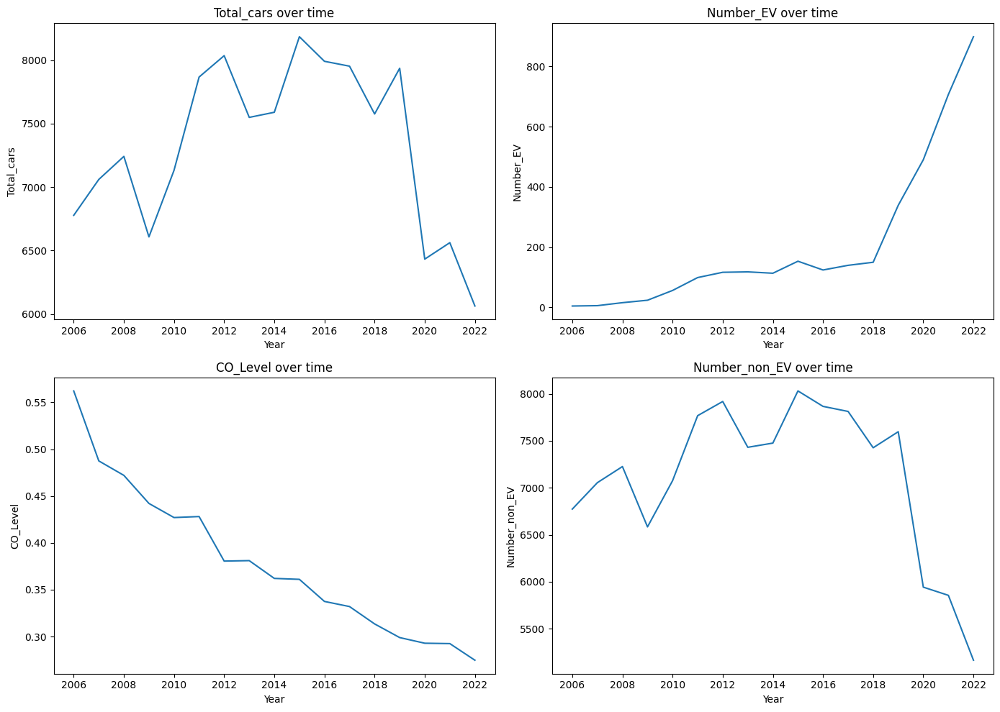

In [ ]:
# Ensure the time variable is available and sorted
CO_EV_merged = CO_EV_merged.sort_values('Year')  # or 'Date'

# Set the time column name
time_col = 'Year'

# Columns to plot
cols_to_plot = ['Total_cars', 'Number_EV', 'CO_Level', 'Number_non_EV']

# Create 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

# Line plot over time for each variable without confidence interval
for i, col in enumerate(cols_to_plot):
    sns.lineplot(x=CO_EV_merged[time_col], y=CO_EV_merged[col], ax=axes[i], ci=None)
    axes[i].set_title(f'{col} over time')
    axes[i].set_xlabel(time_col)
    axes[i].set_ylabel(col)

plt.tight_layout()
plt.show()

<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


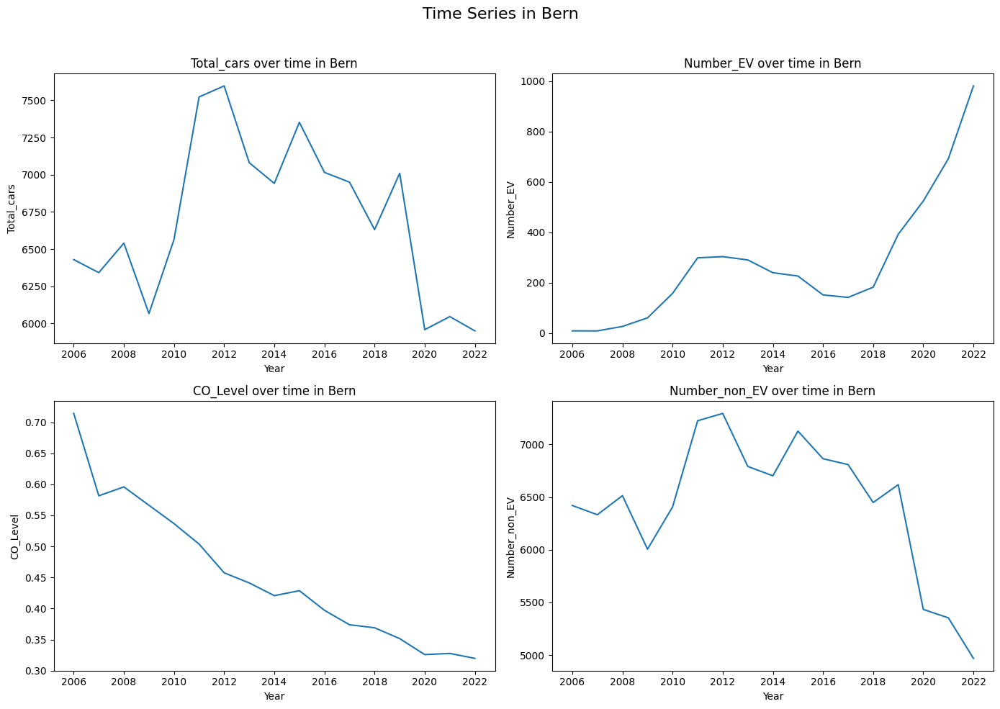

<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


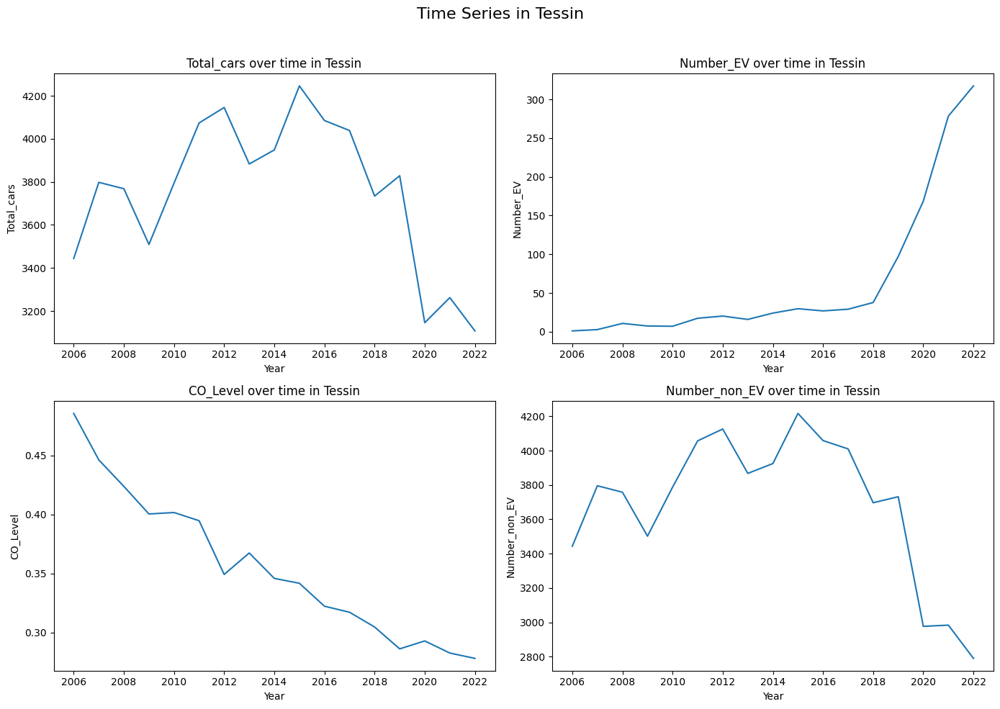

<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


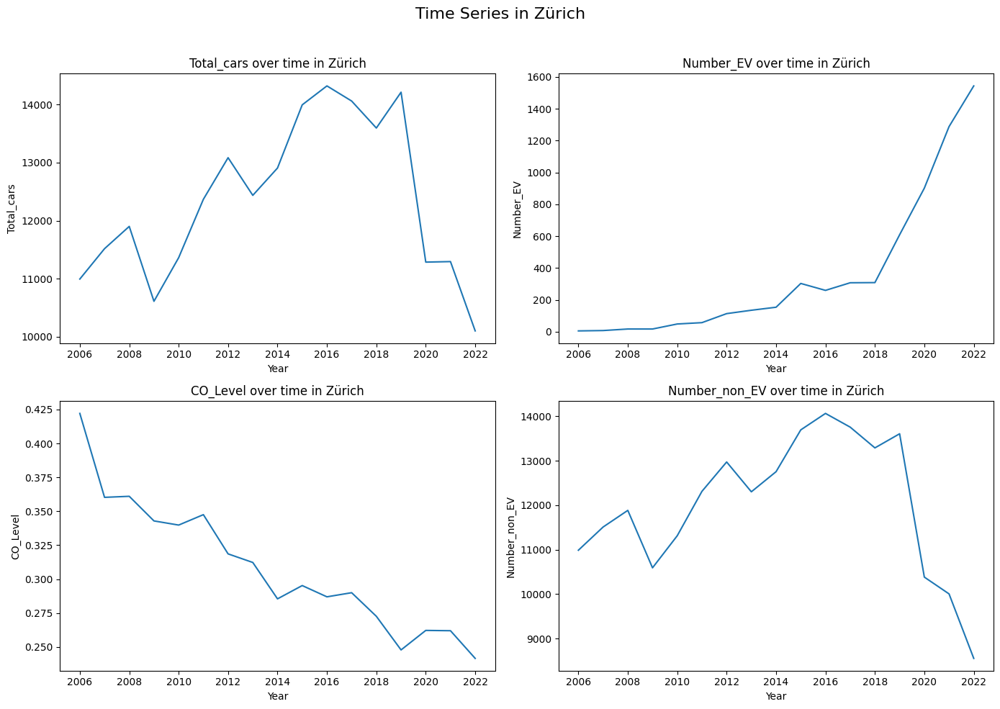

<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
<ipython-input-134-5ab9b1b0dc8c>:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)


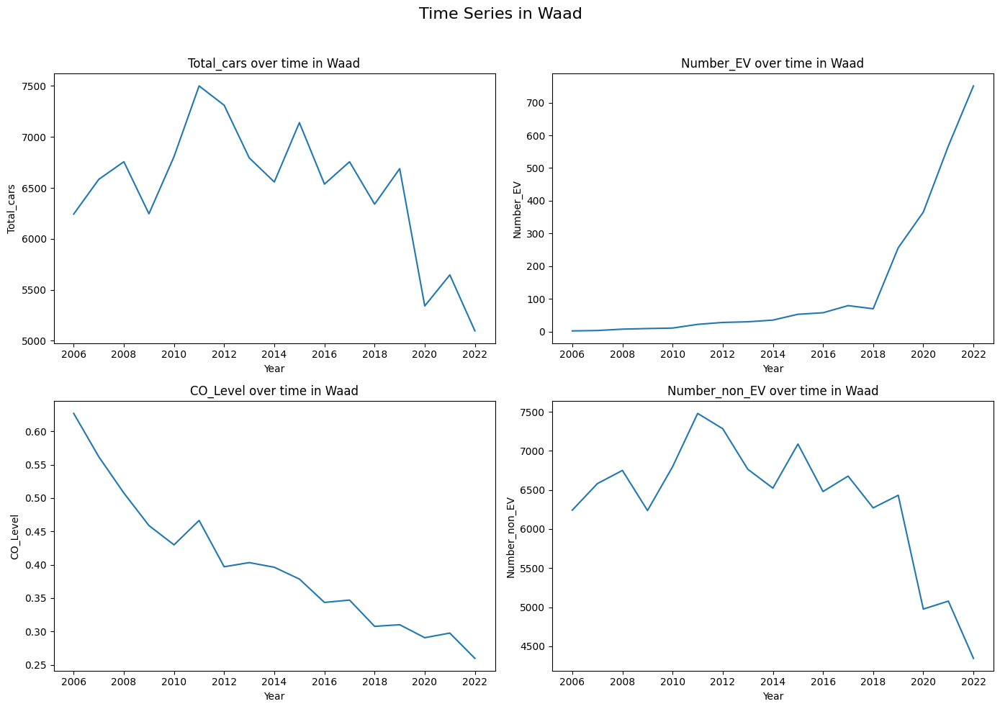

In [ ]:
# Ensure data is sorted by Year
CO_EV_merged = CO_EV_merged.sort_values('Year')

# Time column and columns to plot
time_col = 'Year'
cols_to_plot = ['Total_cars', 'Number_EV', 'CO_Level', 'Number_non_EV']

# Loop through cantons
for canton in CO_EV_merged['Canton'].unique():
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]

    # Skip if too few data points
    if df.shape[0] < 3:
        continue

    # Create 2x2 subplot
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    # Plot each variable
    for i, col in enumerate(cols_to_plot):
        sns.lineplot(x=df[time_col], y=df[col], ax=axes[i], ci=None)
        axes[i].set_title(f'{col} over time in {canton}')
        axes[i].set_xlabel(time_col)
        axes[i].set_ylabel(col)

    plt.suptitle(f'Time Series in {canton}', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

Correlation between CO_Level and non_EV_proportion: 0.2694694978088507


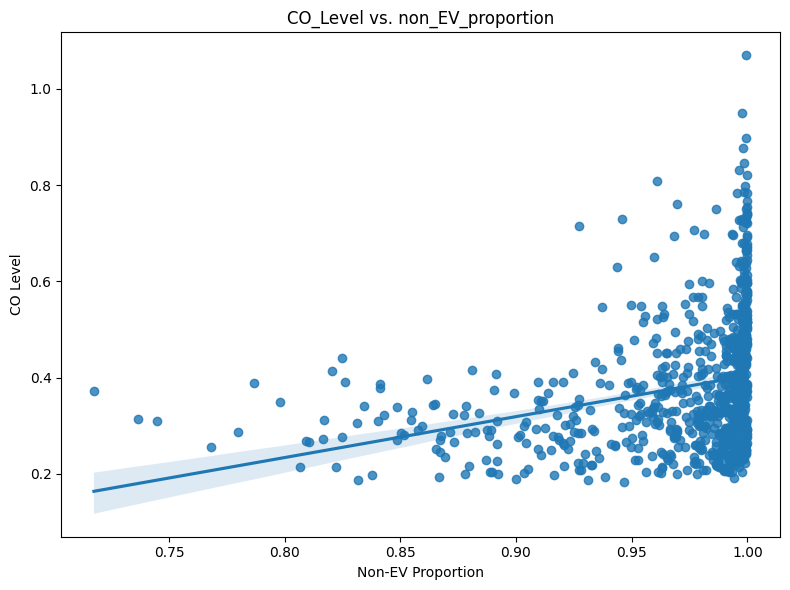

In [ ]:
# Specific correlation between CO_Level and non_EV_proportion
correlation_CO_nonEV = CO_EV_merged['CO_Level'].corr(CO_EV_merged['non_EV_proportion'])
print(f"Correlation between CO_Level and non_EV_proportion: {correlation_CO_nonEV}")

# Scatter plot with regression line for CO_Level vs non_EV_proportion
plt.figure(figsize=(8, 6))
sns.regplot(x='non_EV_proportion', y='CO_Level', data=CO_EV_merged)
plt.title('CO_Level vs. non_EV_proportion')
plt.xlabel('Non-EV Proportion')
plt.ylabel('CO Level')
plt.tight_layout()
plt.show()

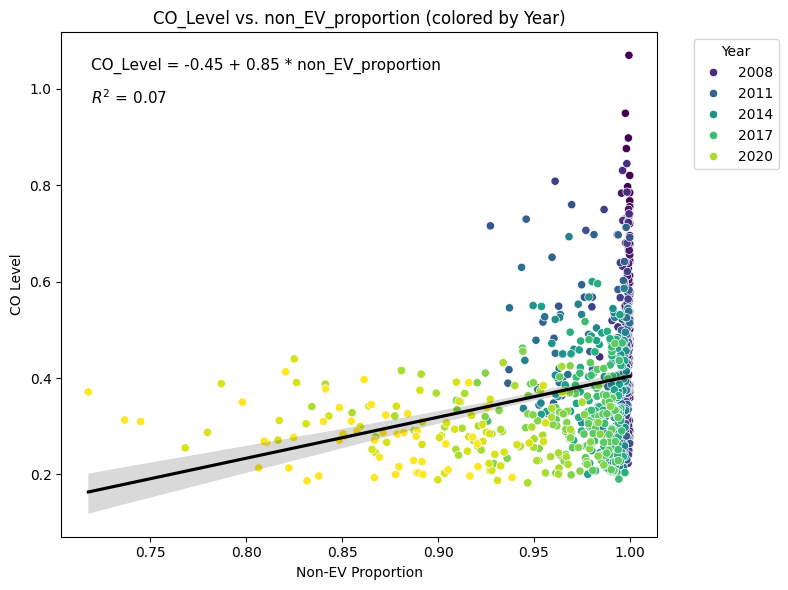

In [ ]:
# Prepare the data
X = CO_EV_merged['non_EV_proportion']
y = CO_EV_merged['CO_Level']

# Add constant for intercept
X_with_const = sm.add_constant(X)
model = sm.OLS(y, X_with_const).fit()

# Extract regression values
intercept = model.params['const']
slope = model.params['non_EV_proportion']
r_squared = model.rsquared

# Plot setup
plt.figure(figsize=(8, 6))

# Colored scatterplot by Year
sns.scatterplot(
    data=CO_EV_merged,
    x='non_EV_proportion',
    y='CO_Level',
    hue='Year',
    palette='viridis',
    legend='auto'
)

# Regression line (no scatter)
sns.regplot(
    data=CO_EV_merged,
    x='non_EV_proportion',
    y='CO_Level',
    scatter=False,
    line_kws={"color": "black"}
)

# Annotate equation and R²
equation = f"CO_Level = {intercept:.2f} + {slope:.2f} * non_EV_proportion"
r2_text = f"$R^2$ = {r_squared:.2f}"
plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=11, verticalalignment='top')

# Labels and layout
plt.title('CO_Level vs. non_EV_proportion (colored by Year)')
plt.xlabel('Non-EV Proportion')
plt.ylabel('CO Level')
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

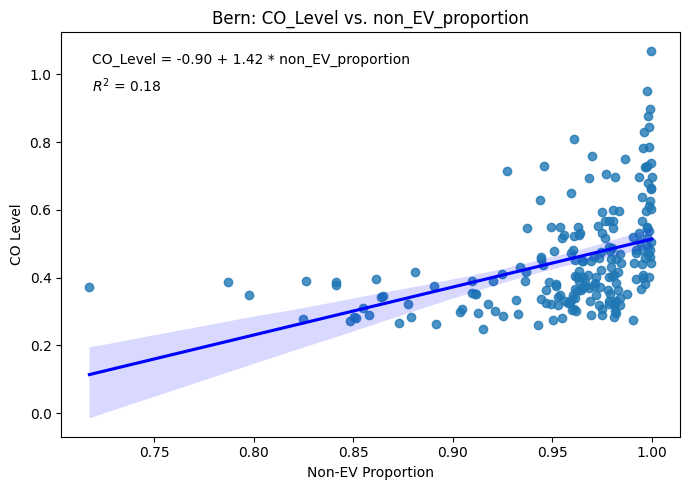

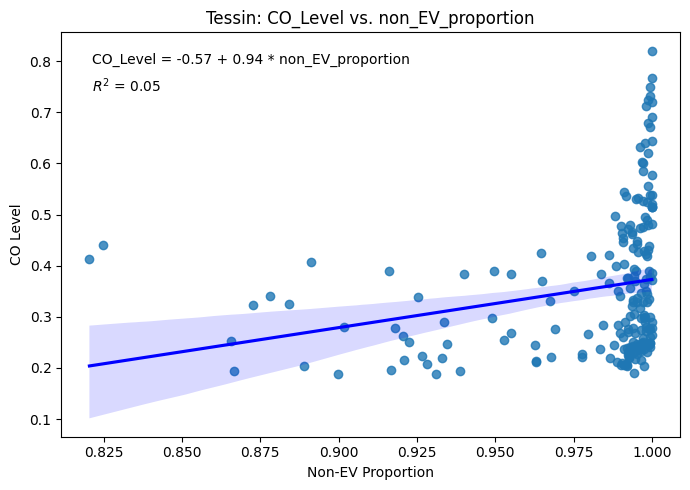

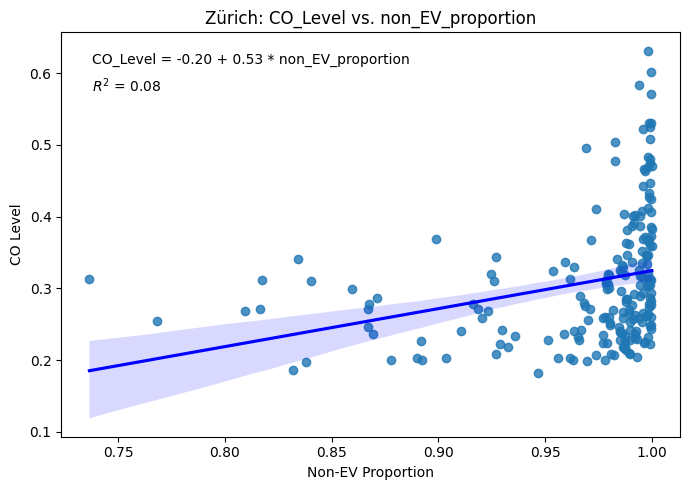

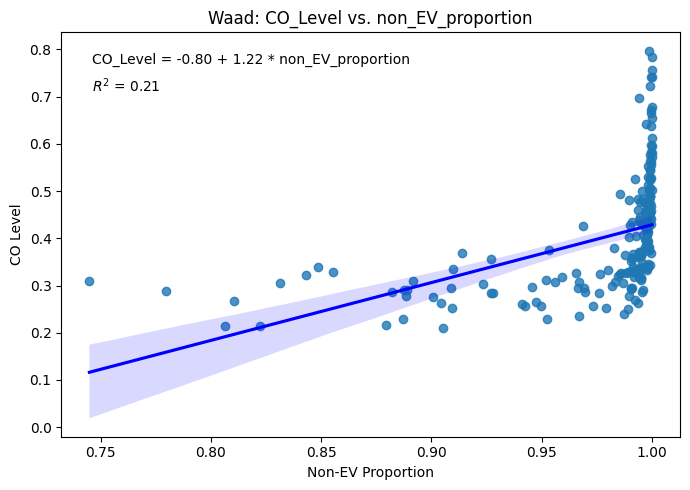

In [ ]:
# Get list of unique cantons
cantons = CO_EV_merged['Canton'].unique()

# Loop through each canton and plot
for canton in cantons:
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]

    if len(df) < 3:
        continue  # skip small groups

    # Prepare regression
    X = df['non_EV_proportion']
    y = df['CO_Level']
    X_with_const = sm.add_constant(X)
    model = sm.OLS(y, X_with_const).fit()

    intercept = model.params['const']
    slope = model.params['non_EV_proportion']
    r_squared = model.rsquared

    # Plot
    plt.figure(figsize=(7, 5))
    sns.regplot(x='non_EV_proportion', y='CO_Level', data=df, line_kws={"color": "blue"})

    # Annotate with regression function and R²
    equation = f"CO_Level = {intercept:.2f} + {slope:.2f} * non_EV_proportion"
    r2_text = f"$R^2$ = {r_squared:.2f}"
    plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
    plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

    plt.title(f'{canton}: CO_Level vs. non_EV_proportion')
    plt.xlabel('Non-EV Proportion')
    plt.ylabel('CO Level')
    plt.tight_layout()
    plt.show()

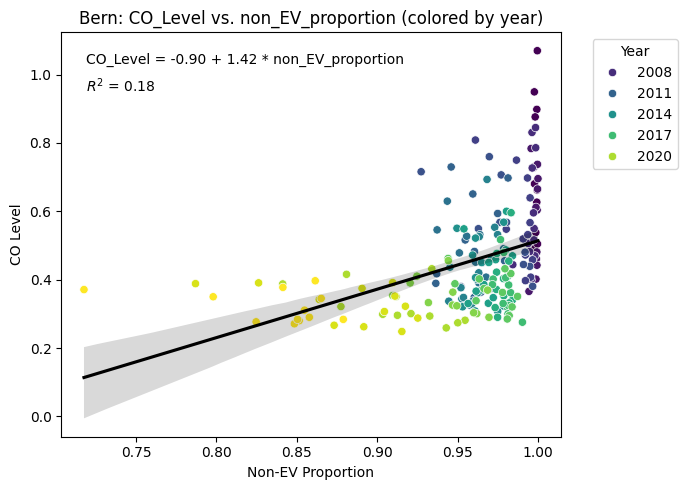

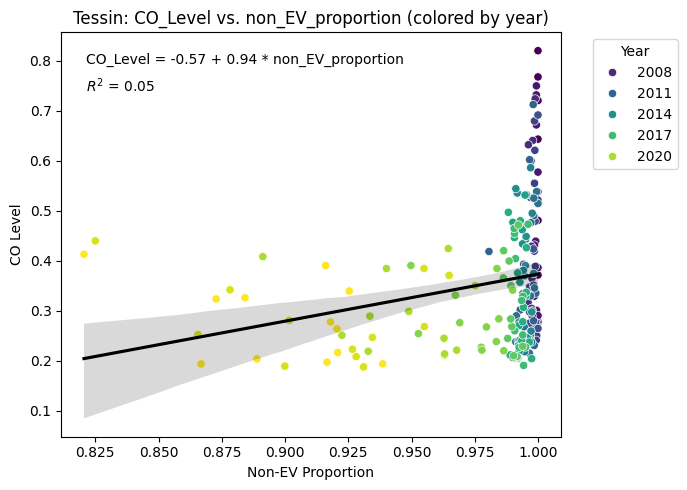

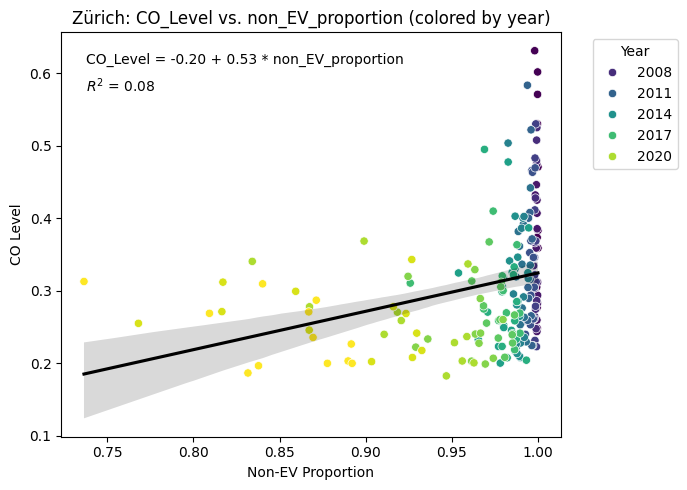

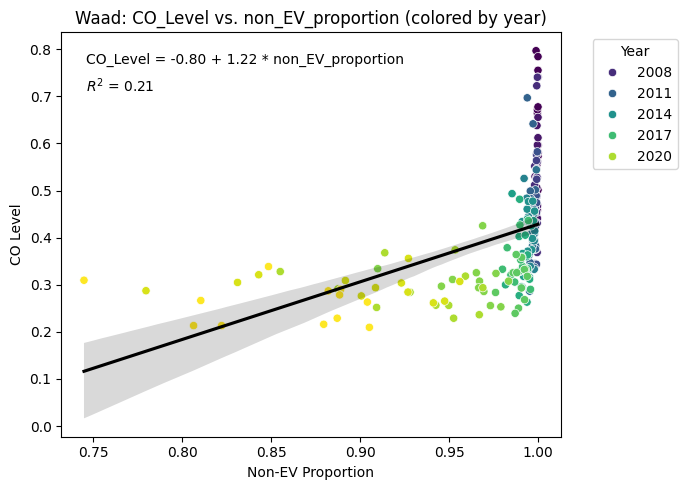

In [ ]:
# Unique cantons
cantons = CO_EV_merged['Canton'].unique()

# Loop through each canton
for canton in cantons:
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]

    if len(df) < 3:
        continue  # skip small groups

    # Regression setup
    X = df['non_EV_proportion']
    y = df['CO_Level']
    X_with_const = sm.add_constant(X)
    model = sm.OLS(y, X_with_const).fit()

    intercept = model.params['const']
    slope = model.params['non_EV_proportion']
    r_squared = model.rsquared

    # Plot setup
    plt.figure(figsize=(7, 5))

    # Colored scatterplot
    sns.scatterplot(
        x='non_EV_proportion',
        y='CO_Level',
        hue='Year',
        palette='viridis',
        data=df,
        legend='auto'
    )

    # Regression line
    sns.regplot(
        x='non_EV_proportion',
        y='CO_Level',
        data=df,
        scatter=False,
        line_kws={"color": "black"}
    )

    # Annotate
    equation = f"CO_Level = {intercept:.2f} + {slope:.2f} * non_EV_proportion"
    r2_text = f"$R^2$ = {r_squared:.2f}"
    plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
    plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

    # Titles and labels
    plt.title(f'{canton}: CO_Level vs. non_EV_proportion (colored by year)')
    plt.xlabel('Non-EV Proportion')
    plt.ylabel('CO Level')
    plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

In [ ]:
# Prepare the data for regression
X = CO_EV_merged['non_EV_proportion']
y = CO_EV_merged['CO_Level']

# Add a constant to the independent variable
X = sm.add_constant(X)

# Fit the linear regression model
model = sm.OLS(y, X).fit()

# Print the model summary
print(model.summary())

# Extract R-squared
r_squared = model.rsquared

# Extract coefficients
intercept = model.params['const']
slope = model.params['non_EV_proportion']

print(f"R-squared: {r_squared}")
print(f"Regression Function: CO_Level = {intercept} + {slope} * non_EV_proportion")

                            OLS Regression Results                            
Dep. Variable:               CO_Level   R-squared:                       0.073
Model:                            OLS   Adj. R-squared:                  0.071
Method:                 Least Squares   F-statistic:                     63.74
Date:                Sun, 11 May 2025   Prob (F-statistic):           4.84e-15
Time:                        14:01:48   Log-Likelihood:                 487.68
No. Observations:                 816   AIC:                            -971.4
Df Residuals:                     814   BIC:                            -962.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -0.4467      0.10

In [ ]:
# Loop through each canton
for canton in CO_EV_merged['Canton'].unique():
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]

    # Skip cantons with insufficient data
    if len(df) < 3:
        continue

    # Prepare regression inputs
    X = sm.add_constant(df['non_EV_proportion'])
    y = df['CO_Level']

    # Fit regression model
    model = sm.OLS(y, X).fit()

    # Extract results
    r_squared = model.rsquared
    intercept = model.params['const']
    slope = model.params['non_EV_proportion']

    # Print results
    print(f"--- {canton} ---")
    print(model.summary())
    print(f"R-squared: {r_squared:.4f}")
    print(f"Regression Function: CO_Level = {intercept:.4f} + {slope:.4f} * non_EV_proportion\n")

--- Bern ---
                            OLS Regression Results                            
Dep. Variable:               CO_Level   R-squared:                       0.181
Model:                            OLS   Adj. R-squared:                  0.177
Method:                 Least Squares   F-statistic:                     44.78
Date:                Sun, 11 May 2025   Prob (F-statistic):           2.13e-10
Time:                        14:01:48   Log-Likelihood:                 116.25
No. Observations:                 204   AIC:                            -228.5
Df Residuals:                     202   BIC:                            -221.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -0.9

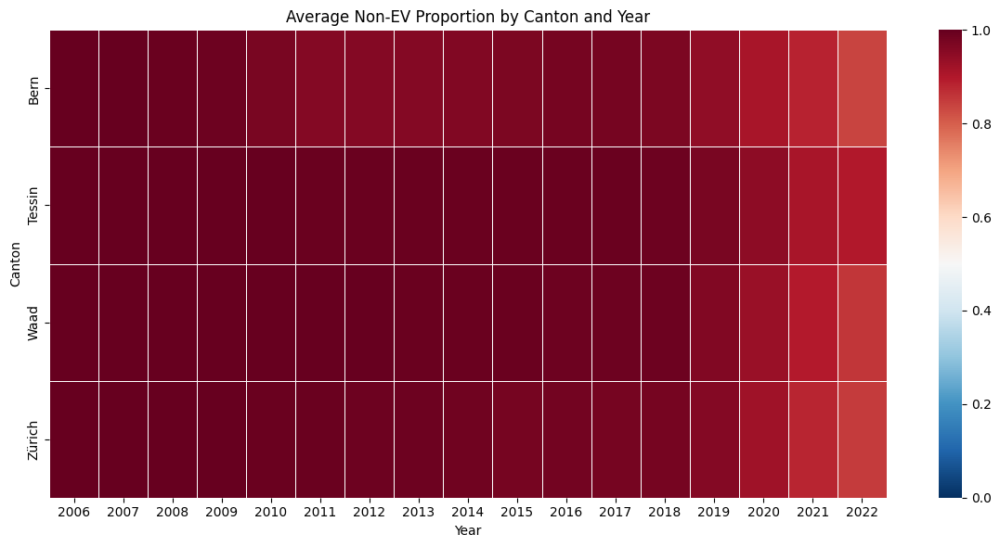

In [ ]:
# Pivot table for non-EV share per canton and year
pivot_table = CO_EV_merged.pivot_table(
    index='Canton',
    columns='Year',
    values='non_EV_proportion',
    aggfunc='mean'
)

# Create heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(
    pivot_table,
    cmap='RdBu_r',         # Blue = low, Red = high
    linewidths=0.5,
    linecolor='white',
    vmin=0, vmax=1         # force full color range
)

plt.title('Average Non-EV Proportion by Canton and Year')
plt.xlabel('Year')
plt.ylabel('Canton')
plt.tight_layout()
plt.show()

<ipython-input-142-c106ae73242e>:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


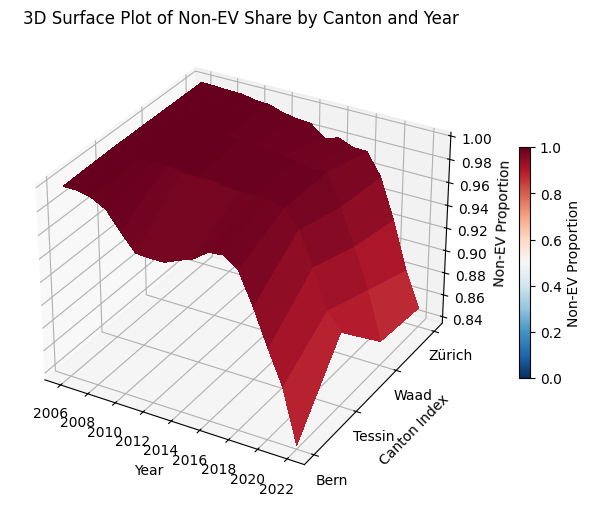

In [ ]:
# Pivot data: Canton × Year for non-EV proportion
z_data = CO_EV_merged.pivot_table(
    index='Canton',
    columns='Year',
    values='non_EV_proportion',
    aggfunc='mean'
)

# Meshgrid for axes
X, Y = np.meshgrid(z_data.columns, range(len(z_data.index)))
Z = z_data.values

# Create the plot
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
surf = ax.plot_surface(
    X, Y, Z,
    cmap='RdBu_r',
    linewidth=0,
    antialiased=False,
    vmin=0, vmax=1
)

# Axis customization
ax.set_title('3D Surface Plot of Non-EV Share by Canton and Year')
ax.set_xlabel('Year')
ax.set_ylabel('Canton Index')
ax.set_zlabel('Non-EV Proportion')
ax.set_yticks(range(len(z_data.index)))
ax.set_yticklabels(z_data.index)

# Color bar
fig.colorbar(surf, ax=ax, shrink=0.5, label='Non-EV Proportion')

plt.tight_layout()
plt.show()

Welch's t-test for non-EV share before and after EV uptake (2018)
T-statistic: 17.589
P-value: 0.00000
Statistically significant difference in non-EV share after 2018.


<ipython-input-143-82c16a54c9bf>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Period', y='non_EV_proportion', data=CO_EV_merged, palette='coolwarm')


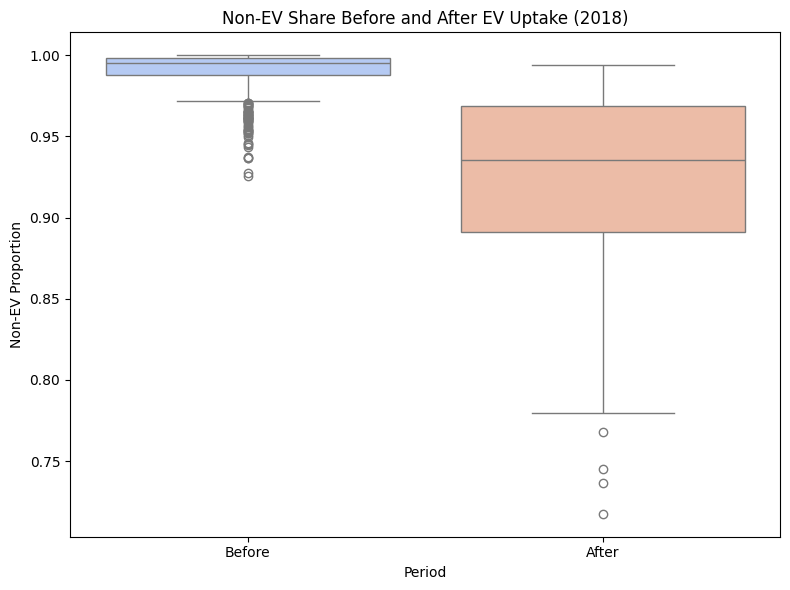

In [ ]:
# --- Ensure non_EV_proportion column exists ---
if 'non_EV_proportion' not in CO_EV_merged.columns:
    CO_EV_merged['non_EV_proportion'] = 1 - CO_EV_merged['EV_proportion']

# --- Define cutoff year for EV uptake ---
cutoff_year = 2018

# --- Create 'Period' column: Before vs. After EV rise ---
CO_EV_merged['Period'] = CO_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# --- Split data ---
before = CO_EV_merged[CO_EV_merged['Period'] == 'Before']['non_EV_proportion']
after = CO_EV_merged[CO_EV_merged['Period'] == 'After']['non_EV_proportion']

# --- Welch's t-test (for unequal variances) ---
t_stat, p_val = ttest_ind(before, after, equal_var=False)

# --- Print results ---
print("Welch's t-test for non-EV share before and after EV uptake (2018)")
print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_val:.5f}")
if p_val < 0.05:
    print("Statistically significant difference in non-EV share after 2018.")
else:
    print("No statistically significant difference detected.")

# --- Boxplot for visualization ---
plt.figure(figsize=(8, 6))
sns.boxplot(x='Period', y='non_EV_proportion', data=CO_EV_merged, palette='coolwarm')
plt.title('Non-EV Share Before and After EV Uptake (2018)')
plt.ylabel('Non-EV Proportion')
plt.xlabel('Period')
plt.tight_layout()
plt.show()

Welch's t-test results for non-EV share per Canton:
     Canton  N Before  N After  T-Statistic  P-Value  Significant (p<0.05)
       Waad       144       60        8.861      0.0                  True
     Tessin       144       60        9.075      0.0                  True
       Bern       144       60        8.974      0.0                  True
     Zürich       144       60        9.391      0.0                  True
    Thurgau       144       60       10.495      0.0                  True
Basel-Stadt       144       60        9.217      0.0                  True
     Aargau        19       60        8.215      0.0                  True


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

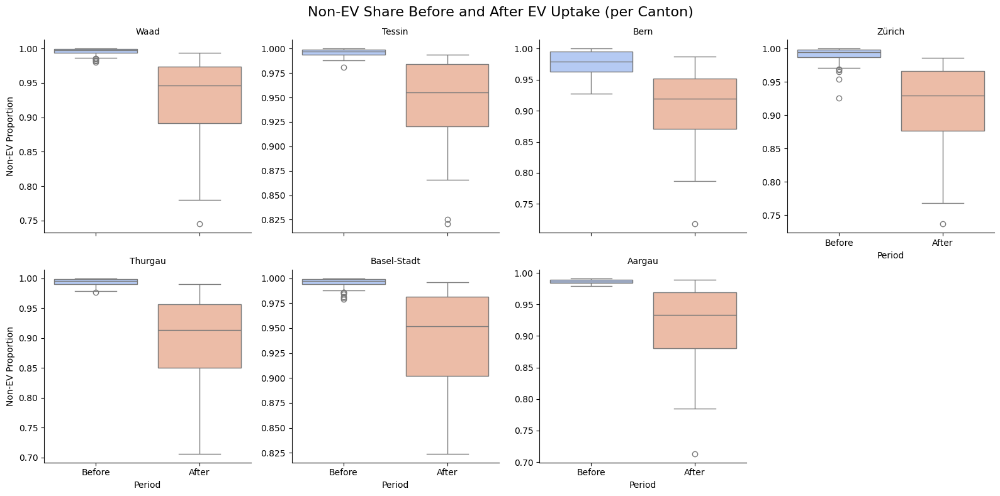

In [ ]:
# --- Ensure the non_EV_proportion column exists ---
if 'non_EV_proportion' not in NOX_EV_merged.columns:
    NOX_EV_merged['non_EV_proportion'] = 1 - NOX_EV_merged['EV_proportion']

# --- Define cutoff year ---
cutoff_year = 2018

# --- Create 'Period' column ---
NOX_EV_merged['Period'] = NOX_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# --- Prepare results list and filter for valid cantons ---
results = []
valid_cantons = []

for canton in NOX_EV_merged['Canton'].unique():
    df = NOX_EV_merged[NOX_EV_merged['Canton'] == canton]
    before = df[df['Period'] == 'Before']['non_EV_proportion']
    after = df[df['Period'] == 'After']['non_EV_proportion']

    if len(before) >= 3 and len(after) >= 3:
        valid_cantons.append(canton)

        # Welch's t-test
        t_stat, p_val = ttest_ind(before, after, equal_var=False)
        results.append({
            'Canton': canton,
            'N Before': len(before),
            'N After': len(after),
            'T-Statistic': round(t_stat, 3),
            'P-Value': round(p_val, 5),
            'Significant (p<0.05)': p_val < 0.05
        })

# --- Convert results to DataFrame ---
results_df = pd.DataFrame(results)

# --- Print results ---
print("Welch's t-test results for non-EV share per Canton:")
print(results_df.to_string(index=False))

# --- Plot: Faceted boxplots per canton ---
filtered_df = NOX_EV_merged[NOX_EV_merged['Canton'].isin(valid_cantons)]

g = sns.FacetGrid(filtered_df, col="Canton", col_wrap=4, sharey=False, height=4)
g.map_dataframe(sns.boxplot, x='Period', y='non_EV_proportion', palette='coolwarm')
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Period", "Non-EV Proportion")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Non-EV Share Before and After EV Uptake (per Canton)", fontsize=16)
plt.tight_layout()
plt.show()

Welch's t-test for non_EV_proportion before and after EV uptake (2018)
T-statistic: 17.589
P-value: 0.00000
Statistically significant difference in non-EV share after 2018.


<ipython-input-145-15cb8b25474d>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Period', y='non_EV_proportion', data=CO_EV_merged, palette='Reds')


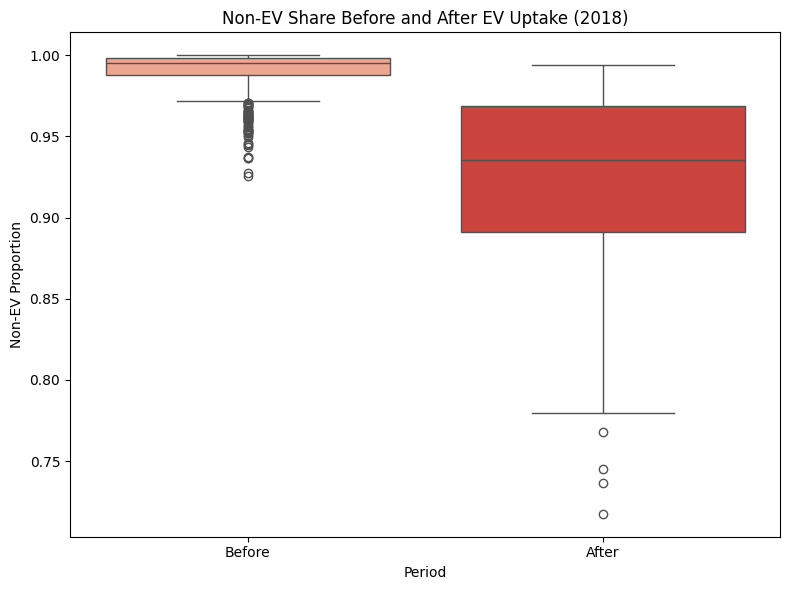

In [ ]:
# --- Ensure non_EV_proportion column exists ---
if 'non_EV_proportion' not in CO_EV_merged.columns:
    CO_EV_merged['non_EV_proportion'] = 1 - CO_EV_merged['EV_proportion']

# --- Define cutoff year for EV uptake ---
cutoff_year = 2018

# --- Create 'Period' column: Before vs. After EV rise ---
CO_EV_merged['Period'] = CO_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# --- Split data for non-EV share ---
before_non_ev = CO_EV_merged[CO_EV_merged['Period'] == 'Before']['non_EV_proportion']
after_non_ev = CO_EV_merged[CO_EV_merged['Period'] == 'After']['non_EV_proportion']

# --- Welch's t-test ---
t_stat, p_val = ttest_ind(before_non_ev, after_non_ev, equal_var=False)

# --- Print results ---
print("Welch's t-test for non_EV_proportion before and after EV uptake (2018)")
print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_val:.5f}")
if p_val < 0.05:
    print("Statistically significant difference in non-EV share after 2018.")
else:
    print("No statistically significant difference detected.")

# --- Boxplot for visualization ---
plt.figure(figsize=(8, 6))
sns.boxplot(x='Period', y='non_EV_proportion', data=CO_EV_merged, palette='Reds')
plt.title('Non-EV Share Before and After EV Uptake (2018)')
plt.ylabel('Non-EV Proportion')
plt.xlabel('Period')
plt.tight_layout()
plt.show()

Welch's t-test for non-EV share by canton (before vs after 2018):
Canton  N Before  N After  T-Statistic  P-Value  Significant (p<0.05)
  Bern       144       60        8.974      0.0                  True
Tessin       144       60        9.075      0.0                  True
Zürich       144       60        9.391      0.0                  True
  Waad       144       60        8.861      0.0                  True


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

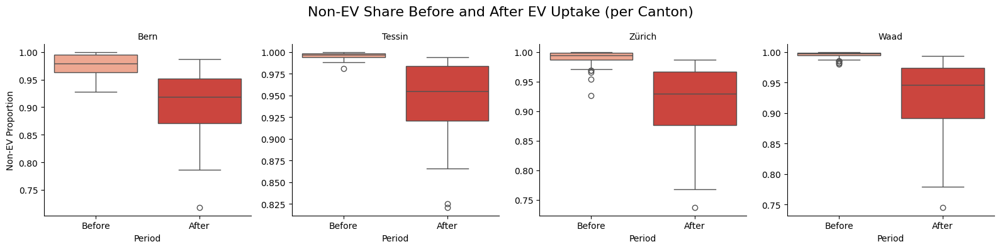

In [ ]:
# --- Ensure 'non_EV_proportion' exists ---
if 'non_EV_proportion' not in CO_EV_merged.columns:
    CO_EV_merged['non_EV_proportion'] = 1 - CO_EV_merged['EV_proportion']

# --- Define cutoff year ---
cutoff_year = 2018

# --- Create 'Period' column ---
CO_EV_merged['Period'] = CO_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# --- Prepare results ---
results = []
valid_cantons = []

# --- Loop over cantons ---
for canton in CO_EV_merged['Canton'].unique():
    df = CO_EV_merged[CO_EV_merged['Canton'] == canton]
    before = df[df['Period'] == 'Before']['non_EV_proportion']
    after = df[df['Period'] == 'After']['non_EV_proportion']

    if len(before) >= 3 and len(after) >= 3:
        valid_cantons.append(canton)

        # Welch's t-test
        t_stat, p_val = ttest_ind(before, after, equal_var=False)
        results.append({
            'Canton': canton,
            'N Before': len(before),
            'N After': len(after),
            'T-Statistic': round(t_stat, 3),
            'P-Value': round(p_val, 5),
            'Significant (p<0.05)': p_val < 0.05
        })

# --- Display results ---
results_df = pd.DataFrame(results)
print("Welch's t-test for non-EV share by canton (before vs after 2018):")
print(results_df.to_string(index=False))

# --- Boxplot visualization ---
filtered_df = CO_EV_merged[CO_EV_merged['Canton'].isin(valid_cantons)]

g = sns.FacetGrid(filtered_df, col="Canton", col_wrap=4, sharey=False, height=4)
g.map_dataframe(sns.boxplot, x='Period', y='non_EV_proportion', palette='Reds')
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Period", "Non-EV Proportion")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Non-EV Share Before and After EV Uptake (per Canton)", fontsize=16)
plt.tight_layout()
plt.show()

<ipython-input-147-8fd6482dd6f4>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Period', y='non_EV_proportion', data=NOX_EV_merged, palette='Reds')


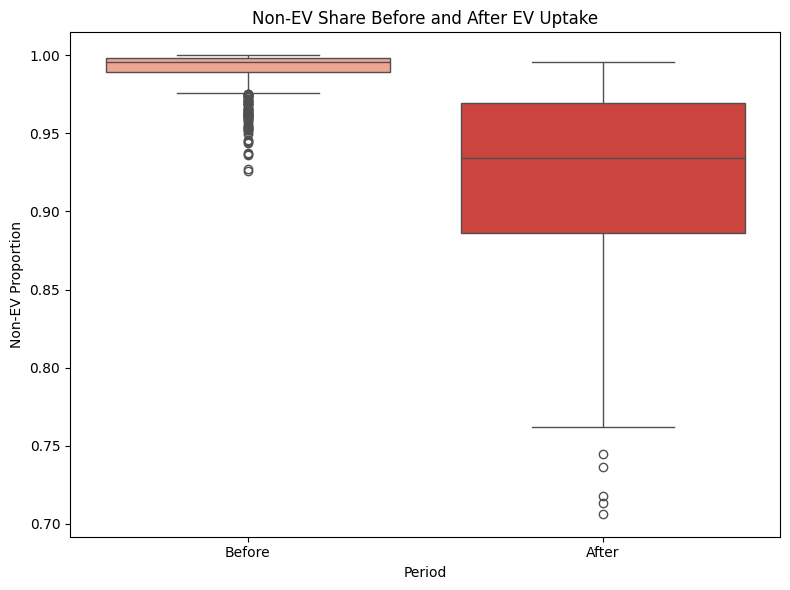

T-statistic: 23.706
P-value: 0.00000
Statistically significant difference in non-EV share before vs. after EV uptake


In [ ]:
# --- Ensure non_EV_proportion column exists ---
if 'non_EV_proportion' not in NOX_EV_merged.columns:
    NOX_EV_merged['non_EV_proportion'] = 1 - NOX_EV_merged['EV_proportion']

# --- Define cutoff year ---
cutoff_year = 2018

# --- Create a new 'Period' column: Before vs. After EV rise ---
NOX_EV_merged['Period'] = NOX_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# --- Split data ---
before = NOX_EV_merged[NOX_EV_merged['Period'] == 'Before']['non_EV_proportion']
after = NOX_EV_merged[NOX_EV_merged['Period'] == 'After']['non_EV_proportion']

# --- Visualization: Boxplot of non-EV share before and after EV rise ---
plt.figure(figsize=(8, 6))
sns.boxplot(x='Period', y='non_EV_proportion', data=NOX_EV_merged, palette='Reds')
plt.title('Non-EV Share Before and After EV Uptake')
plt.ylabel('Non-EV Proportion')
plt.xlabel('Period')
plt.tight_layout()
plt.show()

# --- Statistical Test: Independent t-test (Welch's t-test) ---
t_stat, p_val = ttest_ind(before, after, equal_var=False)

print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_val:.5f}")

if p_val < 0.05:
    print("Statistically significant difference in non-EV share before vs. after EV uptake")
else:
    print("No statistically significant difference detected")

Welch's t-test results for non-EV share per Canton:
     Canton  N Before  N After  T-Statistic  P-Value  Significant (p<0.05)
       Waad       144       60        8.861      0.0                  True
     Tessin       144       60        9.075      0.0                  True
       Bern       144       60        8.974      0.0                  True
     Zürich       144       60        9.391      0.0                  True
    Thurgau       144       60       10.495      0.0                  True
Basel-Stadt       144       60        9.217      0.0                  True
     Aargau        19       60        8.215      0.0                  True


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

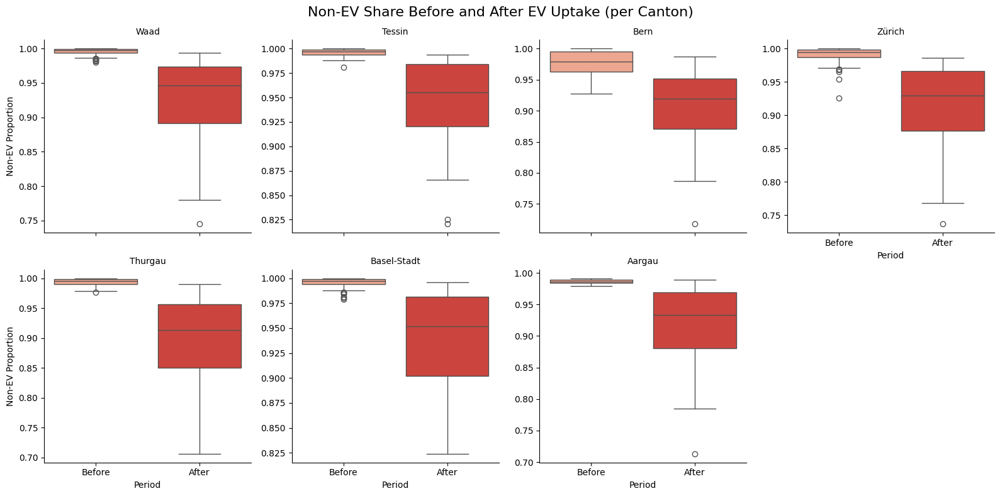

In [ ]:
# --- Ensure non_EV_proportion column exists ---
if 'non_EV_proportion' not in NOX_EV_merged.columns:
    NOX_EV_merged['non_EV_proportion'] = 1 - NOX_EV_merged['EV_proportion']

# --- Define cutoff year ---
cutoff_year = 2018

# --- Create 'Period' column ---
NOX_EV_merged['Period'] = NOX_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# --- Prepare results and filter for valid cantons ---
results = []
valid_cantons = []

for canton in NOX_EV_merged['Canton'].unique():
    df = NOX_EV_merged[NOX_EV_merged['Canton'] == canton]
    before = df[df['Period'] == 'Before']['non_EV_proportion']
    after = df[df['Period'] == 'After']['non_EV_proportion']

    if len(before) >= 3 and len(after) >= 3:
        valid_cantons.append(canton)
        t_stat, p_val = ttest_ind(before, after, equal_var=False)
        results.append({
            'Canton': canton,
            'N Before': len(before),
            'N After': len(after),
            'T-Statistic': round(t_stat, 3),
            'P-Value': round(p_val, 5),
            'Significant (p<0.05)': p_val < 0.05
        })

# --- Print results ---
results_df = pd.DataFrame(results)
print("Welch's t-test results for non-EV share per Canton:")
print(results_df.to_string(index=False))

# --- Faceted boxplots ---
filtered_df = NOX_EV_merged[NOX_EV_merged['Canton'].isin(valid_cantons)]
g = sns.FacetGrid(filtered_df, col="Canton", col_wrap=4, sharey=False, height=4)
g.map_dataframe(sns.boxplot, x='Period', y='non_EV_proportion', palette='Reds')
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Period", "Non-EV Proportion")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Non-EV Share Before and After EV Uptake (per Canton)", fontsize=16)
plt.tight_layout()
plt.show()

<ipython-input-149-775d9a8e4244>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Period', y='NOx_Level', data=NOX_EV_merged, palette='coolwarm')


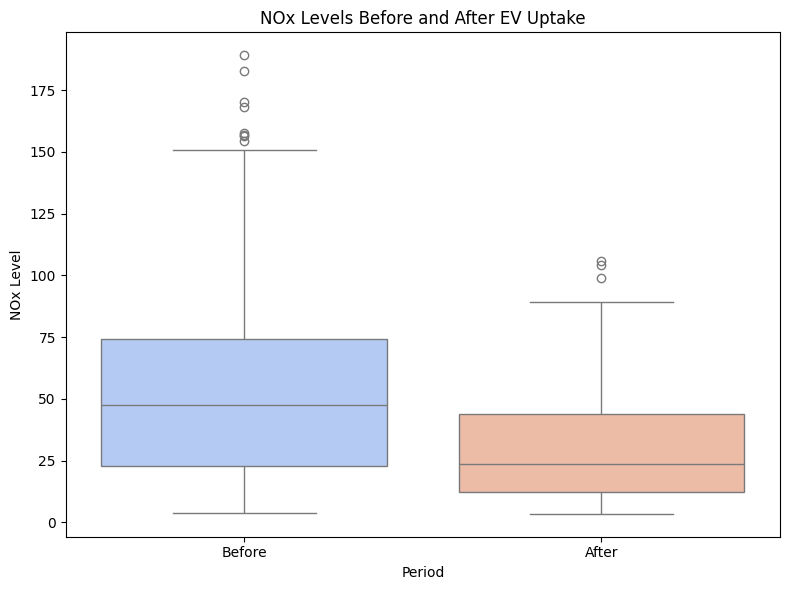

T-statistic: 14.038
P-value: 0.00000
Statistically significant difference in NOx levels before vs. after EV uptake


In [ ]:
# --- Define cutoff year when EV adoption started rising ---
cutoff_year = 2018

# --- Create a new 'Period' column: Before vs. After EV rise ---
NOX_EV_merged['Period'] = NOX_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# --- Split data ---
before = NOX_EV_merged[NOX_EV_merged['Period'] == 'Before']
after = NOX_EV_merged[NOX_EV_merged['Period'] == 'After']

# --- Visualization: Boxplot of NOx levels before and after EV rise ---
plt.figure(figsize=(8, 6))
sns.boxplot(x='Period', y='NOx_Level', data=NOX_EV_merged, palette='coolwarm')
plt.title('NOx Levels Before and After EV Uptake')
plt.ylabel('NOx Level')
plt.xlabel('Period')
plt.tight_layout()
plt.show()

# --- Statistical Test: Independent t-test (Welch's t-test) ---
t_stat, p_val = ttest_ind(before['NOx_Level'], after['NOx_Level'], equal_var=False)

print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_val:.5f}")

if p_val < 0.05:
    print("Statistically significant difference in NOx levels before vs. after EV uptake")
else:
    print("No statistically significant difference detected")

Welch's t-test results for NOx levels per Canton:
     Canton  N Before  N After  T-Statistic  P-Value  Significant (p<0.05)
       Waad       144       60       12.129  0.00000                  True
     Tessin       144       60        5.139  0.00000                  True
       Bern       144       60       10.162  0.00000                  True
     Zürich       144       60        6.618  0.00000                  True
    Thurgau       144       60        3.955  0.00011                  True
Basel-Stadt       144       60        5.515  0.00000                  True
     Aargau        19       60        0.857  0.40069                 False


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

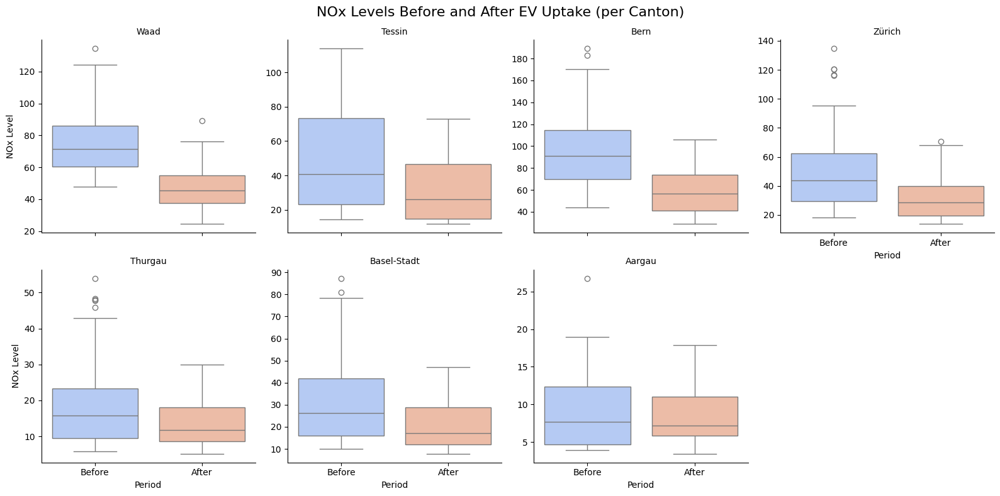

In [ ]:
# --- Define cutoff year ---
cutoff_year = 2018

# --- Create 'Period' column ---
NOX_EV_merged['Period'] = NOX_EV_merged['Year'].apply(lambda x: 'Before' if x < cutoff_year else 'After')

# --- Prepare results and list of valid cantons ---
results = []
valid_cantons = []

for canton in NOX_EV_merged['Canton'].unique():
    df = NOX_EV_merged[NOX_EV_merged['Canton'] == canton]
    before = df[df['Period'] == 'Before']['NOx_Level']
    after = df[df['Period'] == 'After']['NOx_Level']

    if len(before) >= 3 and len(after) >= 3:
        valid_cantons.append(canton)
        t_stat, p_val = ttest_ind(before, after, equal_var=False)
        results.append({
            'Canton': canton,
            'N Before': len(before),
            'N After': len(after),
            'T-Statistic': round(t_stat, 3),
            'P-Value': round(p_val, 5),
            'Significant (p<0.05)': p_val < 0.05
        })

# --- Create results DataFrame and print ---
results_df = pd.DataFrame(results)
print("Welch's t-test results for NOx levels per Canton:")
print(results_df.to_string(index=False))

# --- Boxplots: NOx Level before/after per canton ---
filtered_df = NOX_EV_merged[NOX_EV_merged['Canton'].isin(valid_cantons)]

g = sns.FacetGrid(filtered_df, col="Canton", col_wrap=4, sharey=False, height=4)
g.map_dataframe(sns.boxplot, x='Period', y='NOx_Level', palette='coolwarm')
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Period", "NOx Level")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("NOx Levels Before and After EV Uptake (per Canton)", fontsize=16)
plt.tight_layout()
plt.show()

#Argau not statistically significant

### Alternative way to display the results - NOX and non-EV share

## NOX regressions

### Simple regression

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression # Import the LinearRegression class

In [ ]:
y = NOX_EV_merged['NOx_Level']
X = NOX_EV_merged[['EV_proportion']]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, shuffle=True)

In [ ]:
# 1. Set up the model
model = LinearRegression(fit_intercept= True)
# 2. Use fit
model.fit(X_train, y_train)
# 3. Check the score/accuracy
print("R\u00b2 Score of the model: ", round(model.score(X_train, y_train), 3))

R² Score of the model:  0.03


In [ ]:
print("Intercept: ", model.intercept_)
print("Features coefficients (weigths): ", model.coef_.flatten()[0])

Intercept:  49.248753392208236
Features coefficients (weigths):  -125.45277818014786


In [ ]:
#Model prediction from X_test
predictions = model.predict(X_test)

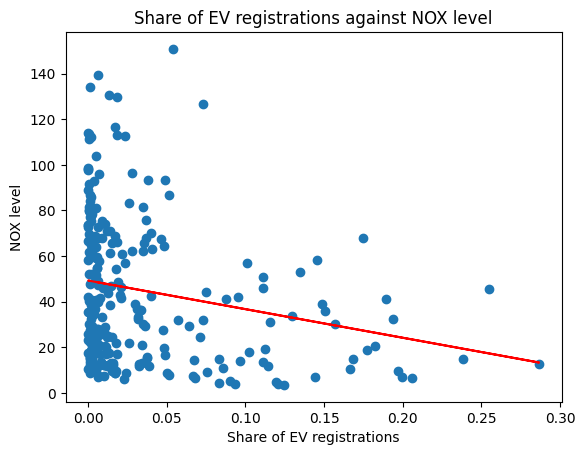

In [ ]:
# Plot the prediction (the line) over the true value (the dots)
plt.scatter(X_test, y_test)
plt.plot(X_test, predictions, 'r')
plt.title("Share of EV registrations against NOX level")
plt.xlabel('Share of EV registrations')
plt.ylabel('NOX level')
plt.show()

In [ ]:
# Compute the MAE, the MSE and the R^2
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MAE: {mae:0.2f}")
print(f"MSE: {mse:0.2f}")
print(f"R\u00b2: {r2:0.2f} " )

MAE: 25.64
MSE: 946.46
R²: 0.05 


In [ ]:
predictions_train = model.predict(X_train)
mae_train = mean_absolute_error(y_train, predictions_train)
mse_train = mean_squared_error(y_train, predictions_train)
r2_train = r2_score(y_train, predictions_train)

print(f"MAE test set: {mae:0.2f}; MAE train set: {mae_train:0.2f};")
print(f"MSE test set: {mse:0.2f}; MSE train set: {mse_train:0.2f};")
print(f"R\u00b2 test set: {r2:0.2f}; R\u00b2 train set: {r2_train:0.2f};" )

MAE test set: 25.64; MAE train set: 26.42;
MSE test set: 946.46; MSE train set: 1053.03;
R² test set: 0.05; R² train set: 0.03;


### Polynomial regression

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

In [ ]:
# We will use a degree 2
poly = PolynomialFeatures(2)
# Transform our training and test set
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Feature name:
X_poly_features = poly.get_feature_names_out(['EV_proportion'])
print(X_poly_features)

['1' 'EV_proportion' 'EV_proportion^2']


In [ ]:
# Set up the model
model_poly = LinearRegression(fit_intercept=False) # we don't need fit intercept since polynomial features function add a column of ones to the data

# Fit
model_poly.fit(X_train_poly, y_train)

# Check the score/accuracy
print("R\u00b2 Score of the model: ", round(model_poly.score(X_train_poly, y_train), 3))

# Print the coefficients of the linear model
model_coeff = pd.DataFrame(model_poly.coef_.flatten(),
                     index=X_poly_features,
                     columns=['Coefficients polynomial model'])
model_coeff # Get the coefficients, w

R² Score of the model:  0.034


,Coefficients polynomial model
1,50.558181
EV_proportion,-238.852210
EV_proportion^2,697.208447


In [ ]:
# Predict:
predictions = model_poly.predict(X_test_poly)

# Compute the MAE, the MSE and the R^2 on the test set
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

# Compute the MAE, the MSE and the R^2 on the training set
predictions_train = model_poly.predict(X_train_poly)
mae_train = mean_absolute_error(y_train, predictions_train)
mse_train = mean_squared_error(y_train, predictions_train)
r2_train = r2_score(y_train, predictions_train)

print(f"MAE test set: {mae:0.2f}; MAE training set: {mae_train:0.2f};")
print(f"MSE test set: {mse:0.2f}; MSE training set: {mse_train:0.2f};")
print(f"R\u00b2 test set: {r2:0.2f}; R\u00b2 training set: {r2_train:0.2f};" )

MAE test set: 25.62; MAE training set: 26.32;
MSE test set: 945.80; MSE training set: 1048.37;
R² test set: 0.05; R² training set: 0.03;


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


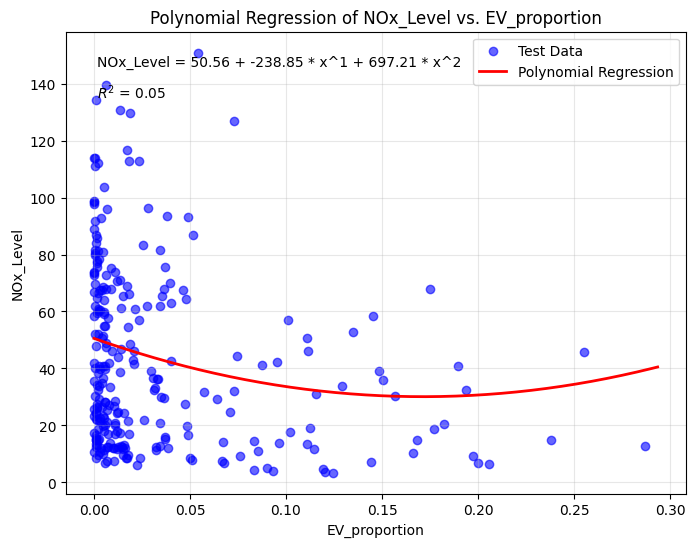

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Prepare equation string for polynomial regression (using coefficients)
equation_terms = []
for i, coef in enumerate(model_poly.coef_):
    if i == 0:
        equation_terms.append(f"{coef:.2f}")  # intercept
    else:
        equation_terms.append(f"{coef:.2f} * x^{i}")
equation = " + ".join(equation_terms)
r2_text = f"$R^2$ = {r2:.2f}"



# 1. Generate a sequence of points to plot the curve
X_seq = np.linspace(X_train['EV_proportion'].min(), X_train['EV_proportion'].max(), 300).reshape(-1, 1)  # 300 points for smooth curve

# 2. Transform X_seq using the PolynomialFeatures object
X_seq_poly = poly.transform(X_seq)  # 'poly' is your PolynomialFeatures object

# 3. Predict y values using the transformed X_seq
y_pred = model_poly.predict(X_seq_poly)

# 4. Plot the original data points and the regression curve
plt.figure(figsize=(8, 6))
plt.scatter(X_test['EV_proportion'], y_test, color='blue', alpha=0.6, label='Test Data')
plt.plot(X_seq, y_pred, color='red', linewidth=2, label='Polynomial Regression')

# Annotate equation and R2
plt.text(0.05, 0.95, f"NOx_Level = {equation}", transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

plt.xlabel('EV_proportion')
plt.ylabel('NOx_Level')
plt.title('Polynomial Regression of NOx_Level vs. EV_proportion')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


### Lasso regression

In [ ]:
from sklearn.linear_model import Lasso

In [ ]:
# Set up the model
lasso_model = Lasso(alpha=0.2, fit_intercept=False)

# Use fit
lasso_model.fit(X_train_poly, y_train)

# Check the score/accuracy
print("R\u00b2 Score of the model: ", round(lasso_model.score(X_train_poly, y_train), 3))

# Print the coefficients of the linear model
model_coeff = pd.DataFrame(lasso_model.coef_.flatten(),
                     index=X_poly_features,
                     columns=['Coefficients Lasso model'])
model_coeff

R² Score of the model:  0.01


,Coefficients Lasso model
1,46.080269
EV_proportion,-24.462236
EV_proportion^2,-0.000000


In [ ]:
# Predict:
predictions = lasso_model.predict(X_test_poly)

# Compute the MAE, the MSE and the R^2 on the test set
mae_lasso = mean_absolute_error(y_test, predictions)
mse_lasso = mean_squared_error(y_test, predictions)
r2_lasso = r2_score(y_test, predictions)

# Compute the MAE, the MSE and the R^2 on the training set
predictions_train = lasso_model.predict(X_train_poly)
mae_train_lasso = mean_absolute_error(y_train, predictions_train)
mse_train_lasso = mean_squared_error(y_train, predictions_train)
r2_train_lasso = r2_score(y_train, predictions_train)

print(f"MAE test set: {mae_lasso:0.2f}; MAE training set: {mae_train_lasso:0.2f};")
print(f"MSE test set: {mse_lasso:0.2f}; MSE training set: {mse_train_lasso:0.2f};")
print(f"R\u00b2 test set: {r2_lasso:0.2f}; R\u00b2 training set: {r2_train_lasso:0.2f};" )

MAE test set: 26.25; MAE training set: 26.66;
MSE test set: 982.31; MSE training set: 1073.86;
R² test set: 0.01; R² training set: 0.01;


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


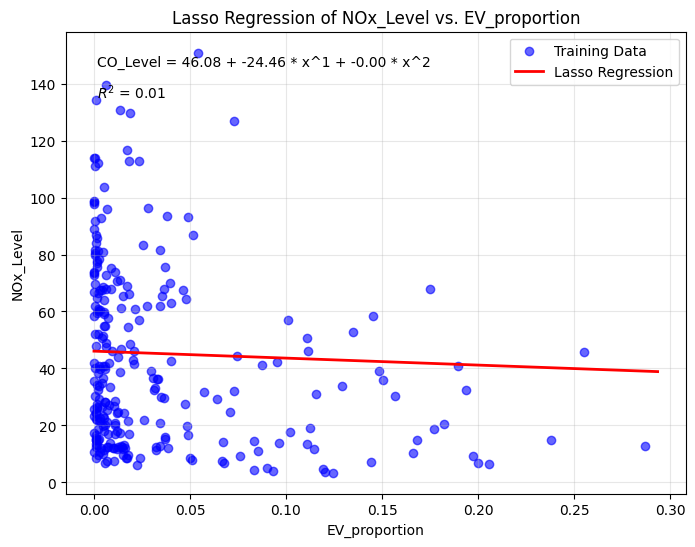

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --> straight line since the EV_proportion^2 is not contributing enough and is hence set to 0

# Prepare equation string for polynomial regression (using coefficients)
equation_terms = []
for i, coef in enumerate(lasso_model.coef_):
    if i == 0:
        equation_terms.append(f"{coef:.2f}")  # intercept
    else:
        equation_terms.append(f"{coef:.2f} * x^{i}")
equation = " + ".join(equation_terms)
r2_text = f"$R^2$ = {r2_lasso:.2f}"

# 1. Generate a sequence of points for plotting the curve
X_seq = np.linspace(X_train['EV_proportion'].min(), X_train['EV_proportion'].max(), 300).reshape(-1, 1)

# 2. Transform the sequence using the same PolynomialFeatures object used for training
X_seq_poly = poly.transform(X_seq)

# 3. Predict NOx_Level using the Lasso model
y_pred = lasso_model.predict(X_seq_poly)

# 4. Create the plot
plt.figure(figsize=(8, 6))  # Adjust figure size if needed
plt.scatter(X_test['EV_proportion'], y_test, color='blue', alpha=0.6, label='Training Data')  # Plot training data points
plt.plot(X_seq, y_pred, color='red', linewidth=2, label='Lasso Regression')  # Plot the Lasso regression curve
plt.xlabel('EV_proportion')


# Annotate equation and R2
plt.text(0.05, 0.95, f"CO_Level = {equation}", transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')


plt.ylabel('NOx_Level')
plt.title('Lasso Regression of NOx_Level vs. EV_proportion')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

### Ridge regression

In [ ]:
from sklearn.linear_model import Ridge

In [ ]:
# Set up the model
ridge_model = Ridge(alpha=1.0, fit_intercept=False)

# Use fit
ridge_model.fit(X_train_poly, y_train)

# Check the score/accuracy
print("R\u00b2 Score of the model: ", round(ridge_model.score(X_train_poly, y_train), 3))

# Print the coefficients of the linear model
model_coeff = pd.DataFrame(ridge_model.coef_.flatten(),
                     index=X_poly_features,
                     columns=['Coefficients Ridge model'])
model_coeff['Coefficients Lasso model']=lasso_model.coef_.flatten()
model_coeff['Coefficients polynomial model']=model_poly.coef_.flatten()
model_coeff

R² Score of the model:  0.026


,Coefficients Ridge model,Coefficients Lasso model,Coefficients polynomial model
1,48.006813,46.080269,50.558181
EV_proportion,-84.101807,-24.462236,-238.852210
EV_proportion^2,-6.734311,-0.000000,697.208447


In [ ]:
# Predict:
predictions = ridge_model.predict(X_test_poly)

# Compute the MAE, the MSE and the R^2 on the test set
mae_ridge = mean_absolute_error(y_test, predictions)
mse_ridge = mean_squared_error(y_test, predictions)
r2_ridge = r2_score(y_test, predictions)

# Compute the MAE, the MSE and the R^2 on the training set
predictions_train = ridge_model.predict(X_train_poly)
mae_train_ridge = mean_absolute_error(y_train, predictions_train)
mse_train_ridge = mean_squared_error(y_train, predictions_train)
r2_train_ridge = r2_score(y_train, predictions_train)

print(f"MAE test set: {mae_ridge:0.2f}; MAE training set: {mae_train_ridge:0.2f};")
print(f"MSE test set: {mse_ridge:0.2f}; MSE training set: {mse_train_ridge:0.2f};")
print(f"R\u00b2 test set: {r2_ridge:0.2f}; R\u00b2 training set: {r2_train_ridge:0.2f};" )

MAE test set: 25.80; MAE training set: 26.44;
MSE test set: 954.23; MSE training set: 1056.42;
R² test set: 0.04; R² training set: 0.03;


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


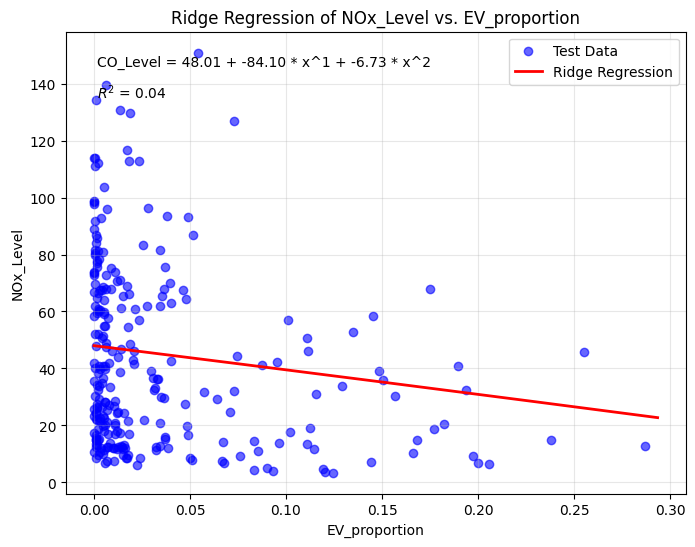

In [ ]:
# Prepare equation string for polynomial regression (using coefficients)
equation_terms = []
for i, coef in enumerate(ridge_model.coef_):
    if i == 0:
        equation_terms.append(f"{coef:.2f}")  # intercept
    else:
        equation_terms.append(f"{coef:.2f} * x^{i}")
equation = " + ".join(equation_terms)
r2_text = f"$R^2$ = {r2_ridge:.2f}"


# 1. Generate a sequence of points for plotting the curve
X_seq = np.linspace(X_train['EV_proportion'].min(), X_train['EV_proportion'].max(), 300).reshape(-1, 1)

# 2. Transform the sequence using the same PolynomialFeatures object used for training
X_seq_poly = poly.transform(X_seq)

# 3. Predict NOx_Level using the Ridge model
y_pred = ridge_model.predict(X_seq_poly)

# 4. Create the plot
plt.figure(figsize=(8, 6))  # Adjust figure size if needed
plt.scatter(X_test['EV_proportion'], y_test, color='blue', alpha=0.6, label='Test Data')  # Plot test data points
plt.plot(X_seq, y_pred, color='red', linewidth=2, label='Ridge Regression')  # Plot the Ridge regression curve
plt.xlabel('EV_proportion')

# Annotate equation and R2
plt.text(0.05, 0.95, f"CO_Level = {equation}", transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

plt.ylabel('NOx_Level')
plt.title('Ridge Regression of NOx_Level vs. EV_proportion')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
model_comparison = pd.DataFrame([mae, mse, r2], index=['MAE', 'MSE', 'R2'], columns=['Polynomial model'])
model_comparison['LASSO']=[mae_lasso, mse_lasso,r2_lasso]
model_comparison['Ridge']=[mae_ridge, mse_ridge, r2_ridge]
model_comparison

,Polynomial model,LASSO,Ridge
MAE,25.620856,26.253608,25.796156
MSE,945.799947,982.308314,954.225934
R2,0.046752,0.009956,0.038260


### Ridge Crossvalidation

In [ ]:
from sklearn.linear_model import RidgeCV

In [ ]:
# Set up the model
ridge_cv_model = RidgeCV(cv=5, fit_intercept=False)

# Use fit
ridge_cv_model.fit(X_train_poly, y_train)

# Check the score/accuracy
print("R\u00b2 Score of the model: ", round(ridge_cv_model.score(X_train_poly, y_train), 3))

# Print the coefficients of the linear model
model_coeff['Coefficients Ridge-CV model']=ridge_cv_model.coef_.flatten()
model_coeff

R² Score of the model:  0.03


,Coefficients Ridge model,Coefficients Lasso model,Coefficients polynomial model,Coefficients Ridge-CV model
1,48.006813,46.080269,50.558181,49.150408
EV_proportion,-84.101807,-24.462236,-238.852210,-126.664825
EV_proportion^2,-6.734311,-0.000000,697.208447,44.531011


In [ ]:
# Predict:
predictions = ridge_cv_model.predict(X_test_poly)

# Compute the MAE, the MSE and the R^2 on the test set
mae_ridge_cv = mean_absolute_error(y_test, predictions)
mse_ridge_cv = mean_squared_error(y_test, predictions)
r2_ridge_cv = r2_score(y_test, predictions)

# Compute the MAE, the MSE and the R^2 on the training set
predictions_train = ridge_cv_model.predict(X_train_poly)
mae_train_ridge_cv = mean_absolute_error(y_train, predictions_train)
mse_train_ridge_cv = mean_squared_error(y_train, predictions_train)
r2_train_ridge_cv = r2_score(y_train, predictions_train)

print(f"MAE test set: {mae_ridge:0.2f}; MAE training set: {mae_train_ridge:0.2f};")
print(f"MSE test set: {mse_ridge:0.2f}; MSE training set: {mse_train_ridge:0.2f};")
print(f"R\u00b2 test set: {r2_ridge:0.2f}; R\u00b2 training set: {r2_train_ridge:0.2f};" )

MAE test set: 25.80; MAE training set: 26.44;
MSE test set: 954.23; MSE training set: 1056.42;
R² test set: 0.04; R² training set: 0.03;


In [ ]:
model_comparison['Ridge with Cross Validation']=[mae_ridge_cv, mse_ridge_cv,r2_ridge_cv]
model_comparison

,Polynomial model,LASSO,Ridge,Ridge with Cross Validation
MAE,25.620856,26.253608,25.796156,25.653270
MSE,945.799947,982.308314,954.225934,946.599544
R2,0.046752,0.009956,0.038260,0.045946


## CO regressions

### Simple regression

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [ ]:
y = CO_EV_merged['CO_Level']
X = CO_EV_merged[['EV_proportion']]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, shuffle=True)

In [ ]:
# 1. Set up the model
model = LinearRegression(fit_intercept= True)
# 2. Use fit
model.fit(X_train, y_train)
# 3. Check the score/accuracy
print("R\u00b2 Score of the model: ", round(model.score(X_train, y_train), 3))

R² Score of the model:  0.063


In [ ]:
print("Intercept: ", model.intercept_)
print("Features coefficients (weigths): ", model.coef_.flatten()[0])

Intercept:  0.40439058760913665
Features coefficients (weigths):  -0.7718359251561521


In [ ]:
#Model prediction from X_test
predictions = model.predict(X_test)

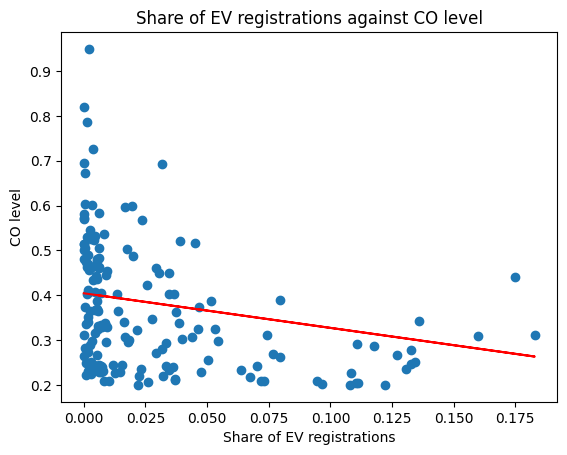

In [ ]:
# Plot the prediction (the line) over the true value (the dots)
plt.scatter(X_test, y_test)
plt.plot(X_test, predictions, 'r')
plt.title("Share of EV registrations against CO level")
plt.xlabel('Share of EV registrations')
plt.ylabel('CO level')
plt.show()

In [ ]:
# Compute the MAE, the MSE and the R^2
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MAE: {mae:0.2f}")
print(f"MSE: {mse:0.2f}")
print(f"R\u00b2: {r2:0.2f} " )

MAE: 0.11
MSE: 0.02
R²: 0.10 


In [ ]:
predictions_train = model.predict(X_train)
mae_train = mean_absolute_error(y_train, predictions_train)
mse_train = mean_squared_error(y_train, predictions_train)
r2_train = r2_score(y_train, predictions_train)

print(f"MAE test set: {mae:0.2f}; MAE train set: {mae_train:0.2f};")
print(f"MSE test set: {mse:0.2f}; MSE train set: {mse_train:0.2f};")
print(f"R\u00b2 test set: {r2:0.2f}; R\u00b2 train set: {r2_train:0.2f};" )

MAE test set: 0.11; MAE train set: 0.10;
MSE test set: 0.02; MSE train set: 0.02;
R² test set: 0.10; R² train set: 0.06;


### Polynomial regression

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

In [ ]:
# We will use a degree 2
poly = PolynomialFeatures(2)
# Transform our training and test set
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Feature name:
X_poly_features = poly.get_feature_names_out(['EV_proportion'])
print(X_poly_features)

['1' 'EV_proportion' 'EV_proportion^2']


In [ ]:
# Set up the model
model_poly = LinearRegression(fit_intercept=False) # we don't need fit intercept since polynomial features function add a column of ones to the data

# Fit
model_poly.fit(X_train_poly, y_train)

# Check the score/accuracy
print("R\u00b2 Score of the model: ", round(model_poly.score(X_train_poly, y_train), 3))

# Print the coefficients of the linear model
model_coeff = pd.DataFrame(model_poly.coef_.flatten(),
                     index=X_poly_features,
                     columns=['Coefficients polynomial model'])
model_coeff # Get the coefficients, w

R² Score of the model:  0.086


,Coefficients polynomial model
1,0.417665
EV_proportion,-1.867858
EV_proportion^2,6.497539


In [ ]:
# Predict:
predictions = model_poly.predict(X_test_poly)

# Compute the MAE, the MSE and the R^2 on the test set
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

# Compute the MAE, the MSE and the R^2 on the training set
predictions_train = model_poly.predict(X_train_poly)
mae_train = mean_absolute_error(y_train, predictions_train)
mse_train = mean_squared_error(y_train, predictions_train)
r2_train = r2_score(y_train, predictions_train)

print(f"MAE test set: {mae:0.2f}; MAE training set: {mae_train:0.2f};")
print(f"MSE test set: {mse:0.2f}; MSE training set: {mse_train:0.2f};")
print(f"R\u00b2 test set: {r2:0.2f}; R\u00b2 training set: {r2_train:0.2f};" )

MAE test set: 0.10; MAE training set: 0.10;
MSE test set: 0.02; MSE training set: 0.02;
R² test set: 0.15; R² training set: 0.09;


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


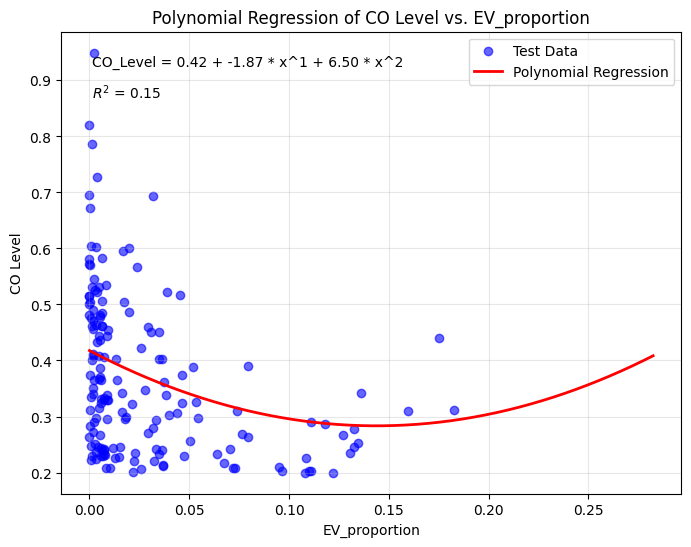

In [ ]:
# Prepare equation string for polynomial regression (using coefficients)
equation_terms = []
for i, coef in enumerate(model_poly.coef_):
    if i == 0:
        equation_terms.append(f"{coef:.2f}")  # intercept
    else:
        equation_terms.append(f"{coef:.2f} * x^{i}")
equation = " + ".join(equation_terms)
r2_text = f"$R^2$ = {r2:.2f}"

# 1. Generate a sequence of points to plot the curve
X_seq = np.linspace(X_train['EV_proportion'].min(), X_train['EV_proportion'].max(), 300).reshape(-1, 1)  # 300 points for smooth curve

# 2. Transform X_seq using the PolynomialFeatures object
X_seq_poly = poly.transform(X_seq)  # 'poly' is your PolynomialFeatures object

# 3. Predict y values using the transformed X_seq
y_pred = model_poly.predict(X_seq_poly)

# 4. Plot the original data points and the regression curve
plt.figure(figsize=(8, 6))
plt.scatter(X_test['EV_proportion'], y_test, color='blue', alpha=0.6, label='Test Data')
plt.plot(X_seq, y_pred, color='red', linewidth=2, label='Polynomial Regression')

# Annotate equation and R2
plt.text(0.05, 0.95, f"CO_Level = {equation}", transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

plt.xlabel('EV_proportion')
plt.ylabel('CO Level')
plt.title('Polynomial Regression of CO Level vs. EV_proportion')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

### Lasso regression

In [ ]:
from sklearn.linear_model import Lasso

In [ ]:
# Set up the model
lasso_model = Lasso(alpha=0.001, fit_intercept=False)

# Use fit
lasso_model.fit(X_train_poly, y_train)

# Check the score/accuracy
print("R\u00b2 Score of the model: ", round(lasso_model.score(X_train_poly, y_train), 3))

# Print the coefficients of the linear model
model_coeff = pd.DataFrame(lasso_model.coef_.flatten(),
                     index=X_poly_features,
                     columns=['Coefficients Lasso model'])
model_coeff

R² Score of the model:  0.035


,Coefficients Lasso model
1,0.388493
EV_proportion,-0.256076
EV_proportion^2,-0.000000


In [ ]:
# Predict:
predictions = lasso_model.predict(X_test_poly)

# Compute the MAE, the MSE and the R^2 on the test set
mae_lasso = mean_absolute_error(y_test, predictions)
mse_lasso = mean_squared_error(y_test, predictions)
r2_lasso = r2_score(y_test, predictions)

# Compute the MAE, the MSE and the R^2 on the training set
predictions_train = lasso_model.predict(X_train_poly)
mae_train_lasso = mean_absolute_error(y_train, predictions_train)
mse_train_lasso = mean_squared_error(y_train, predictions_train)
r2_train_lasso = r2_score(y_train, predictions_train)

print(f"MAE test set: {mae_lasso:0.2f}; MAE training set: {mae_train_lasso:0.2f};")
print(f"MSE test set: {mse_lasso:0.2f}; MSE training set: {mse_train_lasso:0.2f};")
print(f"R\u00b2 test set: {r2_lasso:0.2f}; R\u00b2 training set: {r2_train_lasso:0.2f};" )

MAE test set: 0.11; MAE training set: 0.10;
MSE test set: 0.02; MSE training set: 0.02;
R² test set: 0.04; R² training set: 0.03;


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


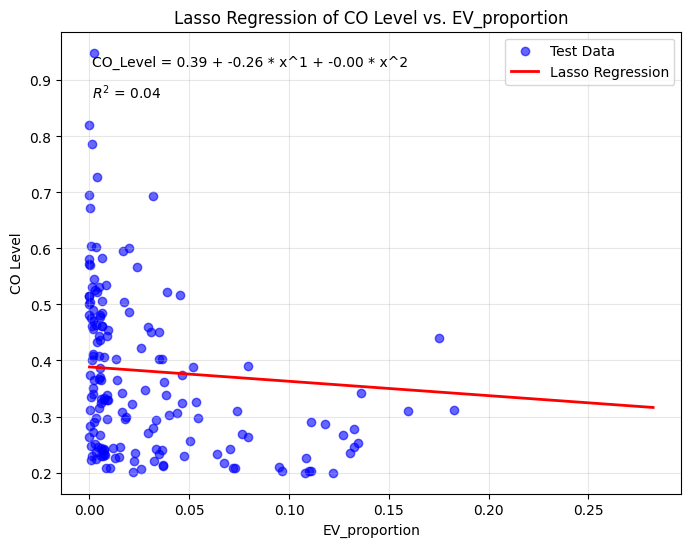

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --> straight line since the EV_proportion^2 is not contributing enough and is hence set to 0


# Prepare equation string for polynomial regression (using coefficients)
equation_terms = []
for i, coef in enumerate(lasso_model.coef_):
    if i == 0:
        equation_terms.append(f"{coef:.2f}")  # intercept
    else:
        equation_terms.append(f"{coef:.2f} * x^{i}")
equation = " + ".join(equation_terms)
r2_text = f"$R^2$ = {r2_lasso:.2f}"

# 1. Generate a sequence of points for plotting the curve
X_seq = np.linspace(X_train['EV_proportion'].min(), X_train['EV_proportion'].max(), 300).reshape(-1, 1)

# 2. Transform the sequence using the same PolynomialFeatures object used for training
X_seq_poly = poly.transform(X_seq)

# 3. Predict NOx_Level using the Lasso model
y_pred = lasso_model.predict(X_seq_poly)

# 4. Create the plot
plt.figure(figsize=(8, 6))  # Adjust figure size if needed
plt.scatter(X_test['EV_proportion'], y_test, color='blue', alpha=0.6, label='Test Data')  # Plot training data points
plt.plot(X_seq, y_pred, color='red', linewidth=2, label='Lasso Regression')  # Plot the Lasso regression curve
plt.xlabel('EV_proportion')

# Annotate equation and R2
plt.text(0.05, 0.95, f"CO_Level = {equation}", transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

plt.ylabel('CO Level')
plt.title('Lasso Regression of CO Level vs. EV_proportion')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

### Ridge regression

In [ ]:
from sklearn.linear_model import Ridge

In [ ]:
# Set up the model
ridge_model = Ridge(alpha=1.0, fit_intercept=False)

# Use fit
ridge_model.fit(X_train_poly, y_train)

# Check the score/accuracy
print("R\u00b2 Score of the model: ", round(ridge_model.score(X_train_poly, y_train), 3))

# Print the coefficients of the linear model
model_coeff = pd.DataFrame(ridge_model.coef_.flatten(),
                     index=X_poly_features,
                     columns=['Coefficients Ridge model'])
model_coeff['Coefficients Lasso model']=lasso_model.coef_.flatten()
model_coeff['Coefficients polynomial model']=model_poly.coef_.flatten()
model_coeff

R² Score of the model:  0.051


,Coefficients Ridge model,Coefficients Lasso model,Coefficients polynomial model
1,0.393956,0.388493,0.417665
EV_proportion,-0.428611,-0.256076,-1.867858
EV_proportion^2,-0.029376,-0.000000,6.497539


In [ ]:
# Predict:
predictions = ridge_model.predict(X_test_poly)

# Compute the MAE, the MSE and the R^2 on the test set
mae_ridge = mean_absolute_error(y_test, predictions)
mse_ridge = mean_squared_error(y_test, predictions)
r2_ridge = r2_score(y_test, predictions)

# Compute the MAE, the MSE and the R^2 on the training set
predictions_train = ridge_model.predict(X_train_poly)
mae_train_ridge = mean_absolute_error(y_train, predictions_train)
mse_train_ridge = mean_squared_error(y_train, predictions_train)
r2_train_ridge = r2_score(y_train, predictions_train)

print(f"MAE test set: {mae_ridge:0.2f}; MAE training set: {mae_train_ridge:0.2f};")
print(f"MSE test set: {mse_ridge:0.2f}; MSE training set: {mse_train_ridge:0.2f};")
print(f"R\u00b2 test set: {r2_ridge:0.2f}; R\u00b2 training set: {r2_train_ridge:0.2f};" )

MAE test set: 0.11; MAE training set: 0.10;
MSE test set: 0.02; MSE training set: 0.02;
R² test set: 0.06; R² training set: 0.05;


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


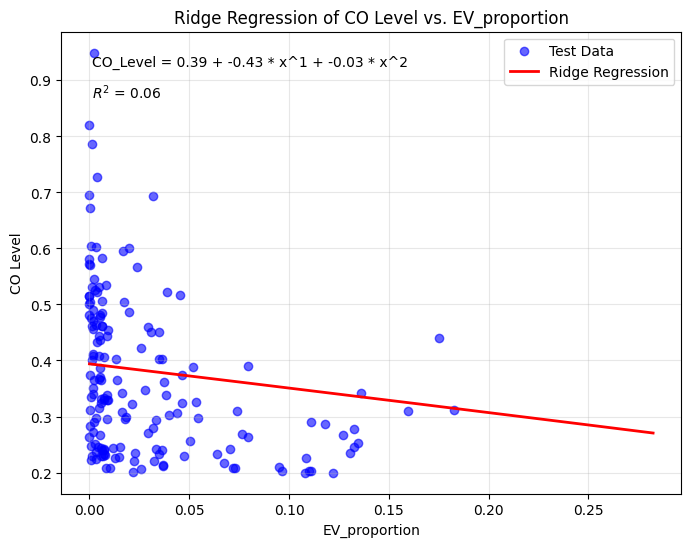

In [ ]:
equation_terms = []
for i, coef in enumerate(ridge_model.coef_):
    if i == 0:
        equation_terms.append(f"{coef:.2f}")  # intercept
    else:
        equation_terms.append(f"{coef:.2f} * x^{i}")
equation = " + ".join(equation_terms)
r2_text = f"$R^2$ = {r2_ridge:.2f}"

# 1. Generate a sequence of points for plotting the curve
X_seq = np.linspace(X_train['EV_proportion'].min(), X_train['EV_proportion'].max(), 300).reshape(-1, 1)

# 2. Transform the sequence using the same PolynomialFeatures object used for training
X_seq_poly = poly.transform(X_seq)

# 3. Predict NOx_Level using the Ridge model
y_pred = ridge_model.predict(X_seq_poly)

# 4. Create the plot
plt.figure(figsize=(8, 6))  # Adjust figure size if needed
plt.scatter(X_test['EV_proportion'], y_test, color='blue', alpha=0.6, label='Test Data')  # Plot test data points
plt.plot(X_seq, y_pred, color='red', linewidth=2, label='Ridge Regression')  # Plot the Ridge regression curve
plt.xlabel('EV_proportion')

# Annotate equation and R2
plt.text(0.05, 0.95, f"CO_Level = {equation}", transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')
plt.text(0.05, 0.89, r2_text, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')


plt.ylabel('CO Level')
plt.title('Ridge Regression of CO Level vs. EV_proportion')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
model_comparison = pd.DataFrame([mae, mse, r2], index=['MAE', 'MSE', 'R2'], columns=['Polynomial model'])
model_comparison['LASSO']=[mae_lasso, mse_lasso,r2_lasso]
model_comparison['Ridge']=[mae_ridge, mse_ridge, r2_ridge]
model_comparison

,Polynomial model,LASSO,Ridge
MAE,0.104461,0.114140,0.112208
MSE,0.017059,0.019251,0.018758
R2,0.146200,0.036499,0.061187


### Ridge Crossvalidation

In [ ]:
from sklearn.linear_model import RidgeCV

In [ ]:
# Set up the model
ridge_cv_model = RidgeCV(cv=5, fit_intercept=False)

# Use fit
ridge_cv_model.fit(X_train_poly, y_train)

# Check the score/accuracy
print("R\u00b2 Score of the model: ", round(ridge_cv_model.score(X_train_poly, y_train), 3))

# Print the coefficients of the linear model
model_coeff['Coefficients Ridge-CV model']=ridge_cv_model.coef_.flatten()
model_coeff

R² Score of the model:  0.065


,Coefficients Ridge model,Coefficients Lasso model,Coefficients polynomial model,Coefficients Ridge-CV model
1,0.393956,0.388493,0.417665,0.403200
EV_proportion,-0.428611,-0.256076,-1.867858,-0.760845
EV_proportion^2,-0.029376,-0.000000,6.497539,0.286925


In [ ]:
# Predict:
predictions = ridge_cv_model.predict(X_test_poly)

# Compute the MAE, the MSE and the R^2 on the test set
mae_ridge_cv = mean_absolute_error(y_test, predictions)
mse_ridge_cv = mean_squared_error(y_test, predictions)
r2_ridge_cv = r2_score(y_test, predictions)

# Compute the MAE, the MSE and the R^2 on the training set
predictions_train = ridge_cv_model.predict(X_train_poly)
mae_train_ridge_cv = mean_absolute_error(y_train, predictions_train)
mse_train_ridge_cv = mean_squared_error(y_train, predictions_train)
r2_train_ridge_cv = r2_score(y_train, predictions_train)

print(f"MAE test set: {mae_ridge:0.2f}; MAE training set: {mae_train_ridge:0.2f};")
print(f"MSE test set: {mse_ridge:0.2f}; MSE training set: {mse_train_ridge:0.2f};")
print(f"R\u00b2 test set: {r2_ridge:0.2f}; R\u00b2 training set: {r2_train_ridge:0.2f};" )

MAE test set: 0.11; MAE training set: 0.10;
MSE test set: 0.02; MSE training set: 0.02;
R² test set: 0.06; R² training set: 0.05;


In [ ]:
model_comparison['Ridge with Cross Validation']=[mae_ridge_cv, mse_ridge_cv,r2_ridge_cv]
model_comparison

,Polynomial model,LASSO,Ridge,Ridge with Cross Validation
MAE,0.104461,0.114140,0.112208,0.109865
MSE,0.017059,0.019251,0.018758,0.018112
R2,0.146200,0.036499,0.061187,0.093538


## Classification analysis NOx

In [ ]:
quantiles = NOX_EV_merged['NOx_Level'].quantile([0.3333, 0.6667])
NOX_EV_merged['NOx_Level_Category'] = pd.cut(NOX_EV_merged['NOx_Level'],
                                       bins=[-float('inf'), quantiles[0.3333], quantiles[0.6667], float('inf')],
                                       labels=['Low', 'Medium', 'High'],
                                       include_lowest=True, duplicates='drop')

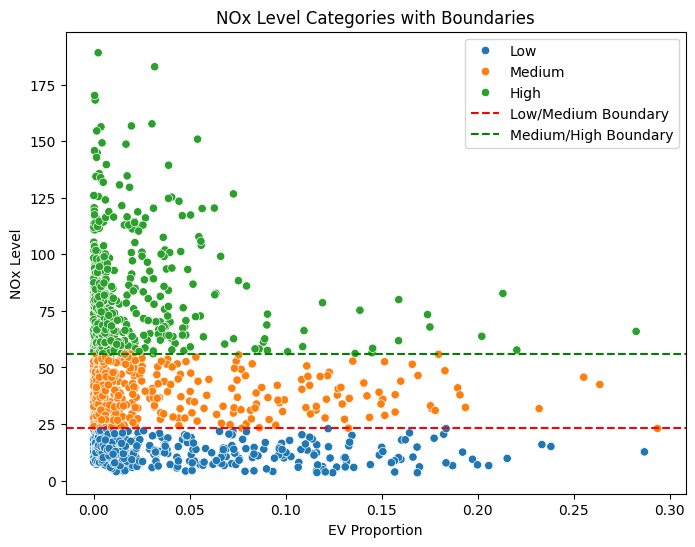

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
!pip install scikit-learn
from sklearn.model_selection import train_test_split

# Create a scatter plot of CO_Level vs. EV_proportion (or any other relevant variable)
plt.figure(figsize=(8, 6))
sns.scatterplot(x='EV_proportion', y='NOx_Level', data=NOX_EV_merged, hue='NOx_Level_Category')

# Add vertical lines for category boundaries
plt.axhline(y=quantiles[0.3333], color='red', linestyle='--', label='Low/Medium Boundary')
plt.axhline(y=quantiles[0.6667], color='green', linestyle='--', label='Medium/High Boundary')

# Set plot labels and title
plt.xlabel('EV Proportion')
plt.ylabel('NOx Level')
plt.title('NOx Level Categories with Boundaries')
plt.legend()
plt.show()

In [ ]:
y = NOX_EV_merged['NOx_Level_Category']
X = NOX_EV_merged[['EV_proportion']]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, shuffle=True)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# 1. Set up the Decision Tree model
# You might need to tune parameters like max_depth
model = DecisionTreeClassifier(class_weight='balanced', random_state=0) # Consider balanced class weights

# 2. Fit the model
model.fit(X_train, y_train)

# Now make predictions
predictions = model.predict(X_test)

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
category_mapping = {
    0: 'Low',
    1: 'Medium',
    2: 'High'
}

([<matplotlib.axis.YTick at 0x7b1b2a0d4d50>,
 [Text(0, 0, 'Low'), Text(0, 1, 'Medium'), Text(0, 2, 'High')])

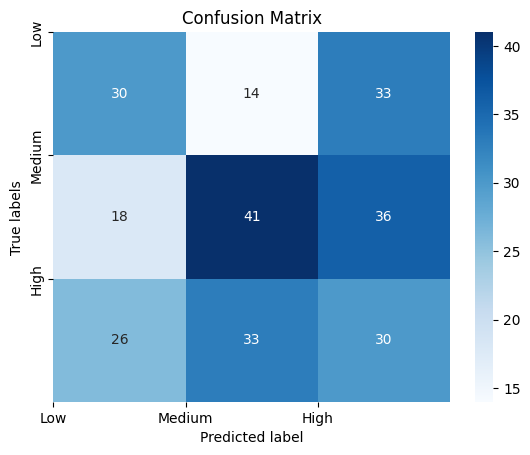

In [ ]:
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='.4g')
plt.xlabel('Predicted label')
plt.ylabel('True labels')
plt.title('Confusion Matrix');

# Set the tick labels according to your category mapping
plt.xticks(ticks=[0, 1, 2], labels=category_mapping.values())
plt.yticks(ticks=[0, 1, 2], labels=category_mapping.values())

In [ ]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

# Precision of each class
model_precision = precision_score(y_test, y_pred, average = None)
# Recall of each class
model_recall = recall_score(y_test, y_pred, average = None)
# F1 score of each class
model_f1 = f1_score(y_test, y_pred, average = None)

# Visualize all results in a dataframe:
model_eval = pd.DataFrame([model_precision, model_recall, model_f1],
                    index = ['Precision', 'Recall', 'F1 score'],
                    columns=['Low', 'Medium', 'High'])
model_eval

,Low,Medium,High
Precision,0.405405,0.465909,0.303030
Recall,0.389610,0.431579,0.337079
F1 score,0.397351,0.448087,0.319149


## Classification analysis CO

In [ ]:
quantiles = CO_EV_merged['CO_Level'].quantile([0.3333, 0.6667])
CO_EV_merged['CO_Level_Category'] = pd.cut(CO_EV_merged['CO_Level'],
                                       bins=[-float('inf'), quantiles[0.3333], quantiles[0.6667], float('inf')],
                                       labels=['Low', 'Medium', 'High'],
                                       include_lowest=True, duplicates='drop')

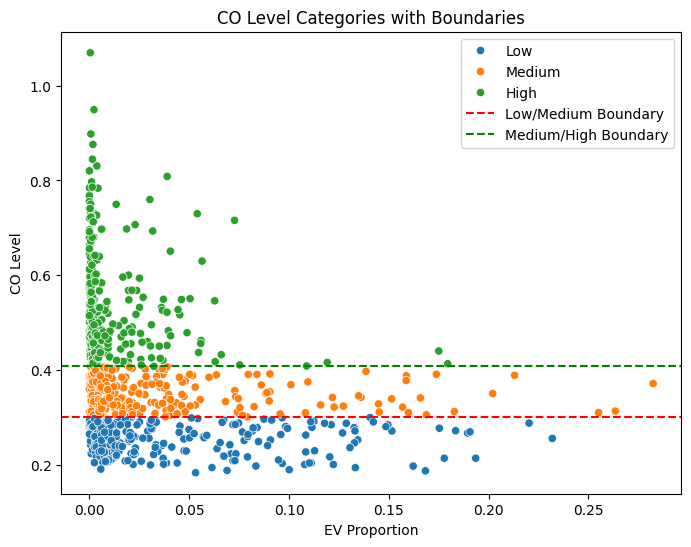

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
!pip install scikit-learn
from sklearn.model_selection import train_test_split

# Create a scatter plot of CO_Level vs. EV_proportion (or any other relevant variable)
plt.figure(figsize=(8, 6))
sns.scatterplot(x='EV_proportion', y='CO_Level', data=CO_EV_merged, hue='CO_Level_Category')

# Add vertical lines for category boundaries
plt.axhline(y=quantiles[0.3333], color='red', linestyle='--', label='Low/Medium Boundary')
plt.axhline(y=quantiles[0.6667], color='green', linestyle='--', label='Medium/High Boundary')

# Set plot labels and title
plt.xlabel('EV Proportion')
plt.ylabel('CO Level')
plt.title('CO Level Categories with Boundaries')
plt.legend()
plt.show()

In [ ]:
y = CO_EV_merged['CO_Level_Category']
X = CO_EV_merged[['EV_proportion']]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, shuffle=True)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# 1. Set up the Decision Tree model
# You might need to tune parameters like max_depth
model = DecisionTreeClassifier(class_weight='balanced', random_state=0) # Consider balanced class weights

# 2. Fit the model
model.fit(X_train, y_train)

# Now make predictions
predictions = model.predict(X_test)

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
category_mapping = {
    0: 'Low',
    1: 'Medium',
    2: 'High'
}

([<matplotlib.axis.YTick at 0x7b1b29452610>,
 [Text(0, 0, 'Low'), Text(0, 1, 'Medium'), Text(0, 2, 'High')])

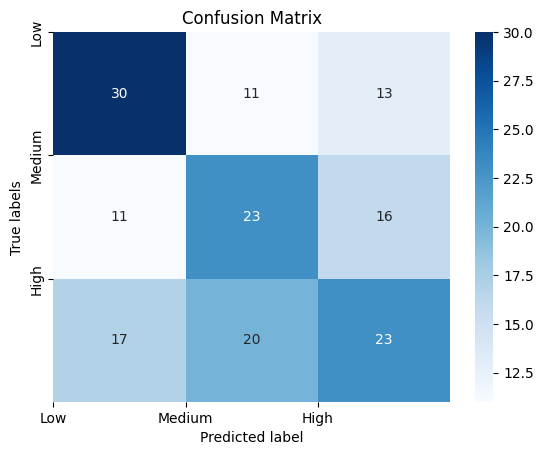

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='.4g')
plt.xlabel('Predicted label')
plt.ylabel('True labels')
plt.title('Confusion Matrix');

# Set the tick labels according to your category mapping
plt.xticks(ticks=[0, 1, 2], labels=category_mapping.values())
plt.yticks(ticks=[0, 1, 2], labels=category_mapping.values())

In [ ]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

# Precision of each class
model_precision = precision_score(y_test, y_pred, average = None)
# Recall of each class
model_recall = recall_score(y_test, y_pred, average = None)
# F1 score of each class
model_f1 = f1_score(y_test, y_pred, average = None)

# Visualize all results in a dataframe:
model_eval = pd.DataFrame([model_precision, model_recall, model_f1],
                    index = ['Precision', 'Recall', 'F1 score'],
                    columns=['Low', 'Medium', 'High'])
model_eval

,Low,Medium,High
Precision,0.517241,0.425926,0.442308
Recall,0.555556,0.460000,0.383333
F1 score,0.535714,0.442308,0.410714
